In [1]:
import os
import sys
sys.path.append(os.path.dirname(os.path.abspath('')))


from utils import *
import utils as ut

In [2]:
whos

Variable                 Type        Data/Info
----------------------------------------------
ADASYN                   ABCMeta     <class 'imblearn.over_sampling._adasyn.ADASYN'>
BaseEstimator            type        <class 'sklearn.base.BaseEstimator'>
BorderlineSMOTE          ABCMeta     <class 'imblearn.over_sam<...>.filter.BorderlineSMOTE'>
DecisionTreeClassifier   ABCMeta     <class 'sklearn.tree._cla<...>.DecisionTreeClassifier'>
GridSearchCV             ABCMeta     <class 'sklearn.model_sel<...>on._search.GridSearchCV'>
KFold                    ABCMeta     <class 'sklearn.model_selection._split.KFold'>
KMeansSMOTE              ABCMeta     <class 'imblearn.over_sam<...>ote.cluster.KMeansSMOTE'>
LGBMClassifier           type        <class 'lightgbm.sklearn.LGBMClassifier'>
LinearSVC                type        <class 'sklearn.svm._classes.LinearSVC'>
LogisticRegression       type        <class 'sklearn.linear_mo<...>stic.LogisticRegression'>
MinMaxScaler             type        <cla

# < 전처리 경우의 수 > 


### 이상 index  삭제 16가지

- 원핫인코딩 적용 8가지
    - NULL값 적용 4가지 (스케일링 - MinMax, Standard, Robuster, 없음)
    - NULL값 미적용 4가지 (스케일링 - MinMax, Standard, Robuster, 없음)
        
- 원핫인코딩 미적용 8가지
    - NULL값 적용 4가지 (스케일링 - MinMax, Standard, Robuster, 없음)
    - NULL값 미적용 4가지 (스케일링 - MinMax, Standard, Robuster, 없음)
    
----------------------------------------------------------------------------------------------

## 총 16가지

# < 순서 >

### 1. 원핫인코딩 쓰지 않는 경우 - 8가지 
### 2. 원핫인코딩 쓰는 경우 - 8가지 

## 총 16가지



## 데이터 불러오기

## 1. 이상 index 삭제, 원핫인코딩 쓰지 않는 경우 - 8가지 

### 이상치 인덱스(대여시간, 사고시간, 대여기간 각각 맞지 않는 경우)

In [3]:
df = pd.read_csv("../../insurance_fraud_detect_data.csv")

# 41개 삭제
strange = [43, 1504, 1762, 11706, 12031, 12665, 480, 4515, 4651, 8596, 9904, 10635, 11104, 11120, 11994, 12956,
      12972, 14533, 14792, 15242, 209, 268, 12132, 8477, 12705, 8514, 532, 4158, 5401, 13077, 4595, 6839,
      11710, 12377, 15080, 1115, 5398, 5790, 9523, 9528, 12050]
socar = df.drop(strange)

socar.columns = ["c_"+str(i) for i in range(1,26)]
socar

,c_1,c_2,c_3,c_4,c_5,c_6,c_7,c_8,c_9,c_10,...,c_16,c_17,c_18,c_19,c_20,c_21,c_22,c_23,c_24,c_25
0,0,2,1,3,0,2,0,100,2,0,...,0,1,0,0,1,0,0,0,-1,0
1,0,1,0,4,0,4,0,0,3,1,...,0,1,1,1,2,1,1,1,0,1
2,0,1,0,4,1,4,0,100,3,1,...,12925040,3,1,0,2,1,1,1,0,1
3,0,3,1,3,0,4,0,0,2,0,...,0,3,1,0,1,0,0,0,-1,0
4,0,1,0,1,0,1,0,100,1,0,...,1209410,1,0,0,2,0,0,0,-1,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
15995,0,2,0,2,0,2,0,100,2,0,...,0,1,1,0,1,0,0,0,-1,0
15996,0,2,0,2,1,4,0,100,1,1,...,0,2,1,0,1,0,0,0,-1,0
15997,0,2,1,2,0,4,0,100,1,0,...,0,0,0,0,1,0,0,0,-1,1
15998,0,2,0,2,0,2,0,100,2,0,...,0,4,1,0,1,0,0,0,-1,0


In [4]:
# 데이터 분리
X_train, X_test, y_train, y_test = ut.split_train_test(socar)

==Split Result==
y_train :  [[0, 1], [12804, 34]]
y_test : [[0, 1], [3114, 7]]


In [5]:
X_train

,c_2,c_3,c_4,c_5,c_6,c_7,c_8,c_9,c_10,c_11,...,c_15,c_16,c_17,c_18,c_19,c_20,c_21,c_22,c_23,c_24
0,2,1,3,0,2,0,100,2,0,0,...,1.302547e+05,0,1,0,0,1,0,0,0,-1
3,3,1,3,0,4,0,0,2,0,0,...,1.341009e+06,0,3,1,0,1,0,0,0,-1
4,1,0,1,0,1,0,100,1,0,0,...,5.240306e+05,1209410,1,0,0,2,0,0,0,-1
6,1,1,3,0,4,0,100,3,0,0,...,0.000000e+00,1217280,0,0,0,1,1,2,1,2
8,2,0,4,0,4,0,0,1,0,0,...,0.000000e+00,0,1,0,0,1,1,1,1,2
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
15994,2,0,3,1,4,0,100,1,0,0,...,6.672931e+05,0,0,0,0,1,0,0,0,-1
15995,2,0,2,0,2,0,100,2,0,0,...,0.000000e+00,0,1,1,0,1,0,0,0,-1
15996,2,0,2,1,4,0,100,1,1,0,...,6.184394e+05,0,2,1,0,1,0,0,0,-1
15998,2,0,2,0,2,0,100,2,0,0,...,0.000000e+00,0,4,1,0,1,0,0,0,-1


## 첫째

### (1) NULL 값 유지,  (2) 데이터 분리, (3) SMOTE, (4) 스케일링 없음 

==Split Result==
y_train :  [[0, 1], [12804, 34]]
y_test : [[0, 1], [3114, 7]]
==Sampling Result==
y_train :  [[0, 1], [12804, 34]]
y_train_over : [[0, 1], [12804, 12804]]
[Pipeline] ............ (step 1 of 2) Processing scaler, total=   0.0s
[Pipeline] ............... (step 2 of 2) Processing clf, total=   0.1s
====Done Evaluation====
====Done Evaluation====


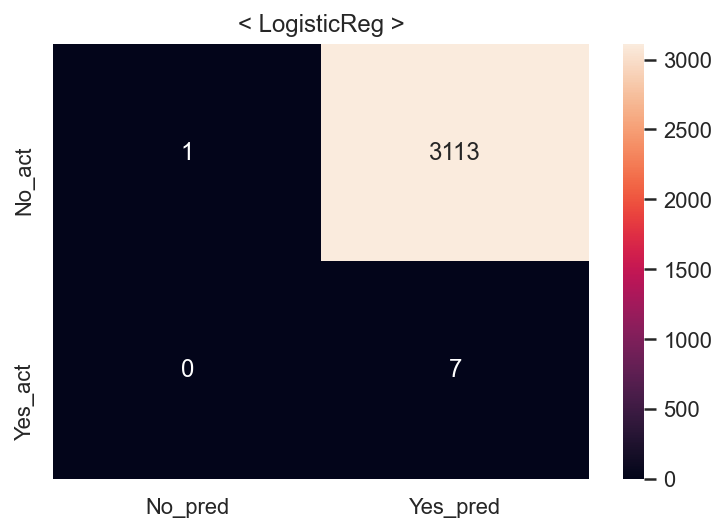

[Pipeline] ............ (step 1 of 2) Processing scaler, total=   0.0s
[Pipeline] ............... (step 2 of 2) Processing clf, total=   0.0s
====Done Evaluation====
====Done Evaluation====


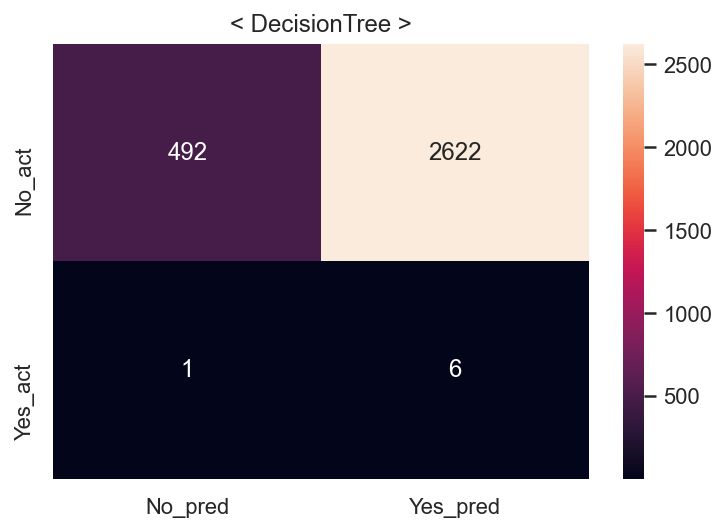

[Pipeline] ............ (step 1 of 2) Processing scaler, total=   0.0s
[Pipeline] ............... (step 2 of 2) Processing clf, total=   2.4s
====Done Evaluation====
====Done Evaluation====


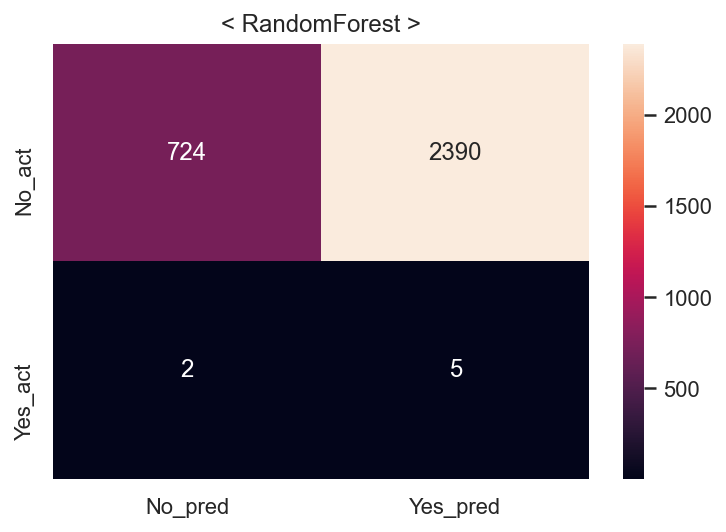

[Pipeline] ............ (step 1 of 2) Processing scaler, total=   0.0s
[Pipeline] ............... (step 2 of 2) Processing clf, total=   0.1s
====Done Evaluation====
====Done Evaluation====


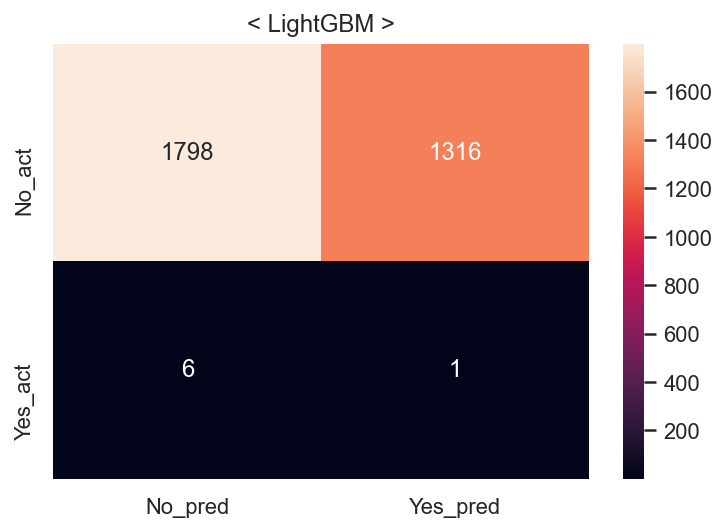

[Pipeline] ............ (step 1 of 2) Processing scaler, total=   0.0s
[Pipeline] ............... (step 2 of 2) Processing clf, total=  31.7s
====Done Evaluation====
====Done Evaluation====


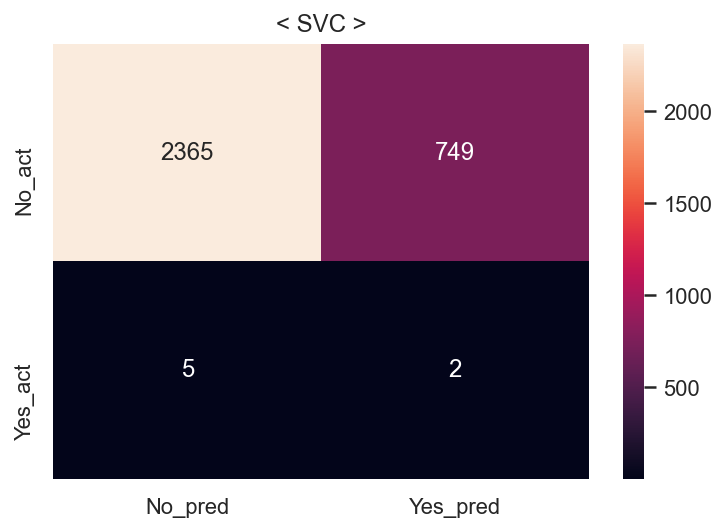

Fit time : 4.87 min


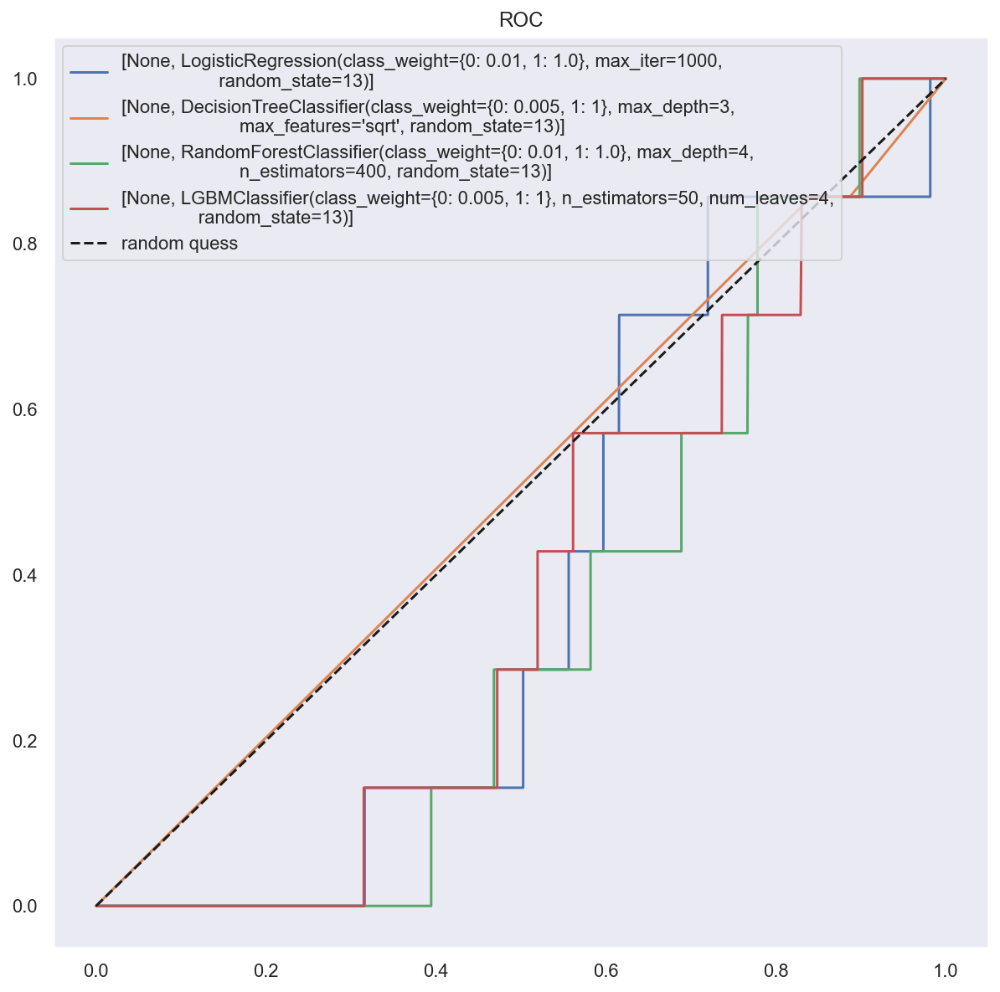

In [11]:
# 데이터 분리
X_train, X_test, y_train, y_test = ut.split_train_test(socar)
# sampling to SMOTE (default)
X_train_over, y_train_over = ut.fit_sampler(X_train, y_train, sampler='SMOTE')
# evaluation
cv_list, result_df = ut.fit_cv(X_train_over, y_train_over, X_test, y_test, scaler='No')

In [12]:
result_df['class_weight'] = [1] * len(result_df)
result_df["null_del"] = [0]  * len(result_df)
result_df["encoded"] = [0]  * len(result_df)
result_df["scaler"] = ["None"]  * len(result_df)
result_df["sampler"] = ["SMOTE"]  * len(result_df)
result_df = result_df[['class_weight', 'null_del', 'encoded', 'scaler', 'sampler', 'classifier', 'train accuracy', 'train precision',
                             'train recall', 'train f1', 'train auc', 'test accuracy', 'test precision', 'test recall',
                             'test f1', 'test auc']]
result_df

,class_weight,null_del,encoded,scaler,sampler,classifier,train accuracy,train precision,train recall,train f1,train auc,test accuracy,test precision,test recall,test f1,test auc
0,1,0,0,None,SMOTE,LogisticReg,0.500156,0.500078,1.000000,0.666736,0.500156,0.002563,0.002244,1.000000,0.004477,0.500161
1,1,0,0,None,SMOTE,DecisionTree,0.580405,0.543721,0.999922,0.704410,0.580405,0.159564,0.002283,0.857143,0.004554,0.507570
2,1,0,0,None,SMOTE,RandomForest,0.618283,0.567076,1.000000,0.723737,0.618283,0.233579,0.002088,0.714286,0.004163,0.473392
3,1,0,0,None,SMOTE,LightGBM,0.800804,0.715156,0.999844,0.833871,0.800804,0.576418,0.000759,0.142857,0.001511,0.360125
4,1,0,0,None,SMOTE,SVC,0.611332,0.657427,0.464933,0.544673,0.611332,0.758411,0.002663,0.285714,0.005277,0.522594


## 둘째

### (1) NULL 값 유지,  (2) 데이터 분리, (3) ADASYN, (4) 스케일링 없음 

In [13]:
# 데이터 분리
X_train, X_test, y_train, y_test = ut.split_train_test(socar)
# sampling to SMOTE (default)
X_train_over, y_train_over = ut.fit_sampler(X_train, y_train, sampler='ADASYN')

==Split Result==
y_train :  [[0, 1], [12804, 34]]
y_test : [[0, 1], [3114, 7]]
==Sampling Result==
y_train :  [[0, 1], [12804, 34]]
y_train_over : [[0, 1], [12804, 12818]]


[Pipeline] ............ (step 1 of 2) Processing scaler, total=   0.0s
[Pipeline] ............... (step 2 of 2) Processing clf, total=   0.1s
====Done Evaluation====
====Done Evaluation====


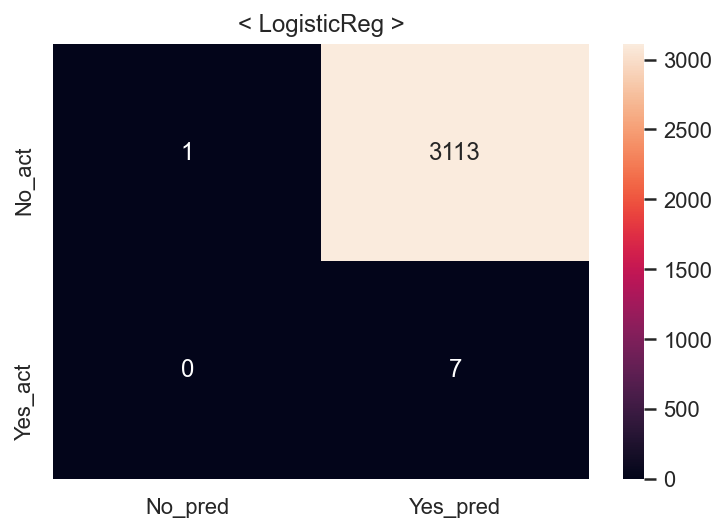

[Pipeline] ............ (step 1 of 2) Processing scaler, total=   0.0s
[Pipeline] ............... (step 2 of 2) Processing clf, total=   0.0s
====Done Evaluation====
====Done Evaluation====


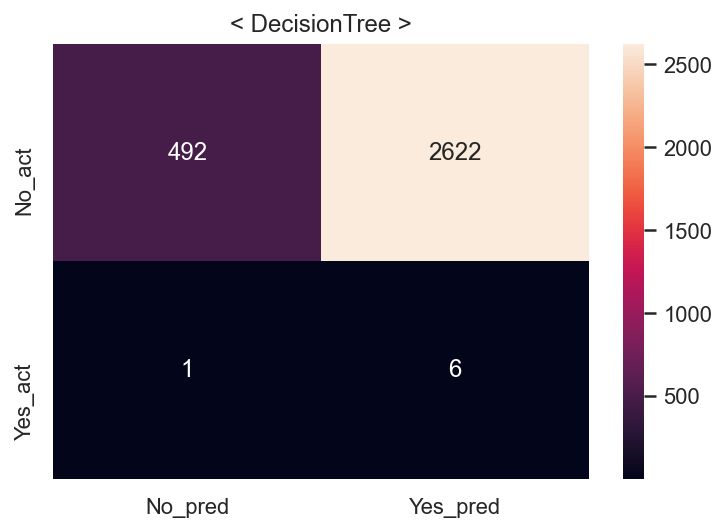

[Pipeline] ............ (step 1 of 2) Processing scaler, total=   0.0s
[Pipeline] ............... (step 2 of 2) Processing clf, total=   1.1s
====Done Evaluation====
====Done Evaluation====


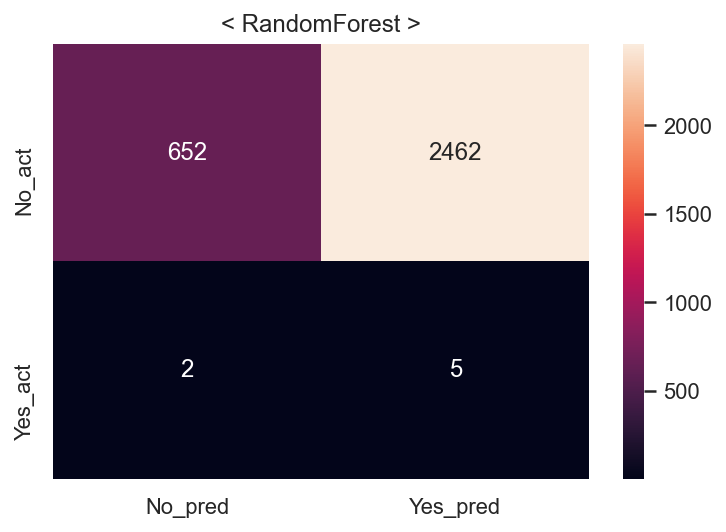

[Pipeline] ............ (step 1 of 2) Processing scaler, total=   0.0s
[Pipeline] ............... (step 2 of 2) Processing clf, total=   0.1s
====Done Evaluation====
====Done Evaluation====


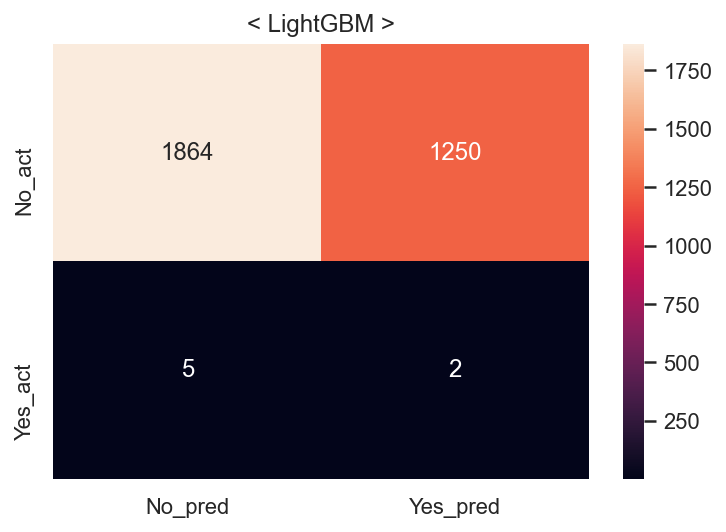

[Pipeline] ............ (step 1 of 2) Processing scaler, total=   0.0s
[Pipeline] ............... (step 2 of 2) Processing clf, total=  36.9s
====Done Evaluation====
====Done Evaluation====


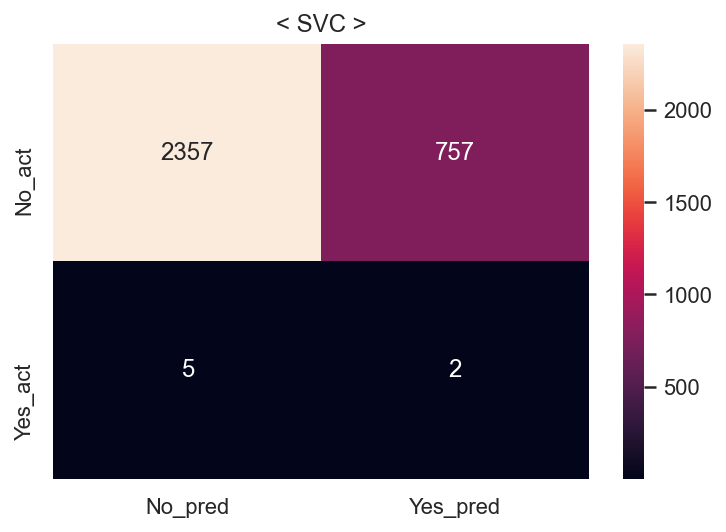

Fit time : 4.81 min


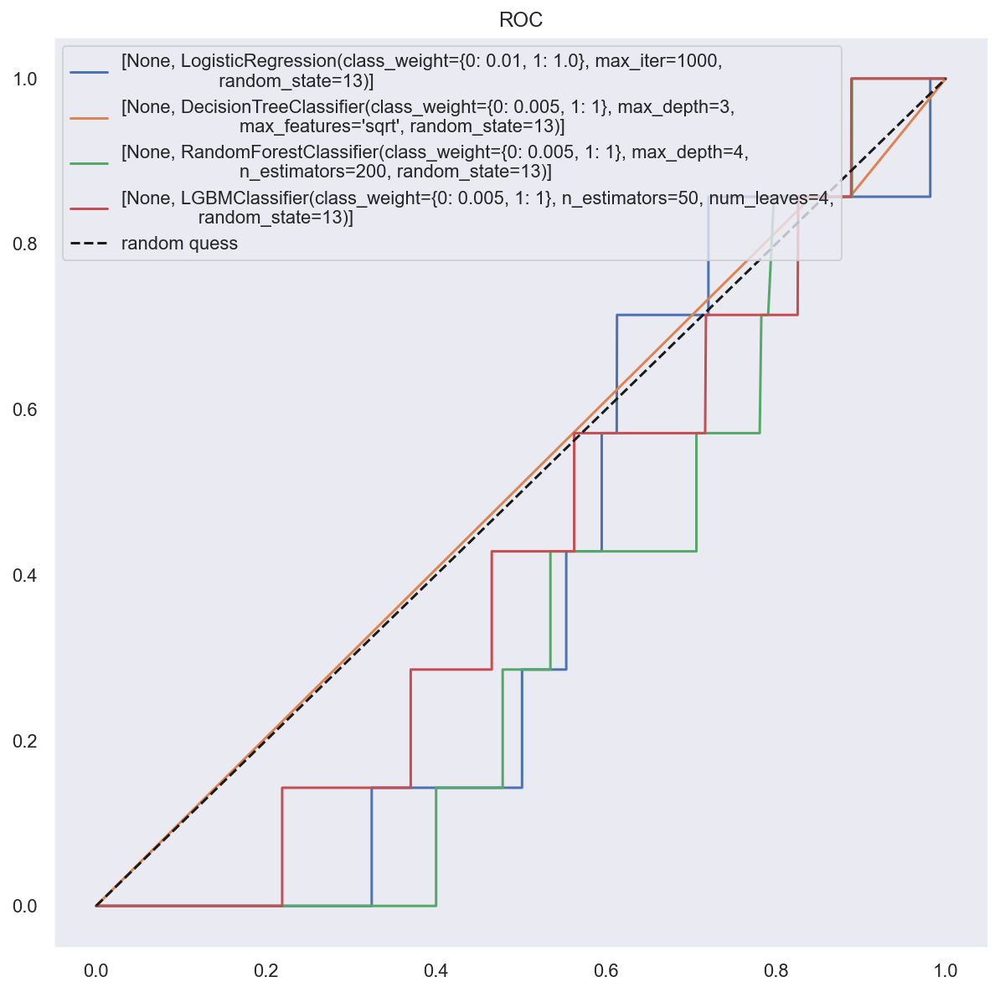

In [14]:
# evaluation
cv_list2, result_df2 = ut.fit_cv(X_train_over, y_train_over, X_test, y_test, scaler='No')

In [15]:
result_df2['class_weight'] = [1] * len(result_df2)
result_df2["null_del"] = [0]  * len(result_df2)
result_df2["encoded"] = [0]  * len(result_df2)
result_df2["scaler"] = ["None"]  * len(result_df2)
result_df2["sampler"] = ["ADASYN"]  * len(result_df2)
result_df2 = result_df2[['class_weight', 'null_del', 'encoded', 'scaler', 'sampler', 'classifier', 'train accuracy', 'train precision',
                             'train recall', 'train f1', 'train auc', 'test accuracy', 'test precision', 'test recall',
                             'test f1', 'test auc']]
result_df2

,class_weight,null_del,encoded,scaler,sampler,classifier,train accuracy,train precision,train recall,train f1,train auc,test accuracy,test precision,test recall,test f1,test auc
0,1,0,0,None,ADASYN,LogisticReg,0.500507,0.500390,1.000000,0.667014,0.500234,0.002563,0.002244,1.000000,0.004477,0.500161
1,1,0,0,None,ADASYN,DecisionTree,0.580634,0.543992,0.999922,0.704637,0.580405,0.159564,0.002283,0.857143,0.004554,0.507570
2,1,0,0,None,ADASYN,RandomForest,0.604715,0.558616,1.000000,0.716810,0.604499,0.210509,0.002027,0.714286,0.004042,0.461831
3,1,0,0,None,ADASYN,LightGBM,0.805870,0.720535,0.999688,0.837462,0.805764,0.597885,0.001597,0.285714,0.003177,0.442151
4,1,0,0,None,ADASYN,SVC,0.606861,0.652381,0.458418,0.538465,0.606942,0.755847,0.002635,0.285714,0.005222,0.521309


## 셋째
### (1) NULL 값 유지,  (2) 데이터 분리, (3) SMOTE, (4) 스케일링 MinMax

==Split Result==
y_train :  [[0, 1], [12804, 34]]
y_test : [[0, 1], [3114, 7]]
==Sampling Result==
y_train :  [[0, 1], [12804, 34]]
y_train_over : [[0, 1], [12804, 12804]]
[Pipeline] ............ (step 1 of 2) Processing scaler, total=   0.0s
[Pipeline] ............... (step 2 of 2) Processing clf, total=   0.1s
====Done Evaluation====
====Done Evaluation====


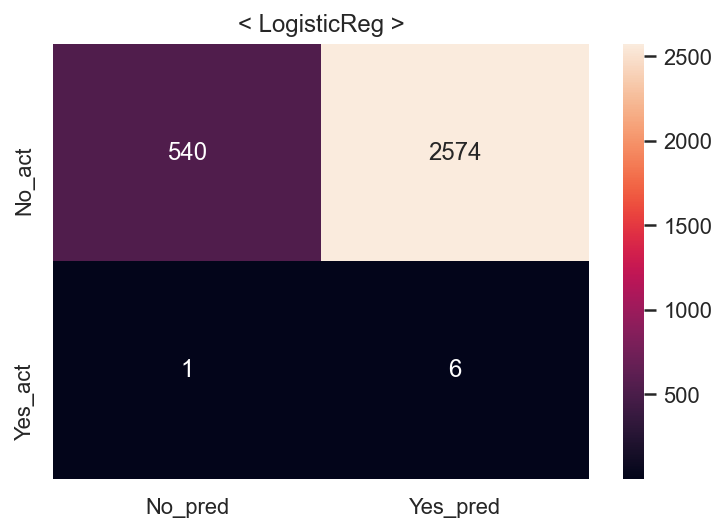

[Pipeline] ............ (step 1 of 2) Processing scaler, total=   0.0s
[Pipeline] ............... (step 2 of 2) Processing clf, total=   0.0s
====Done Evaluation====
====Done Evaluation====


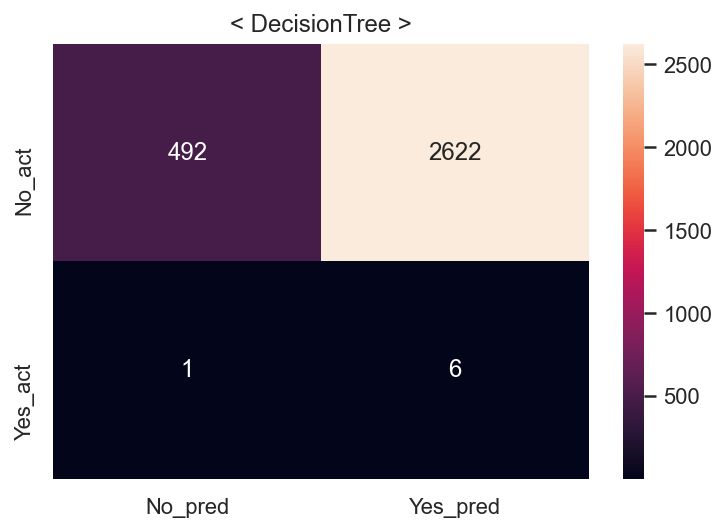

[Pipeline] ............ (step 1 of 2) Processing scaler, total=   0.0s
[Pipeline] ............... (step 2 of 2) Processing clf, total=   2.3s
====Done Evaluation====
====Done Evaluation====


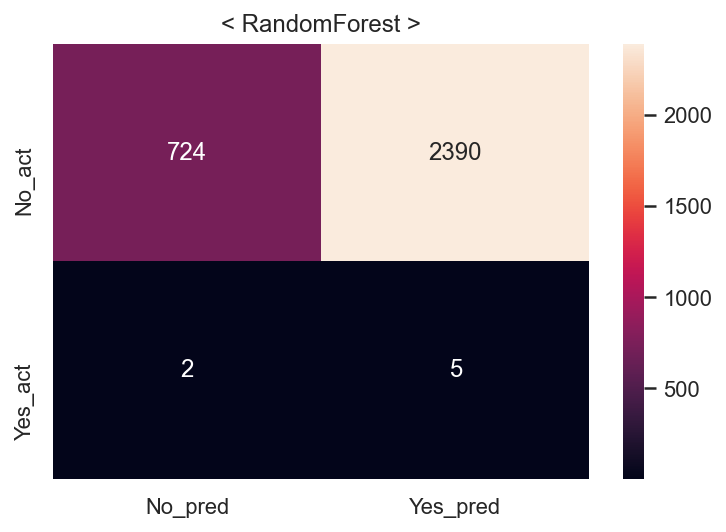

[Pipeline] ............ (step 1 of 2) Processing scaler, total=   0.0s
[Pipeline] ............... (step 2 of 2) Processing clf, total=   0.1s
====Done Evaluation====
====Done Evaluation====


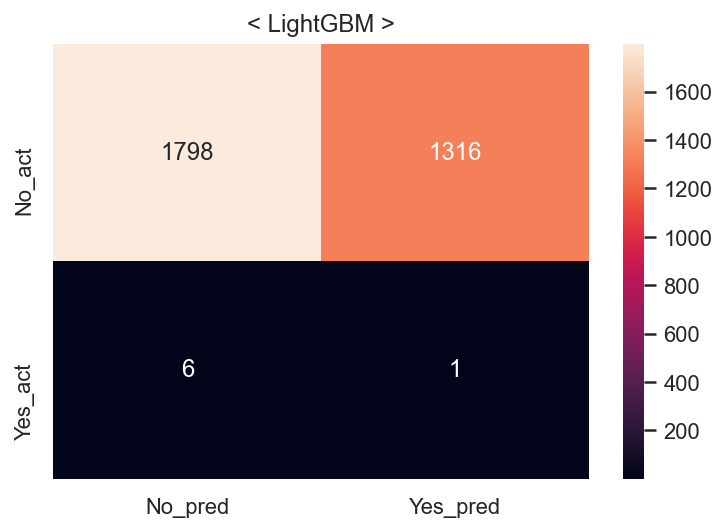

[Pipeline] ............ (step 1 of 2) Processing scaler, total=   0.0s
[Pipeline] ............... (step 2 of 2) Processing clf, total=   7.8s
====Done Evaluation====
====Done Evaluation====


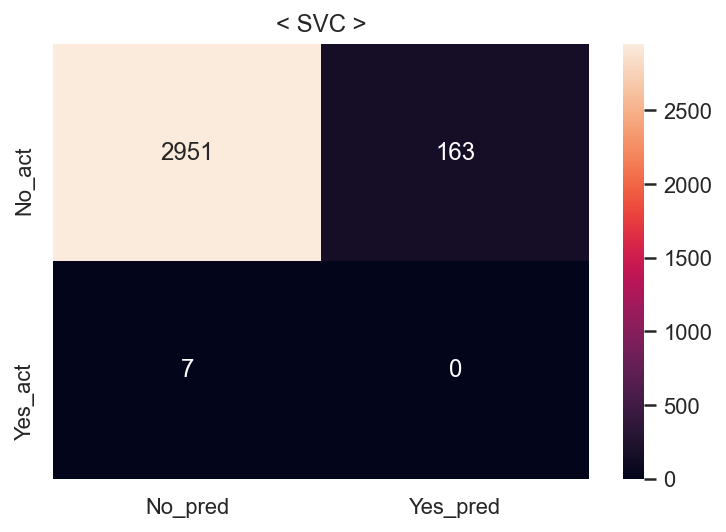

Fit time : 2.62 min


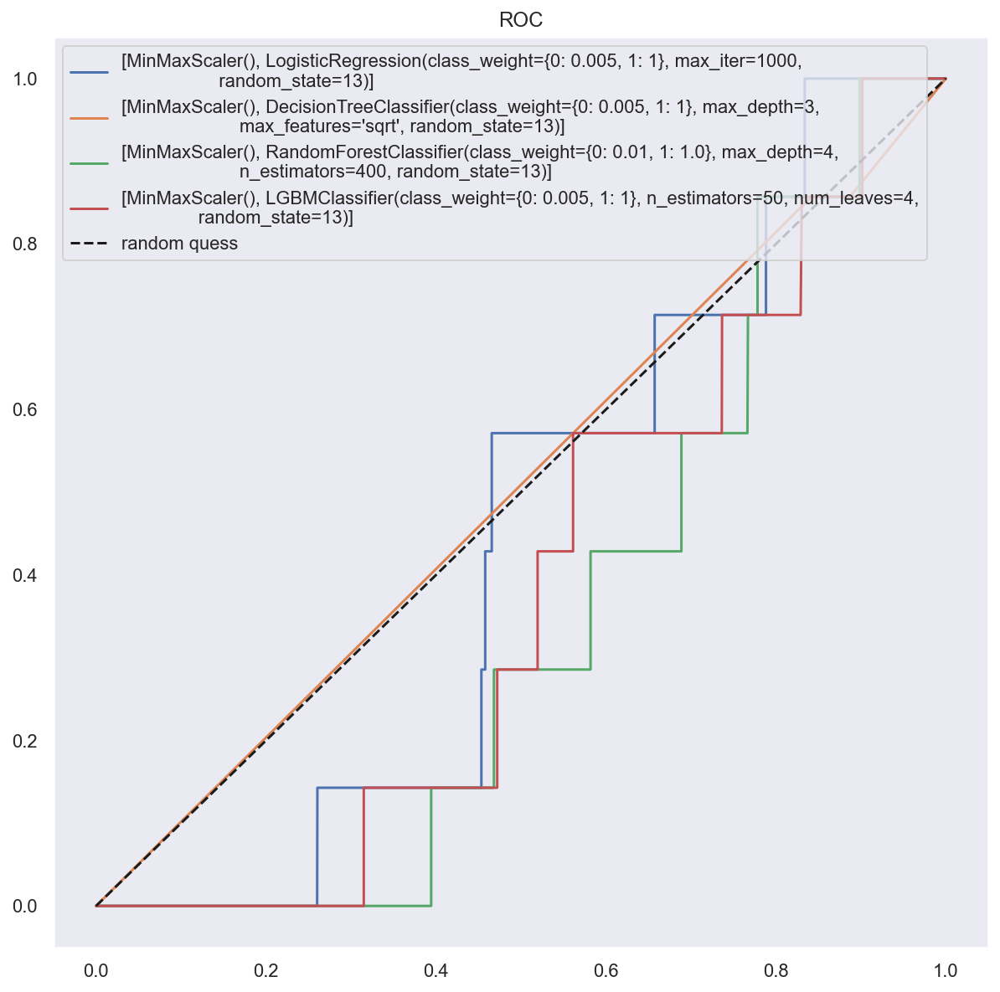

In [16]:
# 데이터 분리
X_train, X_test, y_train, y_test = ut.split_train_test(socar)
# sampling to SMOTE (default)
X_train_over, y_train_over = ut.fit_sampler(X_train, y_train, sampler='SMOTE')
# evaluation
cv_list3, result_df3 = ut.fit_cv(X_train_over, y_train_over, X_test, y_test, scaler='MM')

In [17]:
result_df3['class_weight'] = [1] * len(result_df3)
result_df3["null_del"] = [0]  * len(result_df3)
result_df3["encoded"] = [0]  * len(result_df3)
result_df3["scaler"] = ["MM"]  * len(result_df3)
result_df3["sampler"] = ["SMOTE"]  * len(result_df3)
result_df3 = result_df3[['class_weight', 'null_del', 'encoded', 'scaler', 'sampler', 'classifier', 'train accuracy', 'train precision',
                             'train recall', 'train f1', 'train auc', 'test accuracy', 'test precision', 'test recall',
                             'test f1', 'test auc']]
result_df3

,class_weight,null_del,encoded,scaler,sampler,classifier,train accuracy,train precision,train recall,train f1,train auc,test accuracy,test precision,test recall,test f1,test auc
0,1,0,0,MM,SMOTE,LogisticReg,0.569041,0.537084,0.999922,0.698816,0.569041,0.174944,0.002326,0.857143,0.004639,0.515277
1,1,0,0,MM,SMOTE,DecisionTree,0.580405,0.543721,0.999922,0.704410,0.580405,0.159564,0.002283,0.857143,0.004554,0.507570
2,1,0,0,MM,SMOTE,RandomForest,0.618283,0.567076,1.000000,0.723737,0.618283,0.233579,0.002088,0.714286,0.004163,0.473392
3,1,0,0,MM,SMOTE,LightGBM,0.800804,0.715156,0.999844,0.833871,0.800804,0.576418,0.000759,0.142857,0.001511,0.360125
4,1,0,0,MM,SMOTE,SVC,0.963488,0.940866,0.989144,0.964401,0.963488,0.945530,0.000000,0.000000,0.000000,0.473828


## 넷째
### (1) NULL 값 유지,  (2) 데이터 분리, (3) ADASYN, (4) 스케일링 MinMax

==Split Result==
y_train :  [[0, 1], [12804, 34]]
y_test : [[0, 1], [3114, 7]]
==Sampling Result==
y_train :  [[0, 1], [12804, 34]]
y_train_over : [[0, 1], [12804, 12818]]
[Pipeline] ............ (step 1 of 2) Processing scaler, total=   0.0s
[Pipeline] ............... (step 2 of 2) Processing clf, total=   0.1s
====Done Evaluation====
====Done Evaluation====


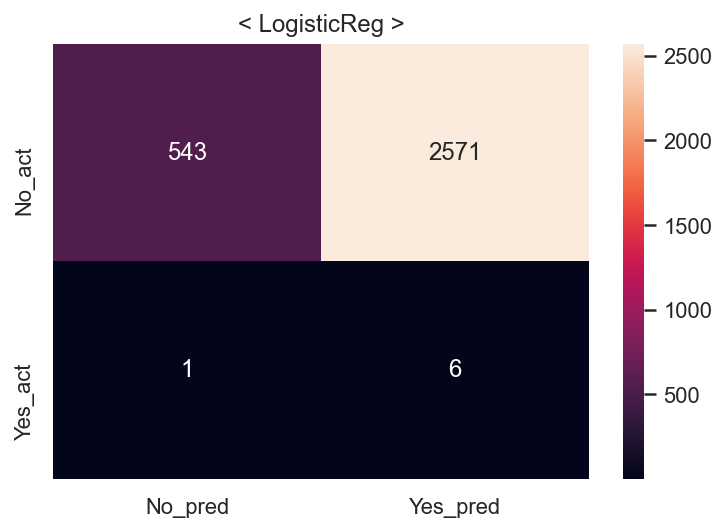

[Pipeline] ............ (step 1 of 2) Processing scaler, total=   0.0s
[Pipeline] ............... (step 2 of 2) Processing clf, total=   0.0s
====Done Evaluation====
====Done Evaluation====


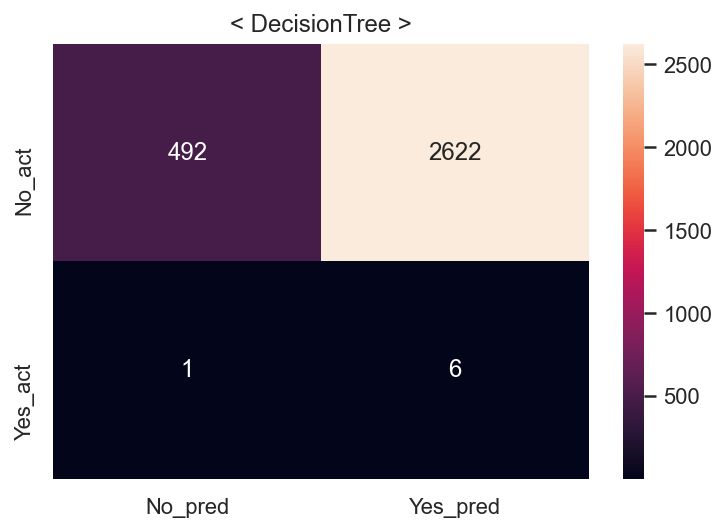

[Pipeline] ............ (step 1 of 2) Processing scaler, total=   0.0s
[Pipeline] ............... (step 2 of 2) Processing clf, total=   1.2s
====Done Evaluation====
====Done Evaluation====


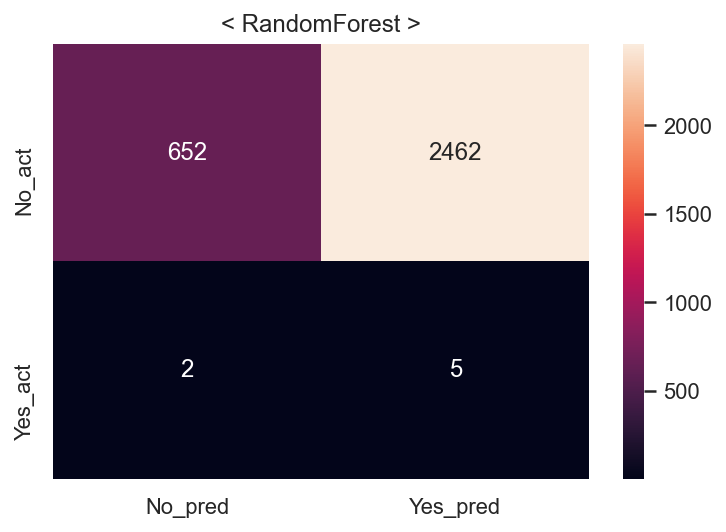

[Pipeline] ............ (step 1 of 2) Processing scaler, total=   0.0s
[Pipeline] ............... (step 2 of 2) Processing clf, total=   0.1s
====Done Evaluation====
====Done Evaluation====


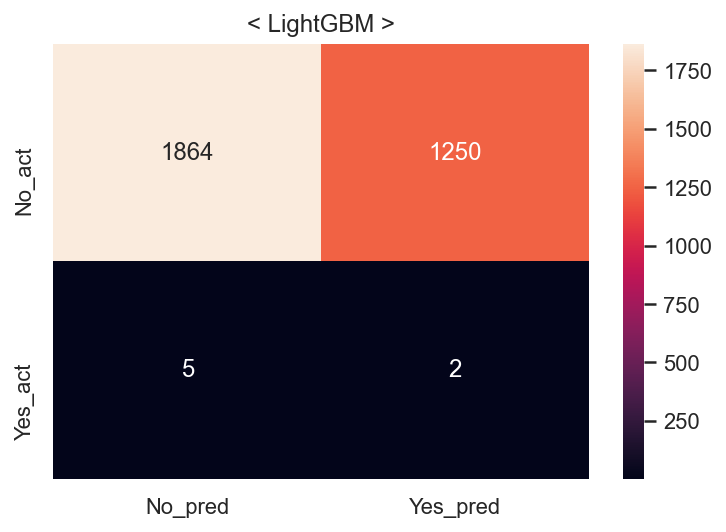

[Pipeline] ............ (step 1 of 2) Processing scaler, total=   0.0s
[Pipeline] ............... (step 2 of 2) Processing clf, total=   8.5s
====Done Evaluation====
====Done Evaluation====


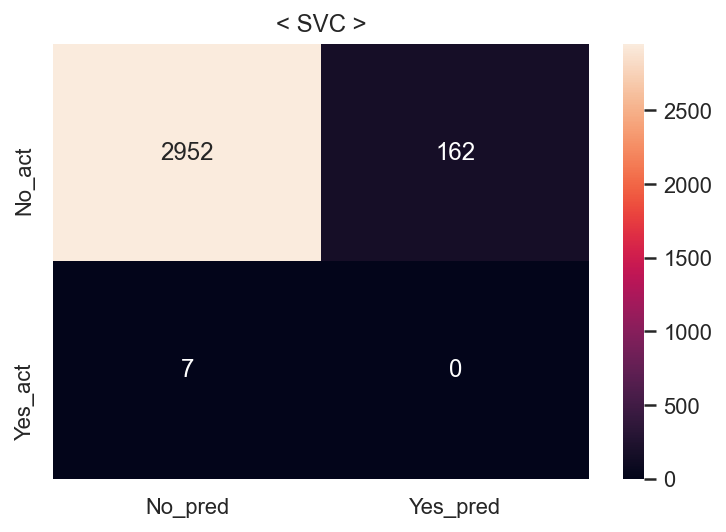

Fit time : 2.63 min


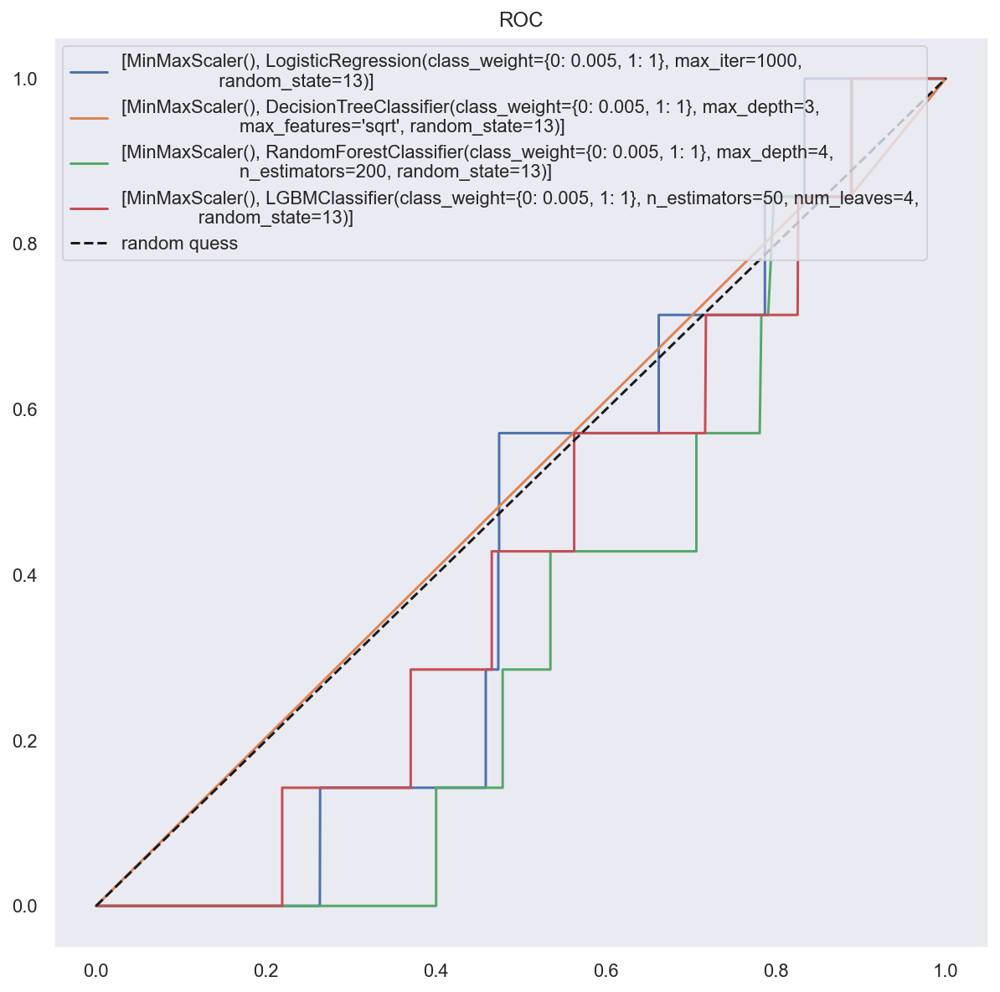

In [18]:
# 데이터 분리
X_train, X_test, y_train, y_test = ut.split_train_test(socar)
# sampling to SMOTE (default)
X_train_over, y_train_over = ut.fit_sampler(X_train, y_train, sampler='ADASYN')
# evaluation
cv_list4, result_df4 = ut.fit_cv(X_train_over, y_train_over, X_test, y_test, scaler='MM')

In [19]:
result_df4['class_weight'] = [1] * len(result_df4)
result_df4["null_del"] = [0]  * len(result_df4)
result_df4["encoded"] = [0]  * len(result_df4)
result_df4["scaler"] = ["MM"]  * len(result_df4)
result_df4["sampler"] = ["ADASYN"]  * len(result_df4)
result_df4 = result_df4[['class_weight', 'null_del', 'encoded', 'scaler', 'sampler', 'classifier', 'train accuracy', 'train precision',
                             'train recall', 'train f1', 'train auc', 'test accuracy', 'test precision', 'test recall',
                             'test f1', 'test auc']]
result_df4

,class_weight,null_del,encoded,scaler,sampler,classifier,train accuracy,train precision,train recall,train f1,train auc,test accuracy,test precision,test recall,test f1,test auc
0,1,0,0,MM,ADASYN,LogisticReg,0.569081,0.537243,0.999922,0.698950,0.568846,0.175905,0.002328,0.857143,0.004644,0.515758
1,1,0,0,MM,ADASYN,DecisionTree,0.580634,0.543992,0.999922,0.704637,0.580405,0.159564,0.002283,0.857143,0.004554,0.507570
2,1,0,0,MM,ADASYN,RandomForest,0.604715,0.558616,1.000000,0.716810,0.604499,0.210509,0.002027,0.714286,0.004042,0.461831
3,1,0,0,MM,ADASYN,LightGBM,0.805870,0.720535,0.999688,0.837462,0.805764,0.597885,0.001597,0.285714,0.003177,0.442151
4,1,0,0,MM,ADASYN,SVC,0.963820,0.940571,0.990248,0.964770,0.963806,0.945851,0.000000,0.000000,0.000000,0.473988


## 다섯번째
### (1) NULL 값 유지,  (2) 데이터 분리, (3) SMOTE, (4) 스케일링 Standard

==Split Result==
y_train :  [[0, 1], [12804, 34]]
y_test : [[0, 1], [3114, 7]]
==Sampling Result==
y_train :  [[0, 1], [12804, 34]]
y_train_over : [[0, 1], [12804, 12804]]
[Pipeline] ............ (step 1 of 2) Processing scaler, total=   0.0s
[Pipeline] ............... (step 2 of 2) Processing clf, total=   0.0s
====Done Evaluation====
====Done Evaluation====


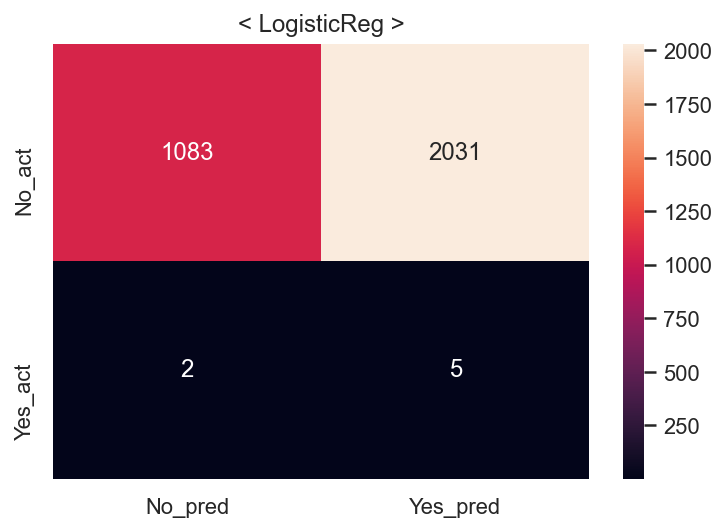

[Pipeline] ............ (step 1 of 2) Processing scaler, total=   0.0s
[Pipeline] ............... (step 2 of 2) Processing clf, total=   0.0s
====Done Evaluation====
====Done Evaluation====


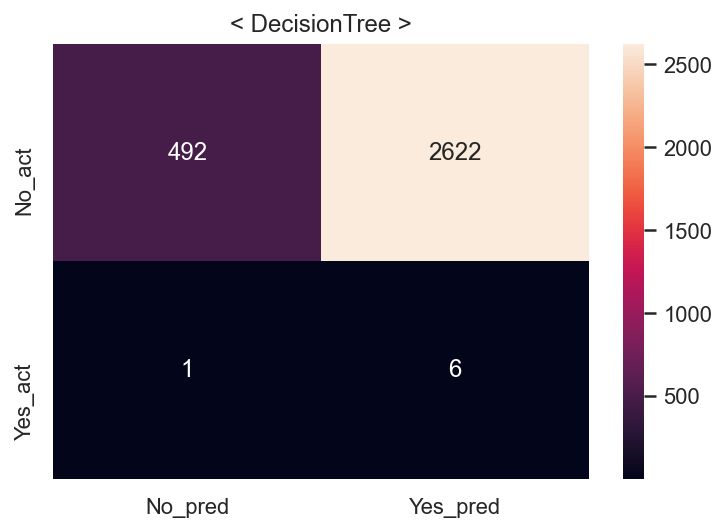

[Pipeline] ............ (step 1 of 2) Processing scaler, total=   0.0s
[Pipeline] ............... (step 2 of 2) Processing clf, total=   2.2s
====Done Evaluation====
====Done Evaluation====


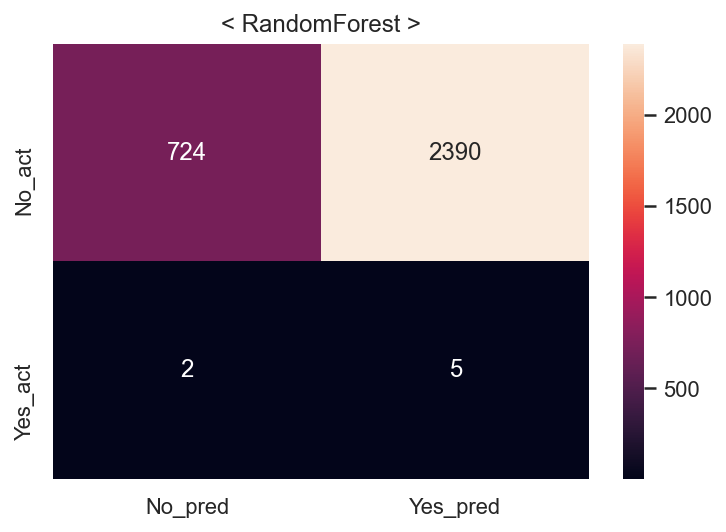

[Pipeline] ............ (step 1 of 2) Processing scaler, total=   0.0s
[Pipeline] ............... (step 2 of 2) Processing clf, total=   0.1s
====Done Evaluation====
====Done Evaluation====


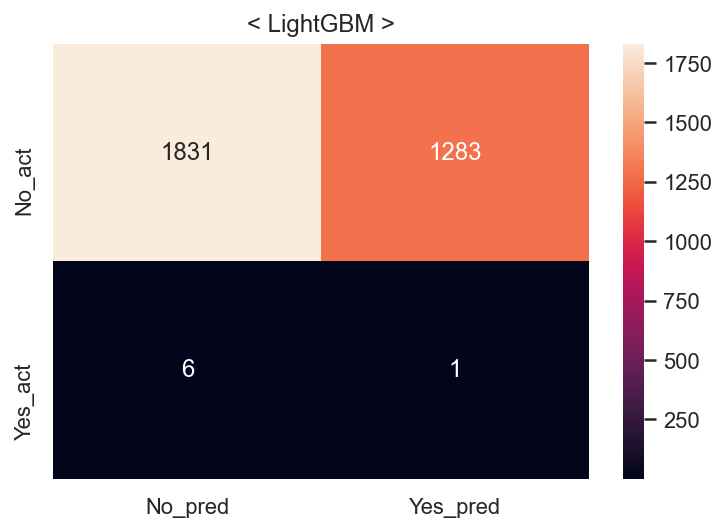

[Pipeline] ............ (step 1 of 2) Processing scaler, total=   0.0s
[Pipeline] ............... (step 2 of 2) Processing clf, total=   4.9s
====Done Evaluation====
====Done Evaluation====


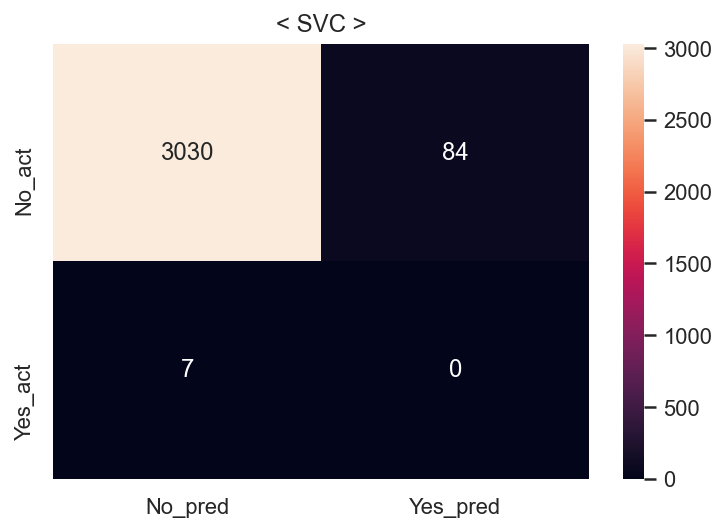

Fit time : 2.39 min


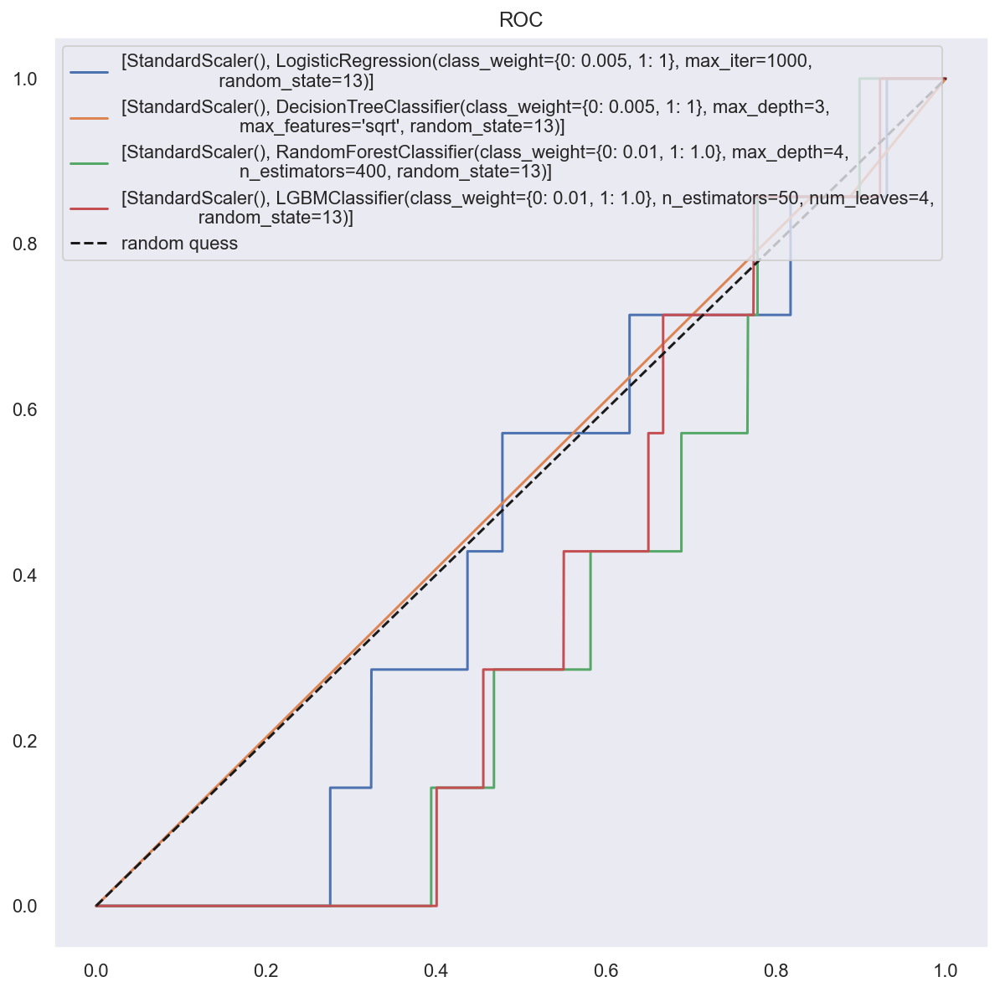

In [20]:
# 데이터 분리
X_train, X_test, y_train, y_test = ut.split_train_test(socar)
# sampling to SMOTE (default)
X_train_over, y_train_over = ut.fit_sampler(X_train, y_train, sampler='SMOTE')
# evaluation
cv_list5, result_df5 = ut.fit_cv(X_train_over, y_train_over, X_test, y_test, scaler='SD')

In [21]:
result_df5['class_weight'] = [1] * len(result_df5)
result_df5["null_del"] = [0]  * len(result_df5)
result_df5["encoded"] = [0]  * len(result_df5)
result_df5["scaler"] = ["SD"]  * len(result_df5)
result_df5["sampler"] = ["SMOTE"]  * len(result_df5)
result_df5 = result_df5[['class_weight', 'null_del', 'encoded', 'scaler', 'sampler', 'classifier', 'train accuracy', 'train precision',
                             'train recall', 'train f1', 'train auc', 'test accuracy', 'test precision', 'test recall',
                             'test f1', 'test auc']]
result_df5

,class_weight,null_del,encoded,scaler,sampler,classifier,train accuracy,train precision,train recall,train f1,train auc,test accuracy,test precision,test recall,test f1,test auc
0,1,0,0,SD,SMOTE,LogisticReg,0.656514,0.592795,0.999844,0.744302,0.656514,0.348606,0.002456,0.714286,0.004895,0.531035
1,1,0,0,SD,SMOTE,DecisionTree,0.580405,0.543721,0.999922,0.704410,0.580405,0.159564,0.002283,0.857143,0.004554,0.507570
2,1,0,0,SD,SMOTE,RandomForest,0.618283,0.567076,1.000000,0.723737,0.618283,0.233579,0.002088,0.714286,0.004163,0.473392
3,1,0,0,SD,SMOTE,LightGBM,0.802523,0.717064,0.999375,0.835003,0.802523,0.586991,0.000779,0.142857,0.001549,0.365423
4,1,0,0,SD,SMOTE,SVC,0.983091,0.969203,0.997891,0.983338,0.983091,0.970843,0.000000,0.000000,0.000000,0.486513


## 여섯번째
### (1) NULL 값 유지,  (2) 데이터 분리, (3) ADASYN, (4) 스케일링 Standard

==Split Result==
y_train :  [[0, 1], [12804, 34]]
y_test : [[0, 1], [3114, 7]]
==Sampling Result==
y_train :  [[0, 1], [12804, 34]]
y_train_over : [[0, 1], [12804, 12818]]
[Pipeline] ............ (step 1 of 2) Processing scaler, total=   0.0s
[Pipeline] ............... (step 2 of 2) Processing clf, total=   0.1s
====Done Evaluation====
====Done Evaluation====


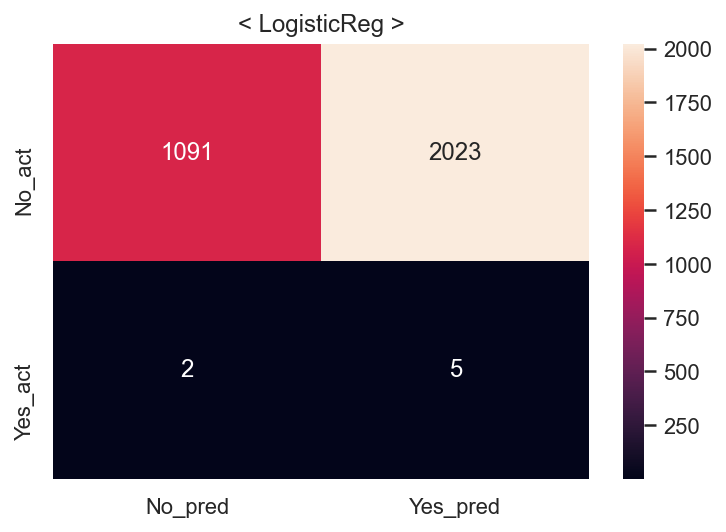

[Pipeline] ............ (step 1 of 2) Processing scaler, total=   0.0s
[Pipeline] ............... (step 2 of 2) Processing clf, total=   0.0s
====Done Evaluation====
====Done Evaluation====


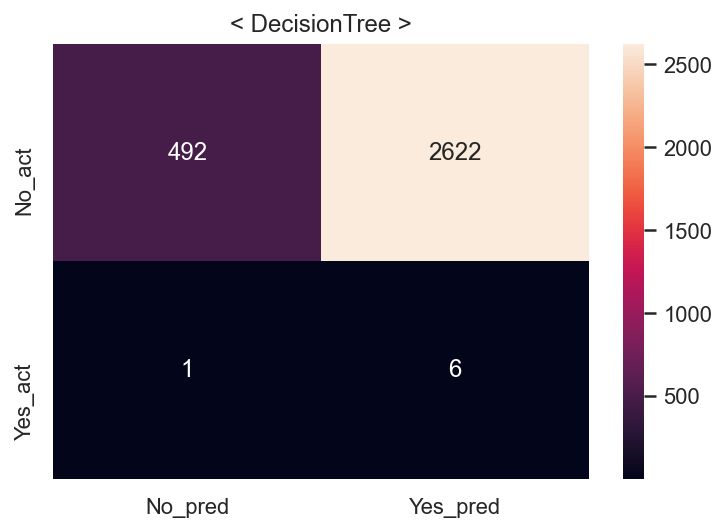

[Pipeline] ............ (step 1 of 2) Processing scaler, total=   0.0s
[Pipeline] ............... (step 2 of 2) Processing clf, total=   1.1s
====Done Evaluation====
====Done Evaluation====


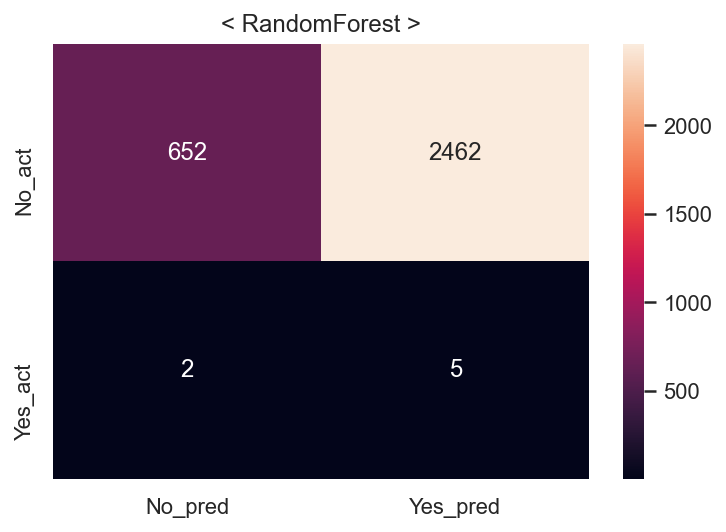

[Pipeline] ............ (step 1 of 2) Processing scaler, total=   0.0s
[Pipeline] ............... (step 2 of 2) Processing clf, total=   0.1s
====Done Evaluation====
====Done Evaluation====


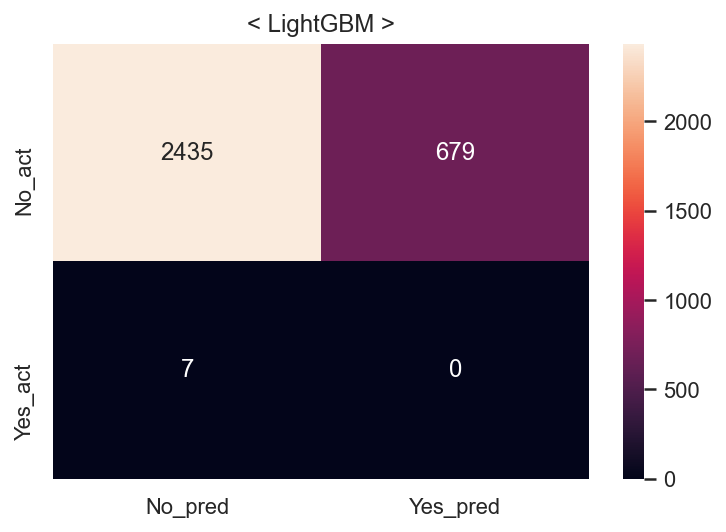

[Pipeline] ............ (step 1 of 2) Processing scaler, total=   0.0s
[Pipeline] ............... (step 2 of 2) Processing clf, total=   5.5s
====Done Evaluation====
====Done Evaluation====


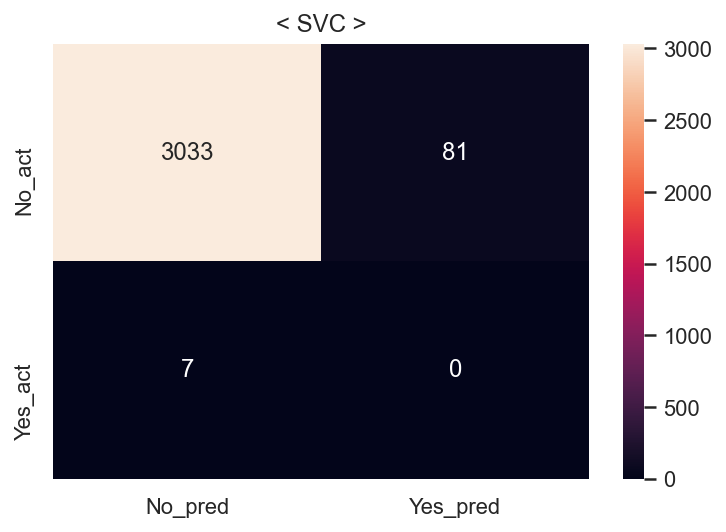

Fit time : 2.39 min


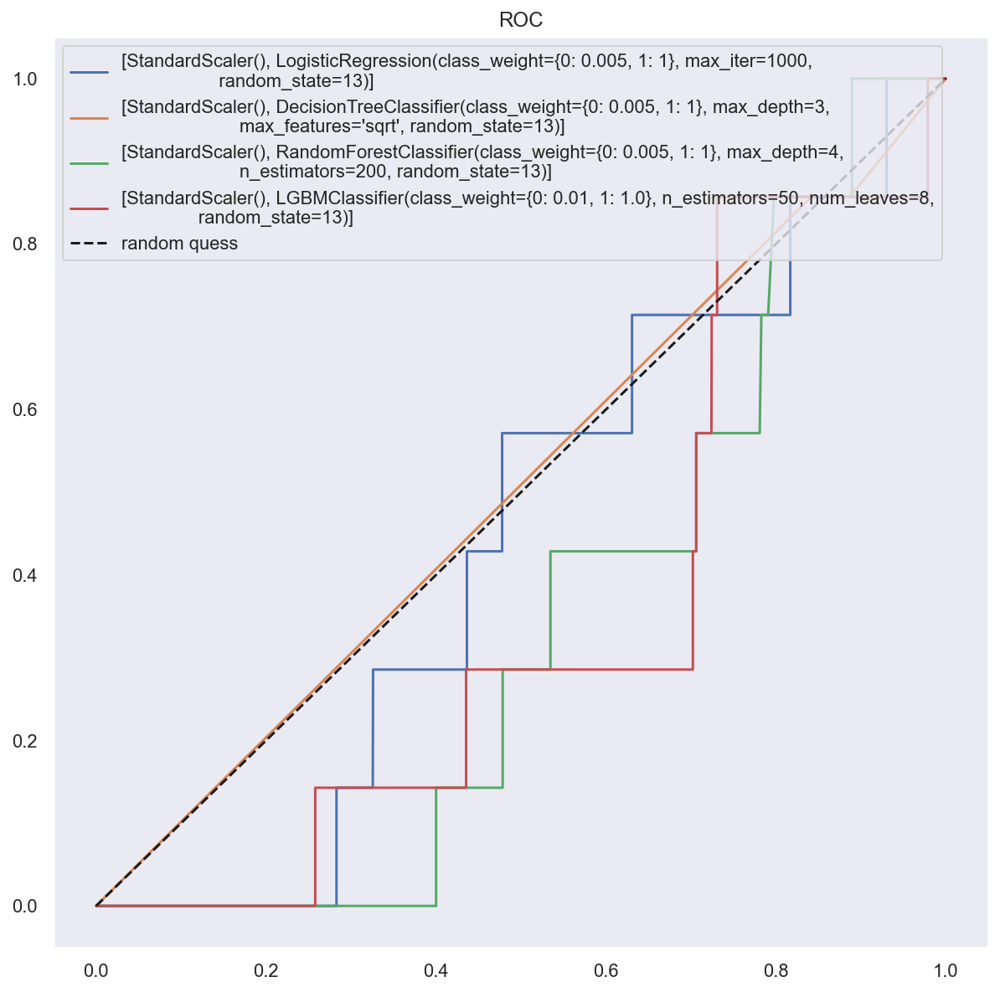

In [22]:
# 데이터 분리
X_train, X_test, y_train, y_test = ut.split_train_test(socar)
# sampling to SMOTE (default)
X_train_over, y_train_over = ut.fit_sampler(X_train, y_train, sampler='ADASYN')
# evaluation
cv_list6, result_df6 = ut.fit_cv(X_train_over, y_train_over, X_test, y_test, scaler='SD')

In [23]:
result_df6['class_weight'] = [1] * len(result_df6)
result_df6["null_del"] = [0]  * len(result_df6)
result_df6["encoded"] = [0]  * len(result_df6)
result_df6["scaler"] = ["SD"]  * len(result_df6)
result_df6["sampler"] = ["ADASYN"]  * len(result_df6)
result_df6 = result_df6[['class_weight', 'null_del', 'encoded', 'scaler', 'sampler', 'classifier', 'train accuracy', 'train precision',
                             'train recall', 'train f1', 'train auc', 'test accuracy', 'test precision', 'test recall',
                             'test f1', 'test auc']]
result_df6

,class_weight,null_del,encoded,scaler,sampler,classifier,train accuracy,train precision,train recall,train f1,train auc,test accuracy,test precision,test recall,test f1,test auc
0,1,0,0,SD,ADASYN,LogisticReg,0.655608,0.592283,0.999922,0.743920,0.655420,0.351169,0.002465,0.714286,0.004914,0.532319
1,1,0,0,SD,ADASYN,DecisionTree,0.580634,0.543992,0.999922,0.704637,0.580405,0.159564,0.002283,0.857143,0.004554,0.507570
2,1,0,0,SD,ADASYN,RandomForest,0.604715,0.558616,1.000000,0.716810,0.604499,0.210509,0.002027,0.714286,0.004042,0.461831
3,1,0,0,SD,ADASYN,LightGBM,0.904574,0.839809,1.000000,0.912930,0.904522,0.780199,0.000000,0.000000,0.000000,0.390976
4,1,0,0,SD,ADASYN,SVC,0.980915,0.968320,0.994383,0.981179,0.980907,0.971804,0.000000,0.000000,0.000000,0.486994


## 일곱번째
### (1) NULL 값 유지,  (2) 데이터 분리, (3) SMOTE, (4) 스케일링 Robust

==Split Result==
y_train :  [[0, 1], [12804, 34]]
y_test : [[0, 1], [3114, 7]]
==Sampling Result==
y_train :  [[0, 1], [12804, 34]]
y_train_over : [[0, 1], [12804, 12804]]
[Pipeline] ............ (step 1 of 2) Processing scaler, total=   0.0s
[Pipeline] ............... (step 2 of 2) Processing clf, total=   0.3s
====Done Evaluation====
====Done Evaluation====


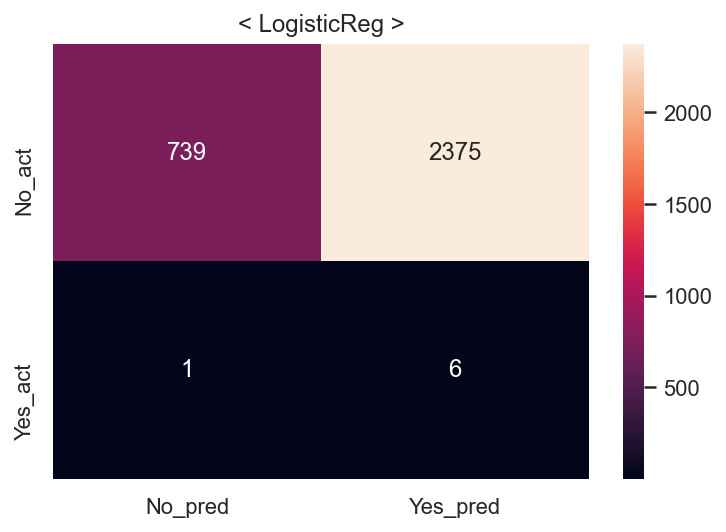

[Pipeline] ............ (step 1 of 2) Processing scaler, total=   0.0s
[Pipeline] ............... (step 2 of 2) Processing clf, total=   0.0s
====Done Evaluation====
====Done Evaluation====


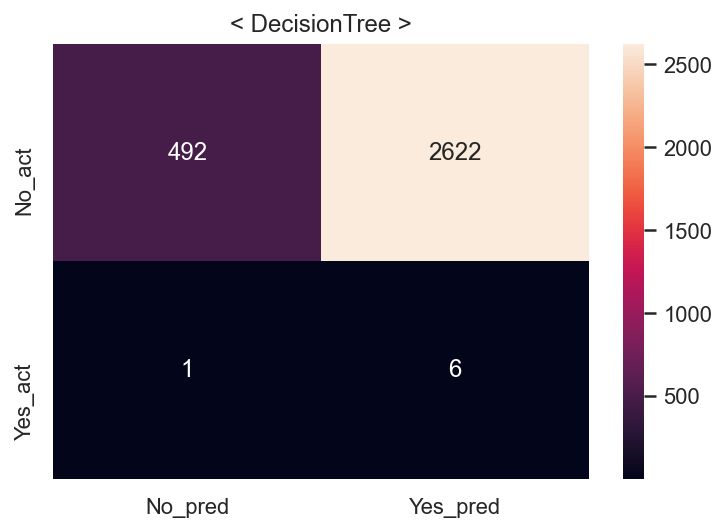

[Pipeline] ............ (step 1 of 2) Processing scaler, total=   0.0s
[Pipeline] ............... (step 2 of 2) Processing clf, total=   2.2s
====Done Evaluation====
====Done Evaluation====


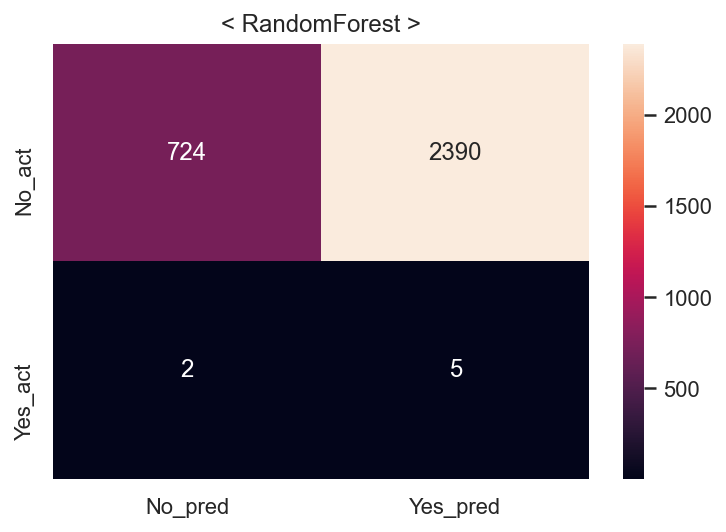

[Pipeline] ............ (step 1 of 2) Processing scaler, total=   0.0s
[Pipeline] ............... (step 2 of 2) Processing clf, total=   0.1s
====Done Evaluation====
====Done Evaluation====


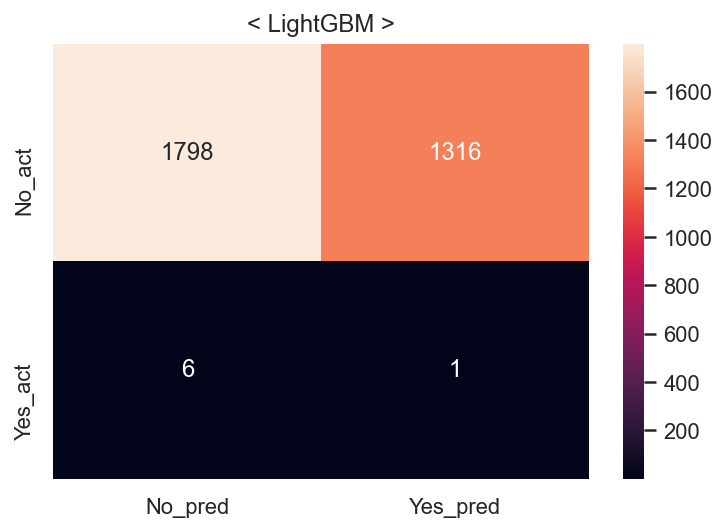

[Pipeline] ............ (step 1 of 2) Processing scaler, total=   0.0s
[Pipeline] ............... (step 2 of 2) Processing clf, total=  16.8s
====Done Evaluation====
====Done Evaluation====


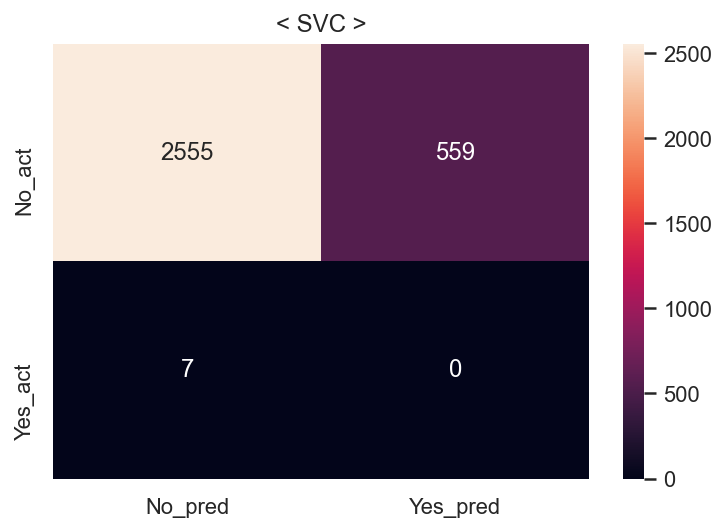

Fit time : 3.55 min


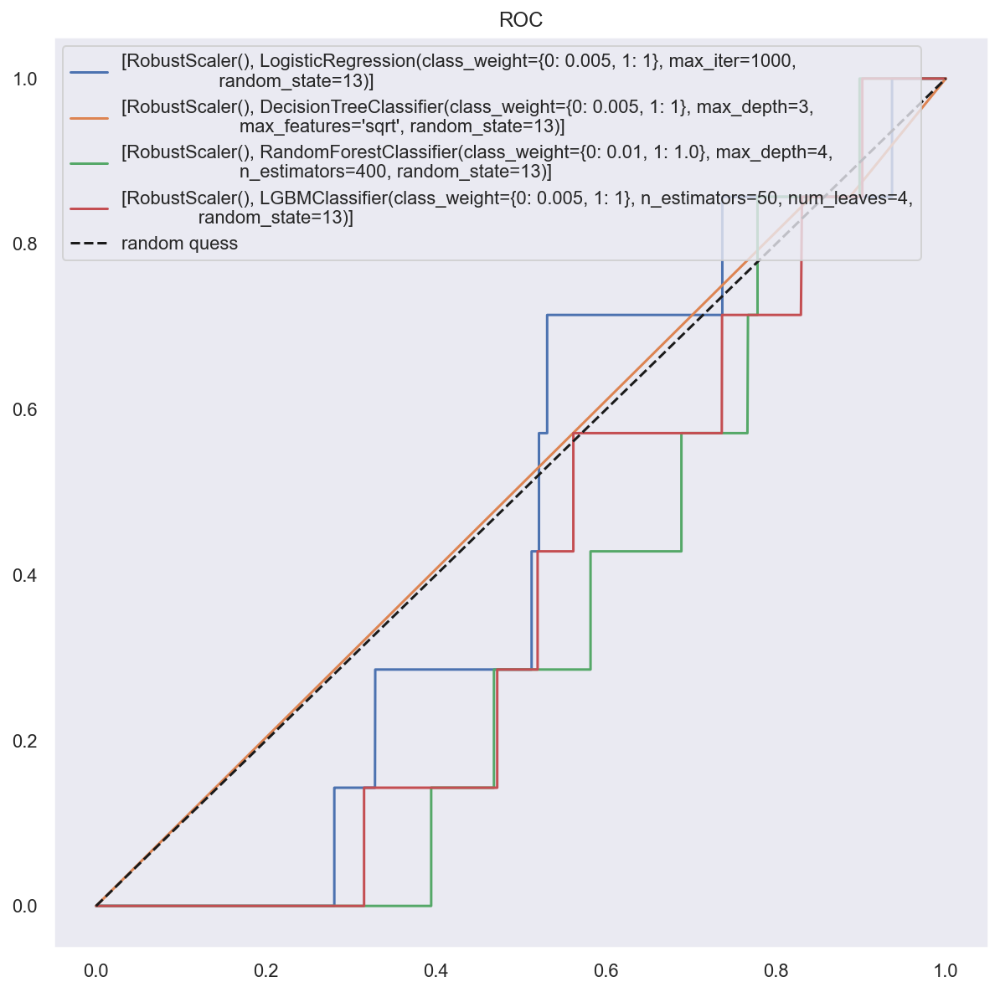

In [24]:
# 데이터 분리
X_train, X_test, y_train, y_test = ut.split_train_test(socar)
# sampling to SMOTE (default)
X_train_over, y_train_over = ut.fit_sampler(X_train, y_train, sampler='SMOTE')
# evaluation
cv_list7, result_df7 = ut.fit_cv(X_train_over, y_train_over, X_test, y_test, scaler='RB')

In [25]:
result_df7['class_weight'] = [1] * len(result_df7)
result_df7["null_del"] = [0]  * len(result_df7)
result_df7["encoded"] = [0]  * len(result_df7)
result_df7["scaler"] = ["RB"]  * len(result_df7)
result_df7["sampler"] = ["SMOTE"]  * len(result_df7)
result_df7 = result_df7[['class_weight', 'null_del', 'encoded', 'scaler', 'sampler', 'classifier', 'train accuracy', 'train precision',
                             'train recall', 'train f1', 'train auc', 'test accuracy', 'test precision', 'test recall',
                             'test f1', 'test auc']]
result_df7

,class_weight,null_del,encoded,scaler,sampler,classifier,train accuracy,train precision,train recall,train f1,train auc,test accuracy,test precision,test recall,test f1,test auc
0,1,0,0,RB,SMOTE,LogisticReg,0.610747,0.562275,0.999922,0.719795,0.610747,0.238706,0.002520,0.857143,0.005025,0.547229
1,1,0,0,RB,SMOTE,DecisionTree,0.580405,0.543721,0.999922,0.704410,0.580405,0.159564,0.002283,0.857143,0.004554,0.507570
2,1,0,0,RB,SMOTE,RandomForest,0.618283,0.567076,1.000000,0.723737,0.618283,0.233579,0.002088,0.714286,0.004163,0.473392
3,1,0,0,RB,SMOTE,LightGBM,0.800726,0.715076,0.999844,0.833816,0.800726,0.576418,0.000759,0.142857,0.001511,0.360125
4,1,0,0,RB,SMOTE,SVC,0.848914,0.828131,0.880584,0.853552,0.848914,0.818648,0.000000,0.000000,0.000000,0.410244


## 여덟번째
### (1) NULL 값 유지,  (2) 데이터 분리, 3) ADASYN, (4) 스케일링 Robust

==Split Result==
y_train :  [[0, 1], [12804, 34]]
y_test : [[0, 1], [3114, 7]]
==Sampling Result==
y_train :  [[0, 1], [12804, 34]]
y_train_over : [[0, 1], [12804, 12818]]
[Pipeline] ............ (step 1 of 2) Processing scaler, total=   0.0s
[Pipeline] ............... (step 2 of 2) Processing clf, total=   0.3s
====Done Evaluation====
====Done Evaluation====


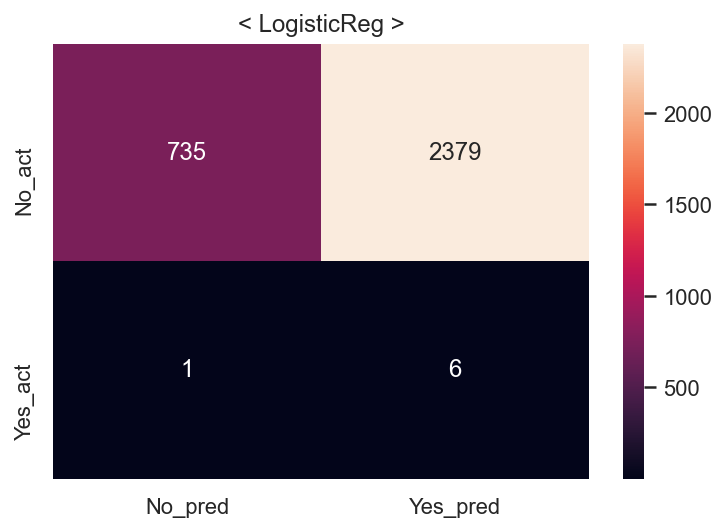

[Pipeline] ............ (step 1 of 2) Processing scaler, total=   0.0s
[Pipeline] ............... (step 2 of 2) Processing clf, total=   0.0s
====Done Evaluation====
====Done Evaluation====


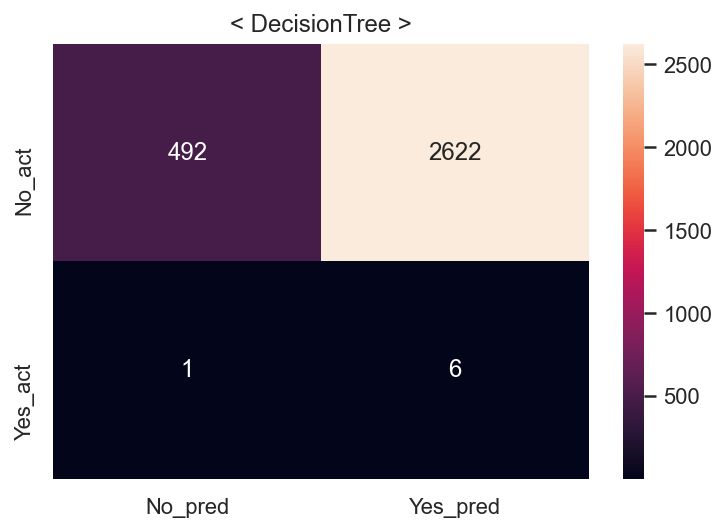

[Pipeline] ............ (step 1 of 2) Processing scaler, total=   0.0s
[Pipeline] ............... (step 2 of 2) Processing clf, total=   1.1s
====Done Evaluation====
====Done Evaluation====


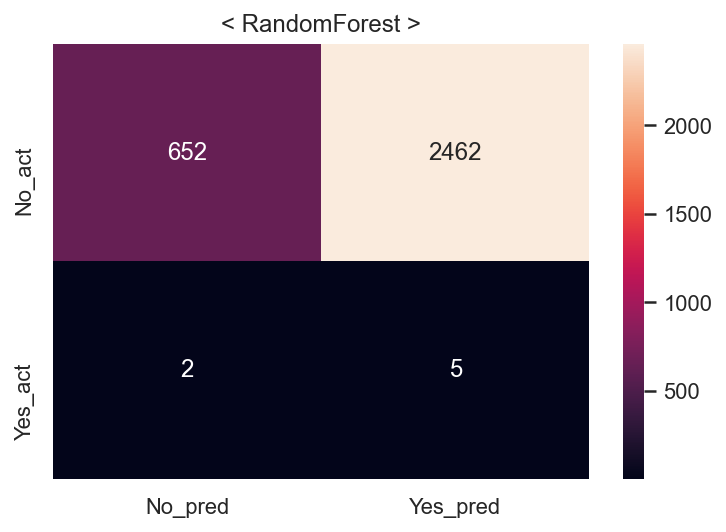

[Pipeline] ............ (step 1 of 2) Processing scaler, total=   0.0s
[Pipeline] ............... (step 2 of 2) Processing clf, total=   0.1s
====Done Evaluation====
====Done Evaluation====


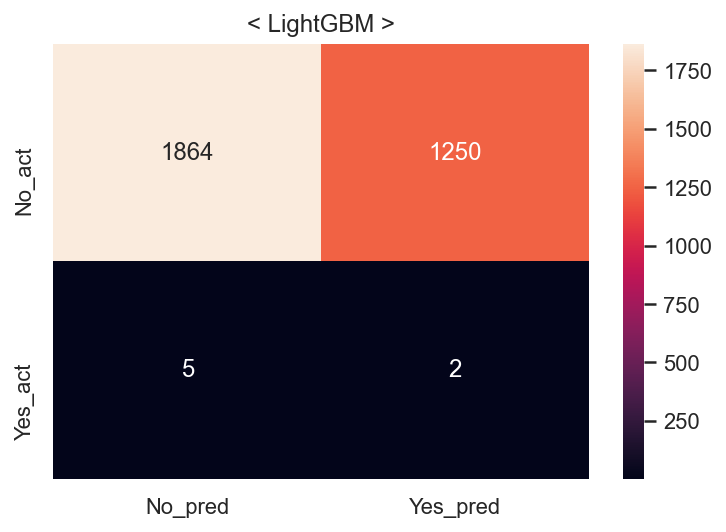

[Pipeline] ............ (step 1 of 2) Processing scaler, total=   0.0s
[Pipeline] ............... (step 2 of 2) Processing clf, total=  19.4s
====Done Evaluation====
====Done Evaluation====


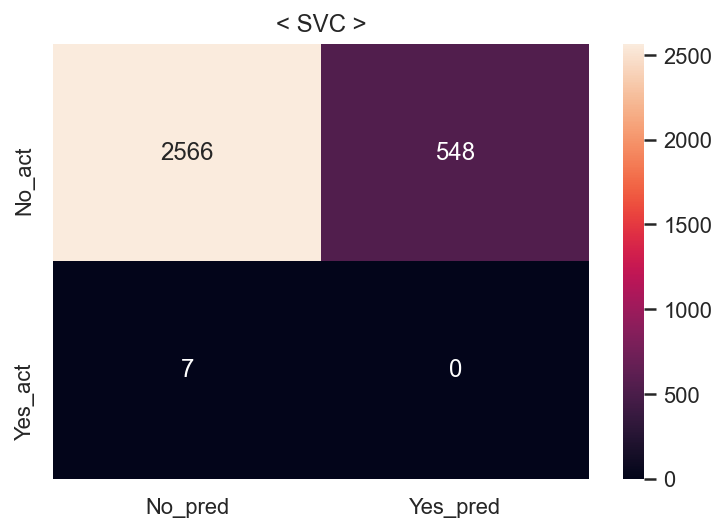

Fit time : 3.67 min


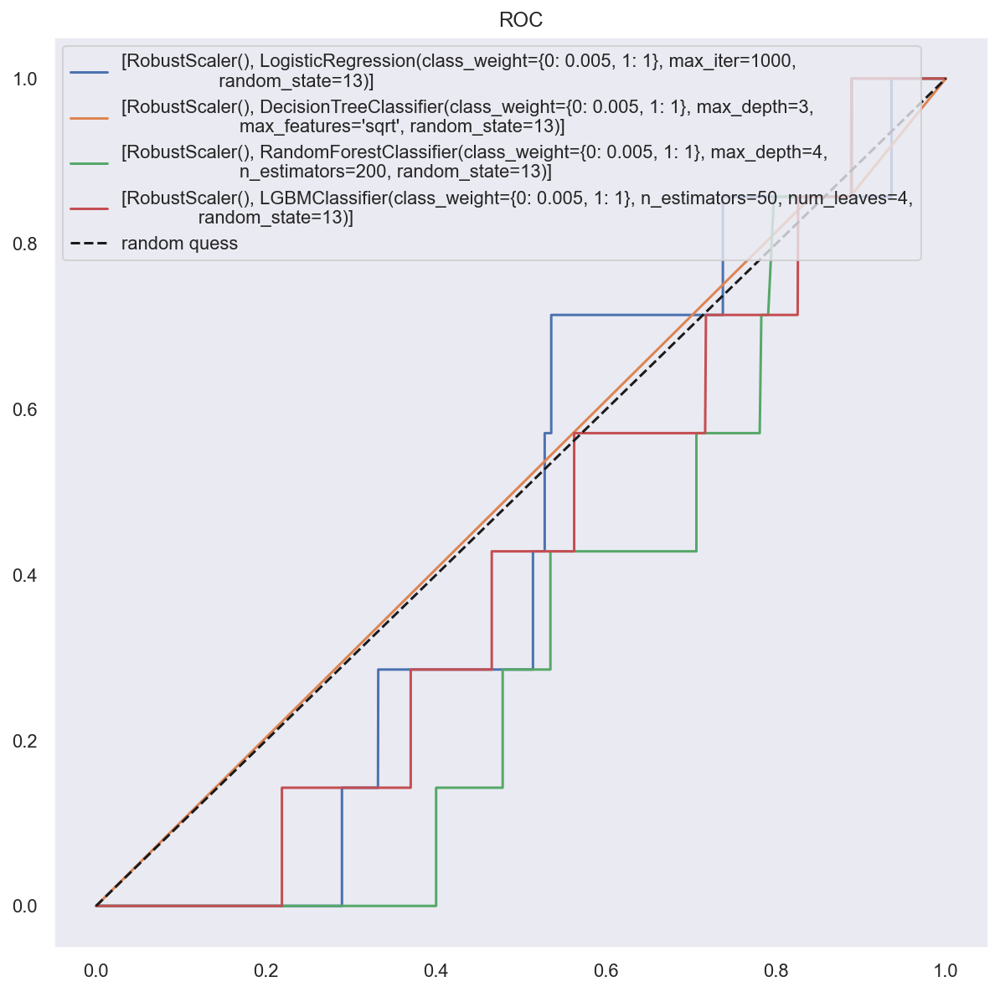

In [26]:
# 데이터 분리
X_train, X_test, y_train, y_test = ut.split_train_test(socar)
# sampling to SMOTE (default)
X_train_over, y_train_over = ut.fit_sampler(X_train, y_train, sampler='ADASYN')
# evaluation
cv_list8, result_df8 = ut.fit_cv(X_train_over, y_train_over, X_test, y_test, scaler='RB')

In [27]:
result_df8['class_weight'] = [1] * len(result_df8)
result_df8["null_del"] = [0]  * len(result_df8)
result_df8["encoded"] = [0]  * len(result_df8)
result_df8["scaler"] = ["RB"]  * len(result_df8)
result_df8["sampler"] = ["ADASYN"]  * len(result_df8)
result_df8 = result_df8[['class_weight', 'null_del', 'encoded', 'scaler', 'sampler', 'classifier', 'train accuracy', 'train precision',
                             'train recall', 'train f1', 'train auc', 'test accuracy', 'test precision', 'test recall',
                             'test f1', 'test auc']]
result_df8

,class_weight,null_del,encoded,scaler,sampler,classifier,train accuracy,train precision,train recall,train f1,train auc,test accuracy,test precision,test recall,test f1,test auc
0,1,0,0,RB,ADASYN,LogisticReg,0.610491,0.562248,0.999922,0.719773,0.610278,0.237424,0.002516,0.857143,0.005017,0.546587
1,1,0,0,RB,ADASYN,DecisionTree,0.580634,0.543992,0.999922,0.704637,0.580405,0.159564,0.002283,0.857143,0.004554,0.507570
2,1,0,0,RB,ADASYN,RandomForest,0.604715,0.558616,1.000000,0.716810,0.604499,0.210509,0.002027,0.714286,0.004042,0.461831
3,1,0,0,RB,ADASYN,LightGBM,0.805870,0.720535,0.999688,0.837462,0.805764,0.597885,0.001597,0.285714,0.003177,0.442151
4,1,0,0,RB,ADASYN,SVC,0.849934,0.828754,0.882353,0.854714,0.849916,0.822172,0.000000,0.000000,0.000000,0.412010


## 아홉번째
### (1) NULL값 삭제,  (2) 데이터 분리, (3) SMOTE, (4) 스케일링 없음 

- null값이 들어있는 컬럼
    - c_14 : -1 - 36개
    - c_15 : 0 - 6006개
    - c_16 : 0 - 10424개
    - c_17 : 5(확인불가) - 288개
    - c_21 : 0 - 11384개
    - c_22 : 0 - 11325개
    - c_23 :  0 - 11328개
    - c_24 :  -1 - 11358개

In [6]:
# null 삭제
socar_strange_delete = socar.drop(['c_15', 'c_16', 'c_21', 'c_22', 'c_23', 'c_24'], axis=1)
socar_strange_delete

,c_1,c_2,c_3,c_4,c_5,c_6,c_7,c_8,c_9,c_10,c_11,c_12,c_13,c_14,c_17,c_18,c_19,c_20,c_25
0,0,2,1,3,0,2,0,100,2,0,0,4,2,4,1,0,0,1,0
1,0,1,0,4,0,4,0,0,3,1,0,1,4,4,1,1,1,2,1
2,0,1,0,4,1,4,0,100,3,1,0,1,4,6,3,1,0,2,1
3,0,3,1,3,0,4,0,0,2,0,0,3,3,5,3,1,0,1,0
4,0,1,0,1,0,1,0,100,1,0,0,1,1,1,1,0,0,2,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
15995,0,2,0,2,0,2,0,100,2,0,0,1,1,1,1,1,0,1,0
15996,0,2,0,2,1,4,0,100,1,1,0,5,2,6,2,1,0,1,0
15997,0,2,1,2,0,4,0,100,1,0,0,1,3,5,0,0,0,1,1
15998,0,2,0,2,0,2,0,100,2,0,0,6,1,2,4,1,0,1,0


==Split Result==
y_train :  [[0, 1], [12804, 34]]
y_test : [[0, 1], [3114, 7]]
==Sampling Result==
y_train :  [[0, 1], [12804, 34]]
y_train_over : [[0, 1], [12804, 12804]]
[Pipeline] ............ (step 1 of 2) Processing scaler, total=   0.0s
[Pipeline] ............... (step 2 of 2) Processing clf, total=   0.8s
====Done Evaluation====
====Done Evaluation====


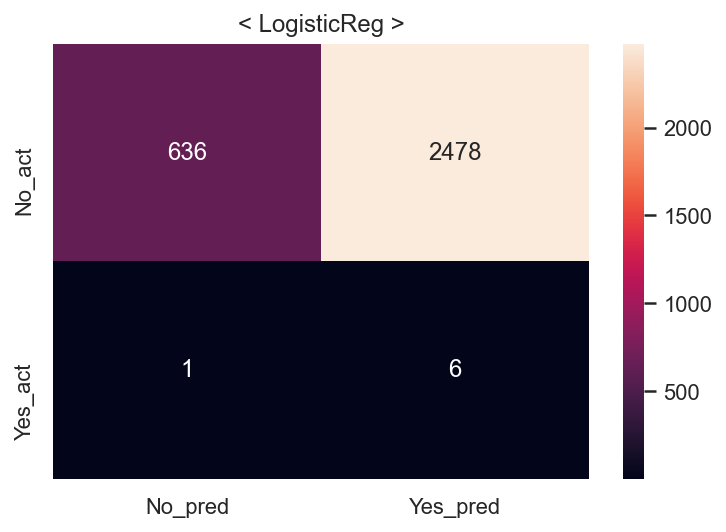

[Pipeline] ............ (step 1 of 2) Processing scaler, total=   0.0s
[Pipeline] ............... (step 2 of 2) Processing clf, total=   0.0s
====Done Evaluation====
====Done Evaluation====


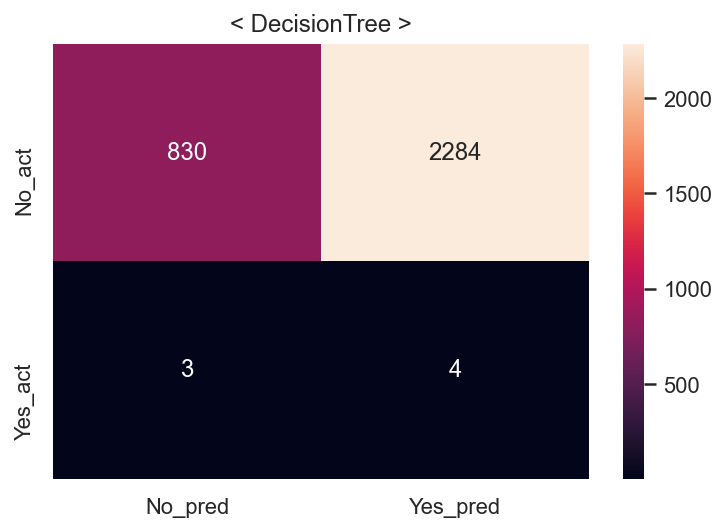

[Pipeline] ............ (step 1 of 2) Processing scaler, total=   0.0s
[Pipeline] ............... (step 2 of 2) Processing clf, total=   0.2s
====Done Evaluation====
====Done Evaluation====


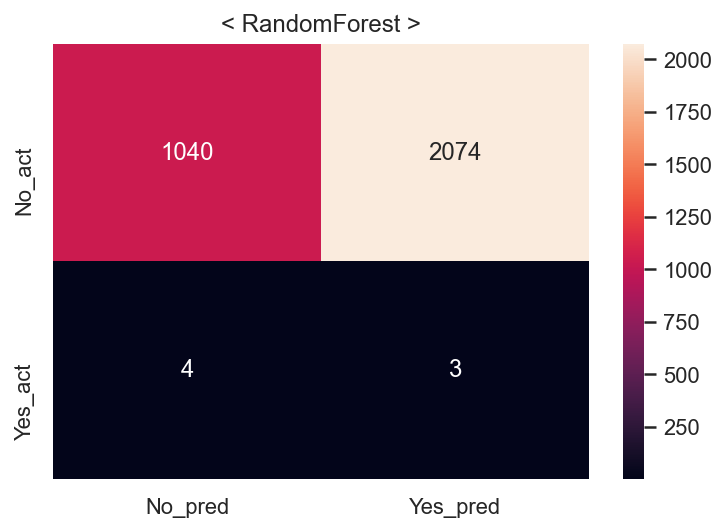

[Pipeline] ............ (step 1 of 2) Processing scaler, total=   0.0s
[Pipeline] ............... (step 2 of 2) Processing clf, total=   0.1s
====Done Evaluation====
====Done Evaluation====


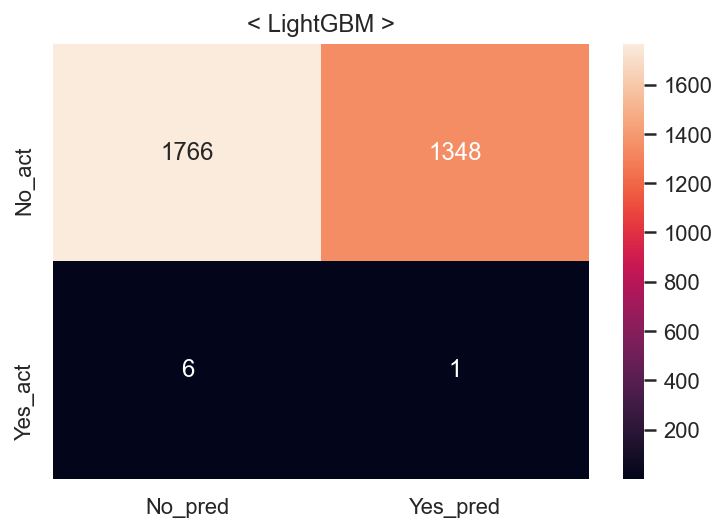

[Pipeline] ............ (step 1 of 2) Processing scaler, total=   0.0s
[Pipeline] ............... (step 2 of 2) Processing clf, total=  26.0s
====Done Evaluation====
====Done Evaluation====


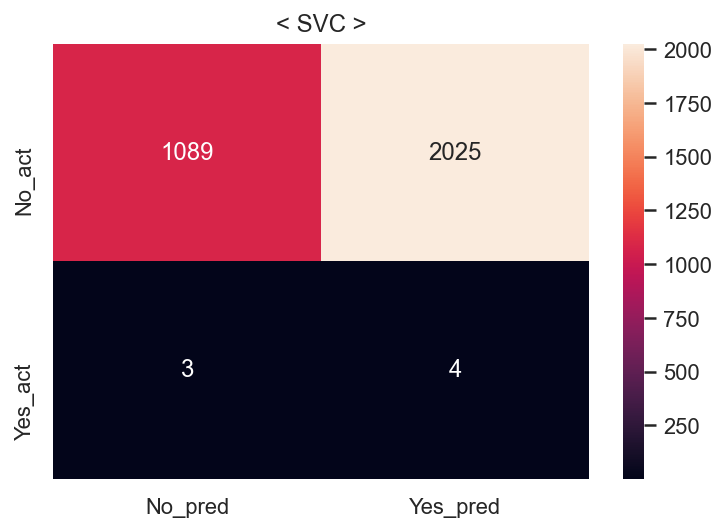

Fit time : 4.05 min


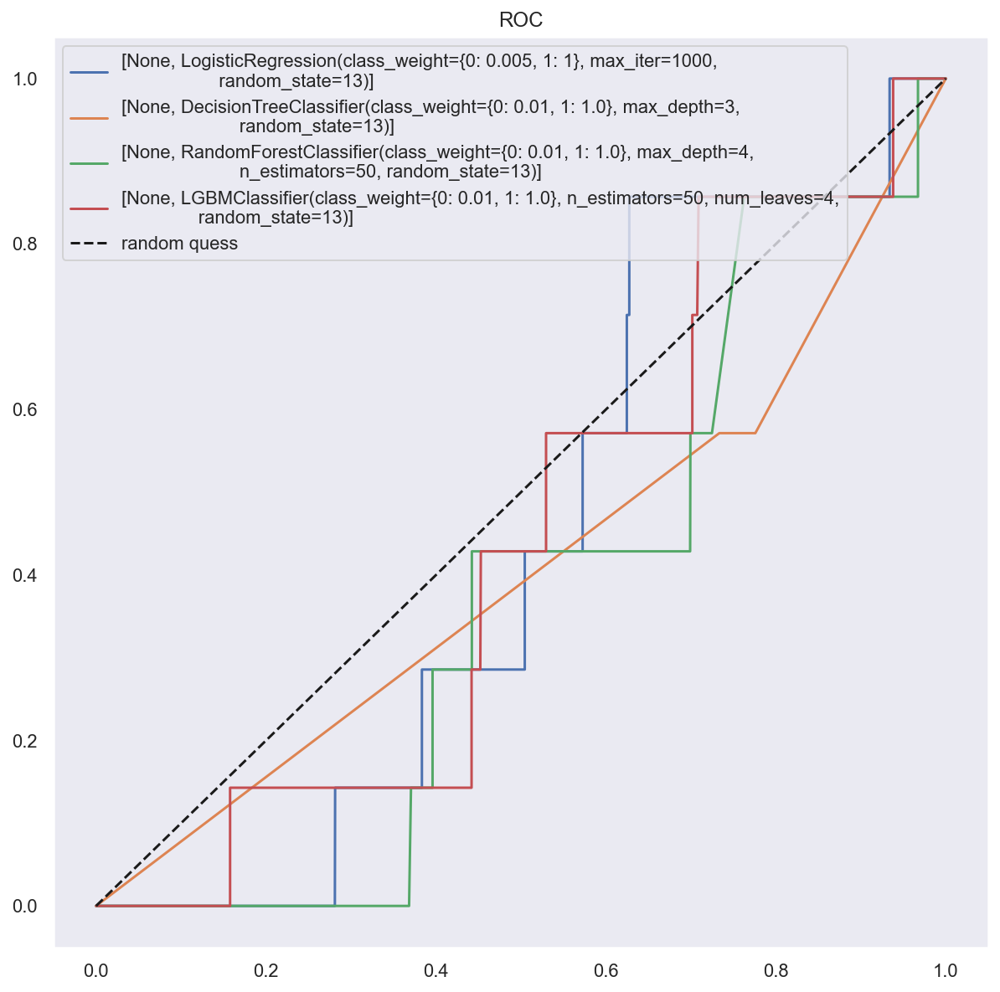

In [29]:
# null 삭제
socar_strange_delete = socar.drop(['c_15', 'c_16', 'c_21', 'c_22', 'c_23', 'c_24'], axis=1)
socar_strange_delete
# 데이터 분리
X_train, X_test, y_train, y_test = ut.split_train_test(socar_strange_delete)
# sampling to SMOTE (default)
X_train_over, y_train_over = ut.fit_sampler(X_train, y_train, sampler='SMOTE')
# evaluation
cv_list9, result_df9 = ut.fit_cv(X_train_over, y_train_over, X_test, y_test, scaler='No')

In [30]:
result_df9['class_weight'] = [1] * len(result_df9)
result_df9["null_del"] = [1]  * len(result_df9)
result_df9["encoded"] = [0]  * len(result_df9)
result_df9["scaler"] = ["None"]  * len(result_df9)
result_df9["sampler"] = ["SMOTE"]  * len(result_df9)
result_df9 = result_df9[['class_weight', 'null_del', 'encoded', 'scaler', 'sampler', 'classifier', 'train accuracy', 'train precision',
                             'train recall', 'train f1', 'train auc', 'test accuracy', 'test precision', 'test recall',
                             'test f1', 'test auc']]
result_df9

,class_weight,null_del,encoded,scaler,sampler,classifier,train accuracy,train precision,train recall,train f1,train auc,test accuracy,test precision,test recall,test f1,test auc
0,1,1,0,None,SMOTE,LogisticReg,0.584973,0.546440,0.999844,0.706668,0.584973,0.205703,0.002415,0.857143,0.004817,0.530691
1,1,1,0,None,SMOTE,DecisionTree,0.643158,0.583546,0.999922,0.736991,0.643158,0.267222,0.001748,0.571429,0.003486,0.418983
2,1,1,0,None,SMOTE,RandomForest,0.650734,0.588744,1.000000,0.741144,0.650734,0.334188,0.001444,0.428571,0.002879,0.381274
3,1,1,0,None,SMOTE,LightGBM,0.775109,0.689861,0.999609,0.816341,0.775109,0.566165,0.000741,0.142857,0.001475,0.354987
4,1,1,0,None,SMOTE,SVC,0.637106,0.585823,0.935879,0.720587,0.637106,0.350208,0.001971,0.571429,0.003929,0.460570


## 열번째
### (1) NULL값 삭제,  (2) 데이터 분리, (3) ADASYN, (4) 스케일링 없음 

==Split Result==
y_train :  [[0, 1], [12804, 34]]
y_test : [[0, 1], [3114, 7]]
==Sampling Result==
y_train :  [[0, 1], [12804, 34]]
y_train_over : [[0, 1], [12804, 12810]]
[Pipeline] ............ (step 1 of 2) Processing scaler, total=   0.0s
[Pipeline] ............... (step 2 of 2) Processing clf, total=   0.8s
====Done Evaluation====
====Done Evaluation====


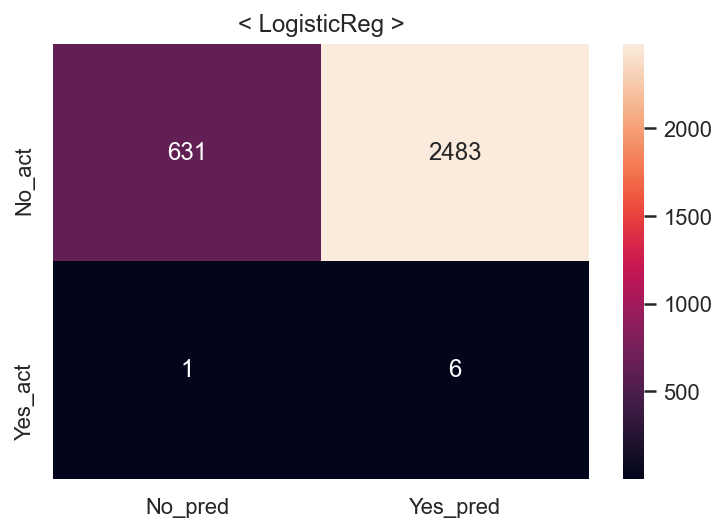

[Pipeline] ............ (step 1 of 2) Processing scaler, total=   0.0s
[Pipeline] ............... (step 2 of 2) Processing clf, total=   0.0s
====Done Evaluation====
====Done Evaluation====


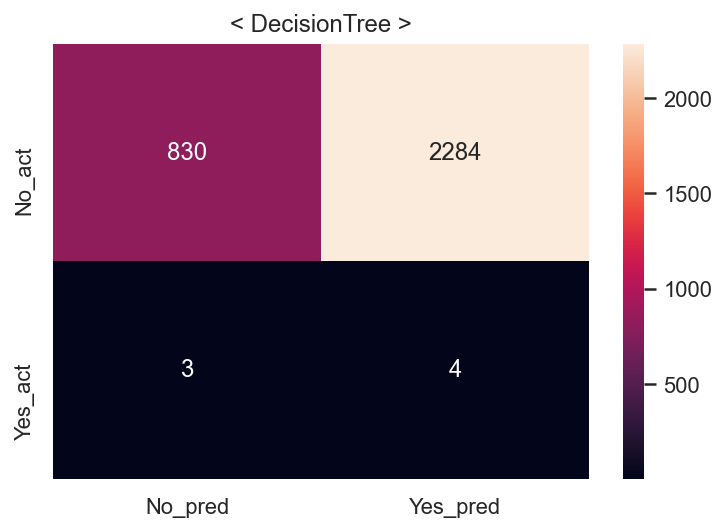

[Pipeline] ............ (step 1 of 2) Processing scaler, total=   0.0s
[Pipeline] ............... (step 2 of 2) Processing clf, total=   0.9s
====Done Evaluation====
====Done Evaluation====


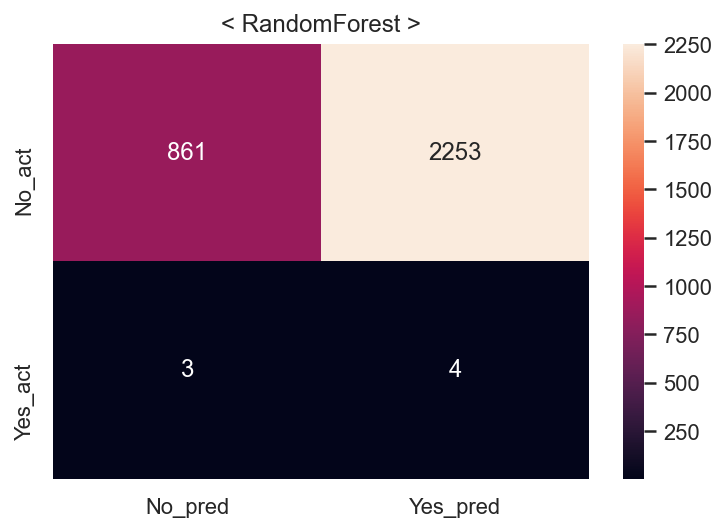

[Pipeline] ............ (step 1 of 2) Processing scaler, total=   0.0s
[Pipeline] ............... (step 2 of 2) Processing clf, total=   0.1s
====Done Evaluation====
====Done Evaluation====


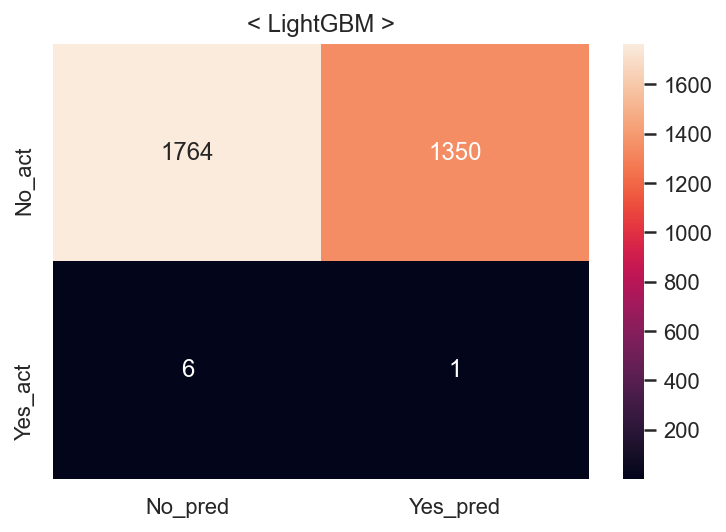

[Pipeline] ............ (step 1 of 2) Processing scaler, total=   0.0s
[Pipeline] ............... (step 2 of 2) Processing clf, total=  28.3s
====Done Evaluation====
====Done Evaluation====


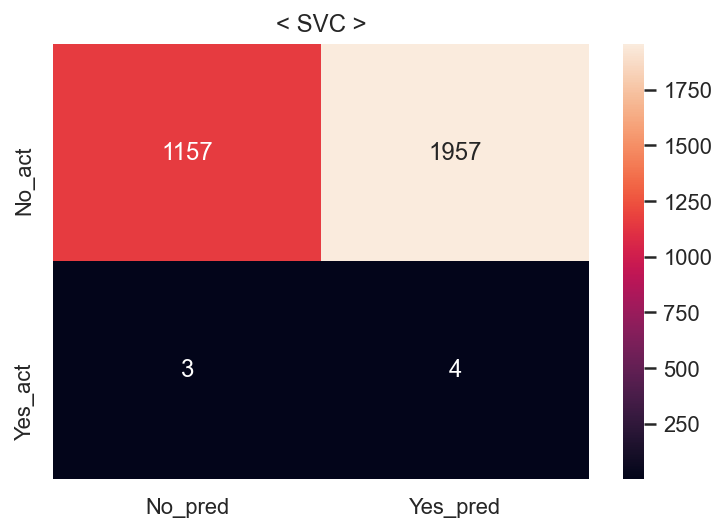

Fit time : 4.14 min


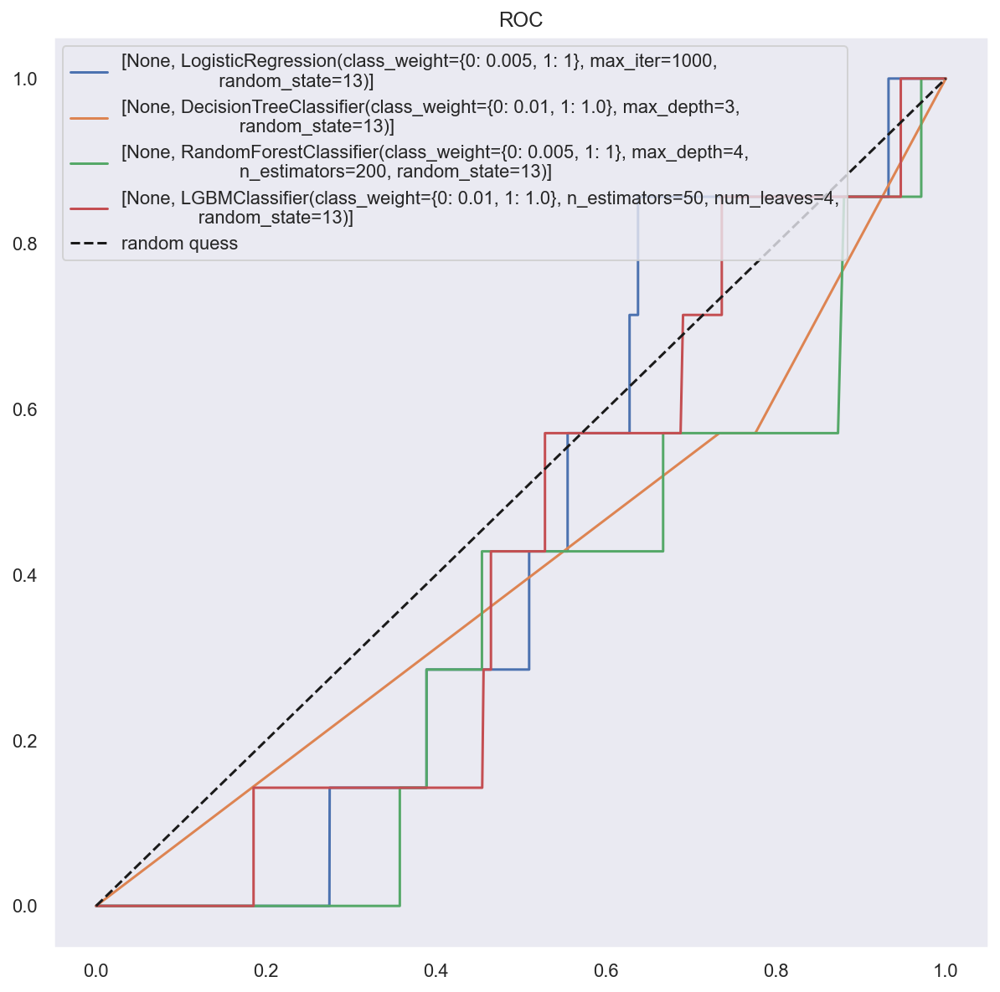

In [31]:
# null 삭제
socar_strange_delete = socar.drop(['c_15', 'c_16', 'c_21', 'c_22', 'c_23', 'c_24'], axis=1)
socar_strange_delete
# 데이터 분리
X_train, X_test, y_train, y_test = ut.split_train_test(socar_strange_delete)
# sampling to SMOTE (default)
X_train_over, y_train_over = ut.fit_sampler(X_train, y_train, sampler='ADASYN')
# evaluation
cv_list10, result_df10 = ut.fit_cv(X_train_over, y_train_over, X_test, y_test, scaler='No')

In [32]:
result_df10['class_weight'] = [1] * len(result_df10)
result_df10["null_del"] = [1]  * len(result_df10)
result_df10["encoded"] = [0]  * len(result_df10)
result_df10["scaler"] = ["None"]  * len(result_df10)
result_df10["sampler"] = ["ADASYN"]  * len(result_df10)
result_df10 = result_df10[['class_weight', 'null_del', 'encoded', 'scaler', 'sampler', 'classifier', 'train accuracy', 'train precision',
                             'train recall', 'train f1', 'train auc', 'test accuracy', 'test precision', 'test recall',
                             'test f1', 'test auc']]
result_df10

,class_weight,null_del,encoded,scaler,sampler,classifier,train accuracy,train precision,train recall,train f1,train auc,test accuracy,test precision,test recall,test f1,test auc
0,1,1,0,None,ADASYN,LogisticReg,0.582533,0.545044,0.999844,0.705500,0.582435,0.204101,0.002411,0.857143,0.004808,0.529888
1,1,1,0,None,ADASYN,DecisionTree,0.643242,0.583660,0.999922,0.737081,0.643158,0.267222,0.001748,0.571429,0.003486,0.418983
2,1,1,0,None,ADASYN,RandomForest,0.637034,0.579454,1.000000,0.733740,0.636949,0.277155,0.001772,0.571429,0.003534,0.423961
3,1,1,0,None,ADASYN,LightGBM,0.772507,0.687443,0.999610,0.814645,0.772454,0.565524,0.000740,0.142857,0.001473,0.354666
4,1,1,0,None,ADASYN,SVC,0.642266,0.591472,0.920453,0.720171,0.642201,0.371996,0.002040,0.571429,0.004065,0.471488


## 열한번째
### (1) NULL값 삭제,  (2) 데이터 분리, (3) SMOTE, (4) 스케일링 MinMax

==Split Result==
y_train :  [[0, 1], [12804, 34]]
y_test : [[0, 1], [3114, 7]]
==Sampling Result==
y_train :  [[0, 1], [12804, 34]]
y_train_over : [[0, 1], [12804, 12804]]
[Pipeline] ............ (step 1 of 2) Processing scaler, total=   0.0s
[Pipeline] ............... (step 2 of 2) Processing clf, total=   0.1s
====Done Evaluation====
====Done Evaluation====


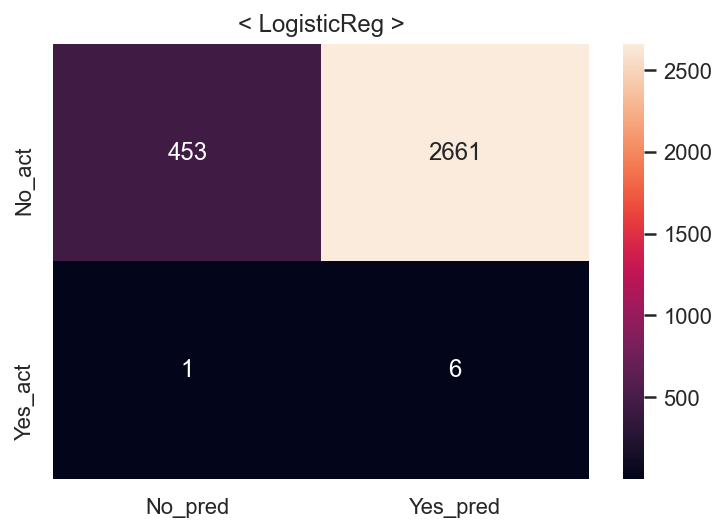

[Pipeline] ............ (step 1 of 2) Processing scaler, total=   0.0s
[Pipeline] ............... (step 2 of 2) Processing clf, total=   0.0s
====Done Evaluation====
====Done Evaluation====


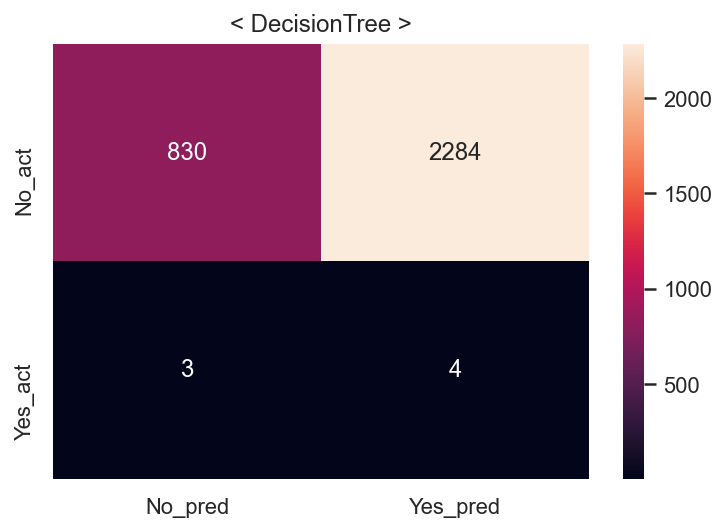

[Pipeline] ............ (step 1 of 2) Processing scaler, total=   0.0s
[Pipeline] ............... (step 2 of 2) Processing clf, total=   0.2s
====Done Evaluation====
====Done Evaluation====


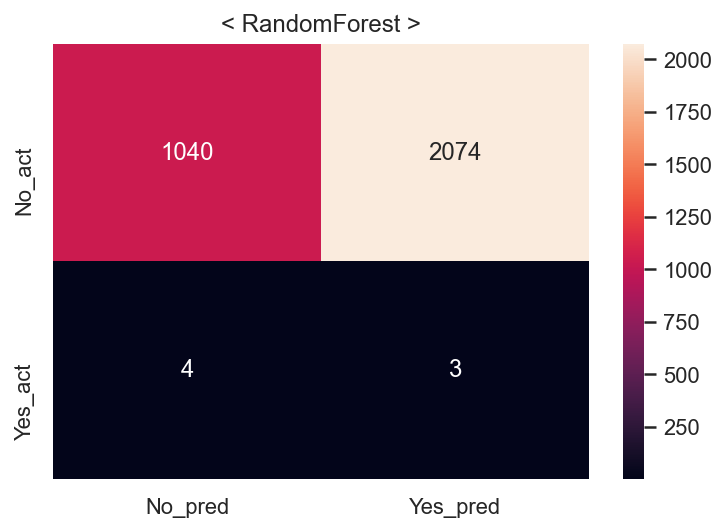

[Pipeline] ............ (step 1 of 2) Processing scaler, total=   0.0s
[Pipeline] ............... (step 2 of 2) Processing clf, total=   0.1s
====Done Evaluation====
====Done Evaluation====


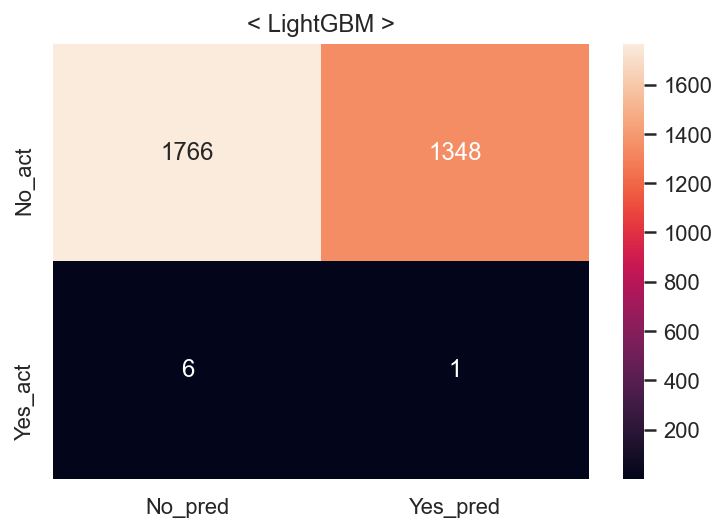

[Pipeline] ............ (step 1 of 2) Processing scaler, total=   0.0s
[Pipeline] ............... (step 2 of 2) Processing clf, total=   9.2s
====Done Evaluation====
====Done Evaluation====


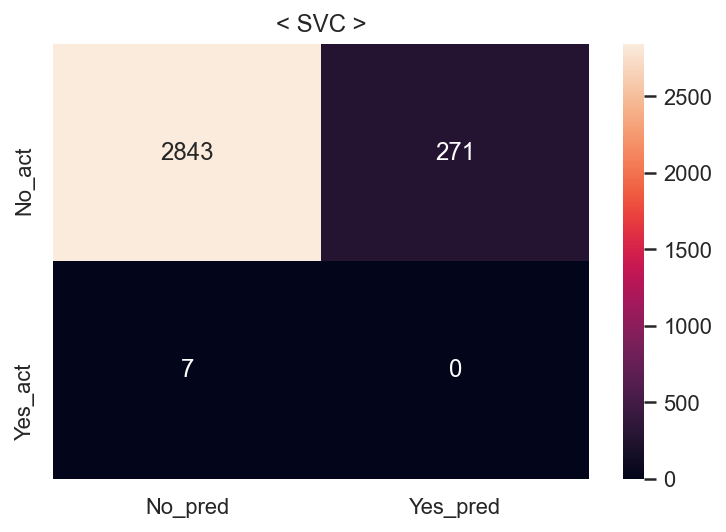

Fit time : 2.36 min


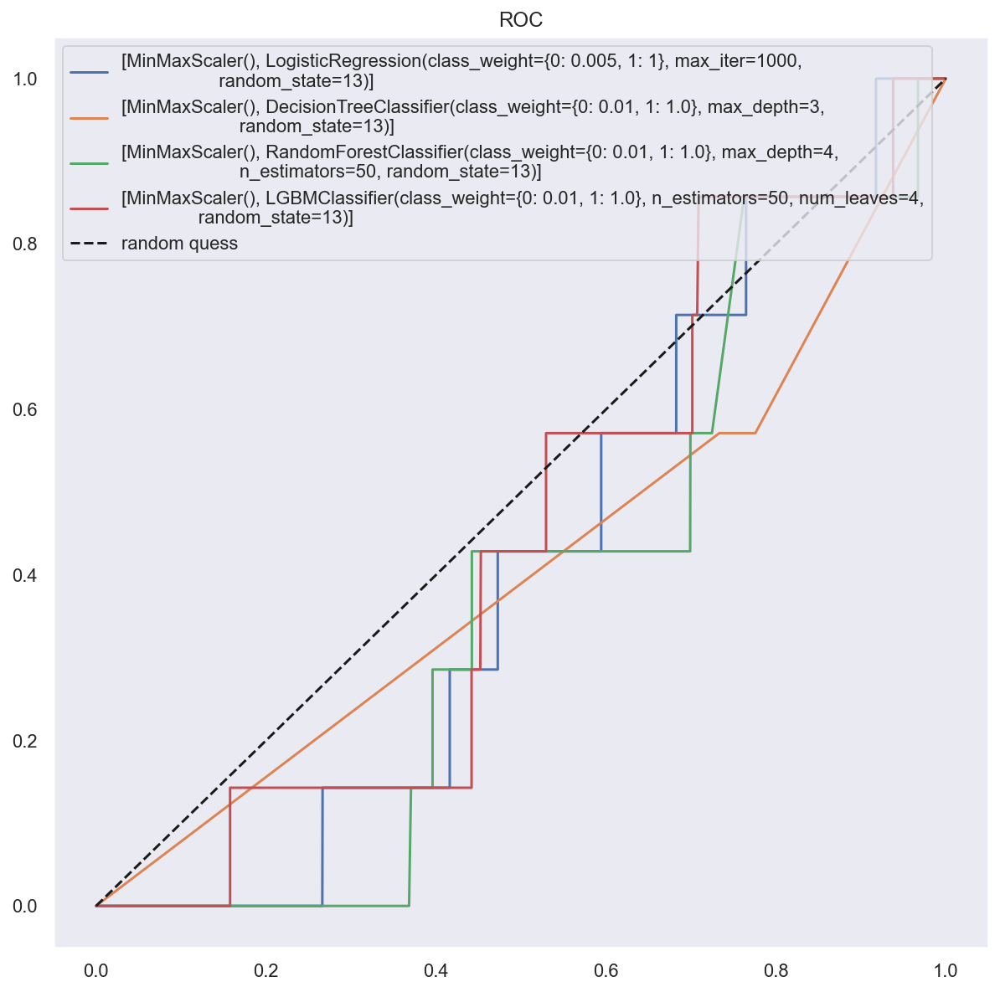

In [33]:
# null 삭제
socar_strange_delete = socar.drop(['c_15', 'c_16', 'c_21', 'c_22', 'c_23', 'c_24'], axis=1)
socar_strange_delete
# 데이터 분리
X_train, X_test, y_train, y_test = ut.split_train_test(socar_strange_delete)
# sampling to SMOTE (default)
X_train_over, y_train_over = ut.fit_sampler(X_train, y_train, sampler='SMOTE')
# evaluation
cv_list11, result_df11 = ut.fit_cv(X_train_over, y_train_over, X_test, y_test, scaler='MM')

In [34]:
result_df11['class_weight'] = [1] * len(result_df11)
result_df11["null_del"] = [1]  * len(result_df11)
result_df11["encoded"] = [0]  * len(result_df11)
result_df11["scaler"] = ["MM"]  * len(result_df11)
result_df11["sampler"] = ["SMOTE"]  * len(result_df11)
result_df11 = result_df11[['class_weight', 'null_del', 'encoded', 'scaler', 'sampler', 'classifier', 'train accuracy', 'train precision',
                             'train recall', 'train f1', 'train auc', 'test accuracy', 'test precision', 'test recall',
                             'test f1', 'test auc']]
result_df11

,class_weight,null_del,encoded,scaler,sampler,classifier,train accuracy,train precision,train recall,train f1,train auc,test accuracy,test precision,test recall,test f1,test auc
0,1,1,0,MM,SMOTE,LogisticReg,0.547993,0.525208,0.999922,0.688685,0.547993,0.147068,0.002250,0.857143,0.004488,0.501307
1,1,1,0,MM,SMOTE,DecisionTree,0.643158,0.583546,0.999922,0.736991,0.643158,0.267222,0.001748,0.571429,0.003486,0.418983
2,1,1,0,MM,SMOTE,RandomForest,0.650734,0.588744,1.000000,0.741144,0.650734,0.334188,0.001444,0.428571,0.002879,0.381274
3,1,1,0,MM,SMOTE,LightGBM,0.775109,0.689861,0.999609,0.816341,0.775109,0.566165,0.000741,0.142857,0.001475,0.354987
4,1,1,0,MM,SMOTE,SVC,0.947321,0.910603,0.992034,0.949576,0.947321,0.910926,0.000000,0.000000,0.000000,0.456487


## 열두번째
### (1) NULL값 삭제,  (2) 데이터 분리, (3) ADASYN, (4) 스케일링 MinMax

==Split Result==
y_train :  [[0, 1], [12804, 34]]
y_test : [[0, 1], [3114, 7]]
==Sampling Result==
y_train :  [[0, 1], [12804, 34]]
y_train_over : [[0, 1], [12804, 12810]]
[Pipeline] ............ (step 1 of 2) Processing scaler, total=   0.0s
[Pipeline] ............... (step 2 of 2) Processing clf, total=   0.1s
====Done Evaluation====
====Done Evaluation====


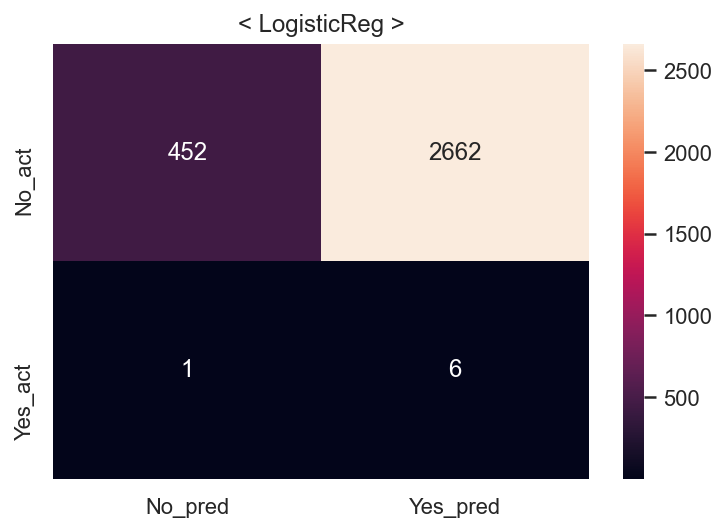

[Pipeline] ............ (step 1 of 2) Processing scaler, total=   0.0s
[Pipeline] ............... (step 2 of 2) Processing clf, total=   0.0s
====Done Evaluation====
====Done Evaluation====


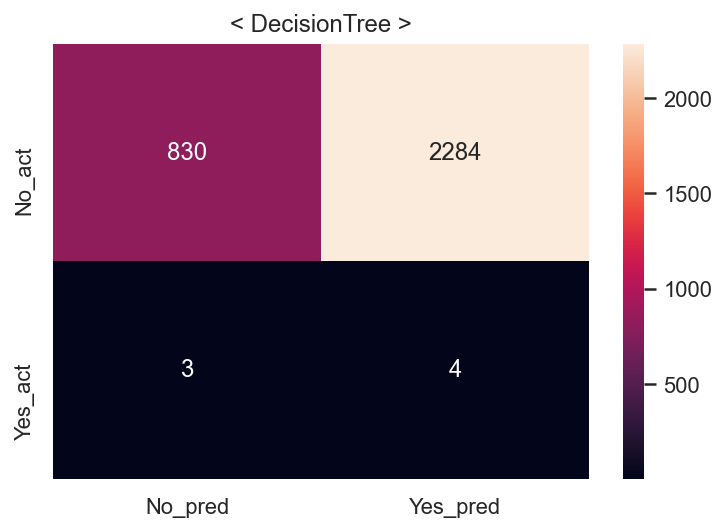

[Pipeline] ............ (step 1 of 2) Processing scaler, total=   0.0s
[Pipeline] ............... (step 2 of 2) Processing clf, total=   0.9s
====Done Evaluation====
====Done Evaluation====


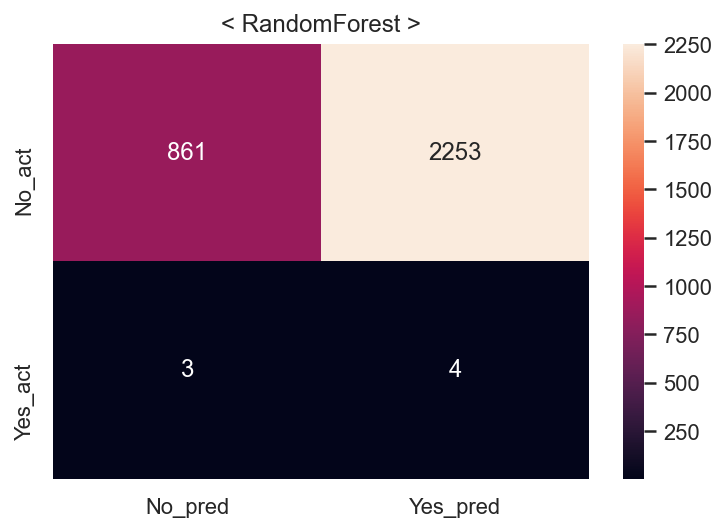

[Pipeline] ............ (step 1 of 2) Processing scaler, total=   0.0s
[Pipeline] ............... (step 2 of 2) Processing clf, total=   0.1s
====Done Evaluation====
====Done Evaluation====


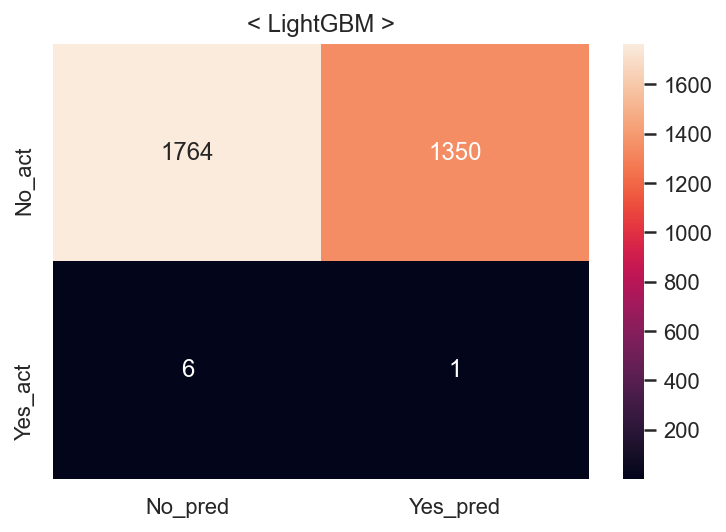

[Pipeline] ............ (step 1 of 2) Processing scaler, total=   0.0s
[Pipeline] ............... (step 2 of 2) Processing clf, total=   9.8s
====Done Evaluation====
====Done Evaluation====


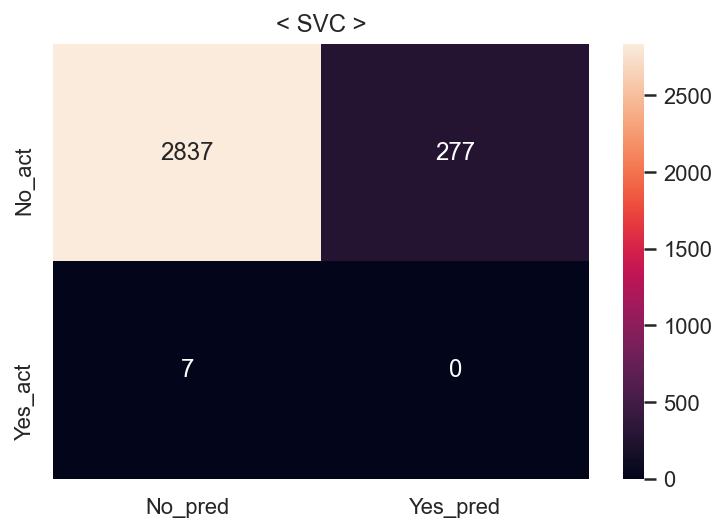

Fit time : 2.4 min


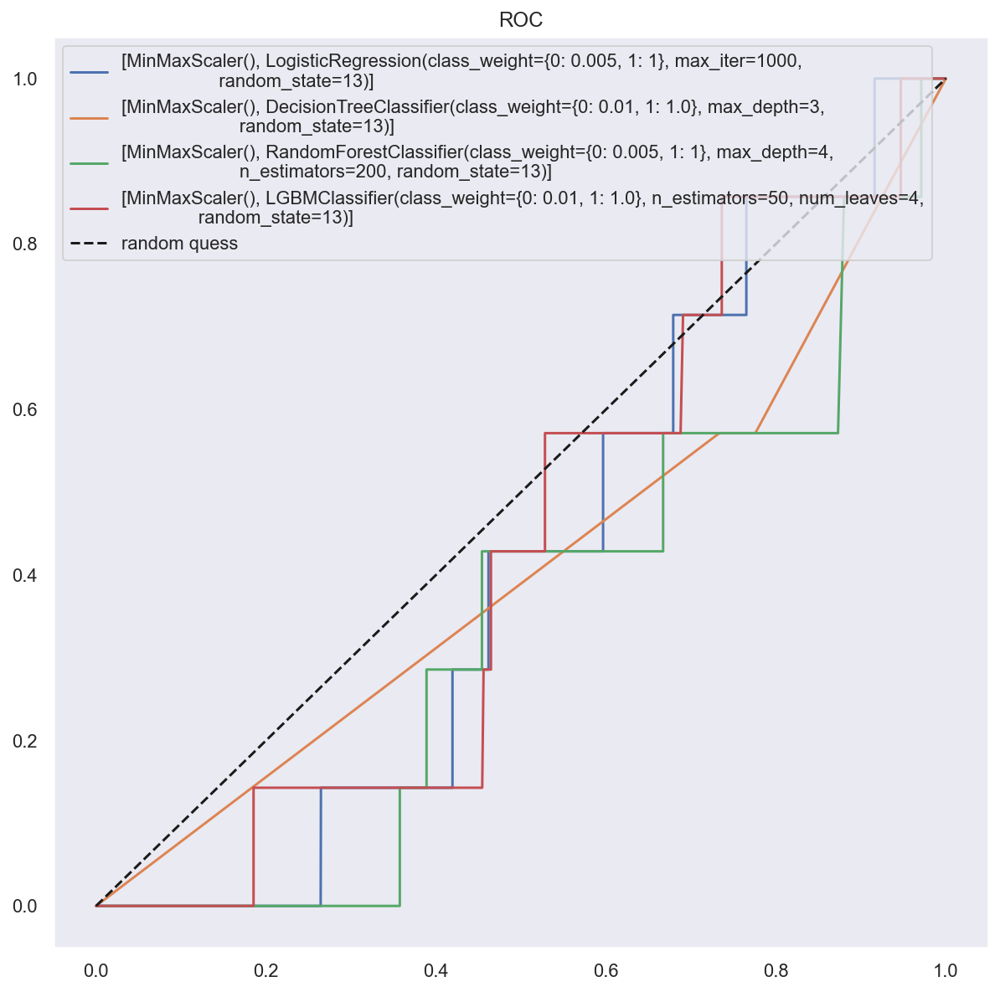

In [35]:
# null 삭제
socar_strange_delete = socar.drop(['c_15', 'c_16', 'c_21', 'c_22', 'c_23', 'c_24'], axis=1)
socar_strange_delete
# 데이터 분리
X_train, X_test, y_train, y_test = ut.split_train_test(socar_strange_delete)
# sampling to SMOTE (default)
X_train_over, y_train_over = ut.fit_sampler(X_train, y_train, sampler='ADASYN')
# evaluation
cv_list12, result_df12 = ut.fit_cv(X_train_over, y_train_over, X_test, y_test, scaler='MM')

In [36]:
result_df12['class_weight'] = [1] * len(result_df12)
result_df12["null_del"] = [1]  * len(result_df12)
result_df12["encoded"] = [0]  * len(result_df12)
result_df12["scaler"] = ["MM"]  * len(result_df12)
result_df12["sampler"] = ["ADASYN"]  * len(result_df12)
result_df12 = result_df12[['class_weight', 'null_del', 'encoded', 'scaler', 'sampler', 'classifier', 'train accuracy', 'train precision',
                             'train recall', 'train f1', 'train auc', 'test accuracy', 'test precision', 'test recall',
                             'test f1', 'test auc']]
result_df12

,class_weight,null_del,encoded,scaler,sampler,classifier,train accuracy,train precision,train recall,train f1,train auc,test accuracy,test precision,test recall,test f1,test auc
0,1,1,0,MM,ADASYN,LogisticReg,0.547786,0.525153,0.999922,0.688637,0.547680,0.146748,0.002249,0.857143,0.004486,0.501147
1,1,1,0,MM,ADASYN,DecisionTree,0.643242,0.583660,0.999922,0.737081,0.643158,0.267222,0.001748,0.571429,0.003486,0.418983
2,1,1,0,MM,ADASYN,RandomForest,0.637034,0.579454,1.000000,0.733740,0.636949,0.277155,0.001772,0.571429,0.003534,0.423961
3,1,1,0,MM,ADASYN,LightGBM,0.772507,0.687443,0.999610,0.814645,0.772454,0.565524,0.000740,0.142857,0.001473,0.354666
4,1,1,0,MM,ADASYN,SVC,0.948349,0.910162,0.994926,0.950658,0.948338,0.909004,0.000000,0.000000,0.000000,0.455523


## 열세번째
### (1) NULL값 삭제,  (2) 데이터 분리, (3) SMOTE, (4) 스케일링 Standard

==Split Result==
y_train :  [[0, 1], [12804, 34]]
y_test : [[0, 1], [3114, 7]]
==Sampling Result==
y_train :  [[0, 1], [12804, 34]]
y_train_over : [[0, 1], [12804, 12804]]
[Pipeline] ............ (step 1 of 2) Processing scaler, total=   0.0s
[Pipeline] ............... (step 2 of 2) Processing clf, total=   0.0s
====Done Evaluation====
====Done Evaluation====


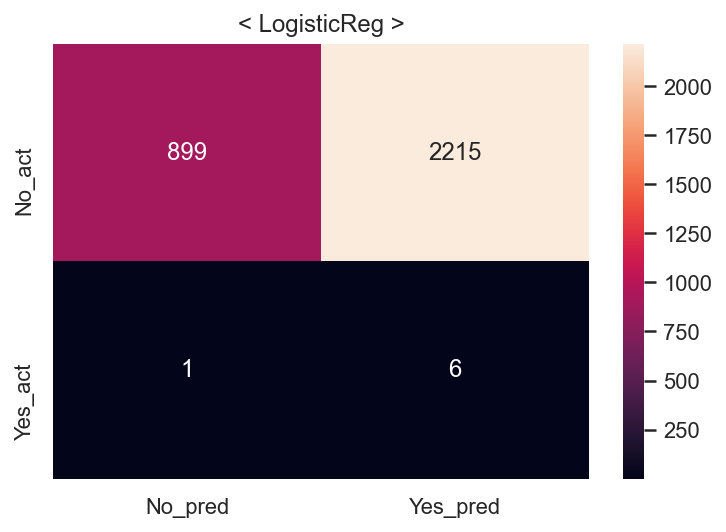

[Pipeline] ............ (step 1 of 2) Processing scaler, total=   0.0s
[Pipeline] ............... (step 2 of 2) Processing clf, total=   0.0s
====Done Evaluation====
====Done Evaluation====


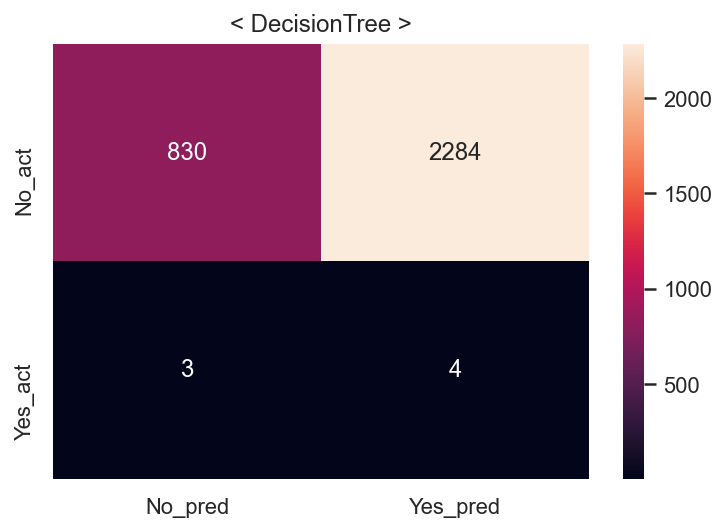

[Pipeline] ............ (step 1 of 2) Processing scaler, total=   0.0s
[Pipeline] ............... (step 2 of 2) Processing clf, total=   0.3s
====Done Evaluation====
====Done Evaluation====


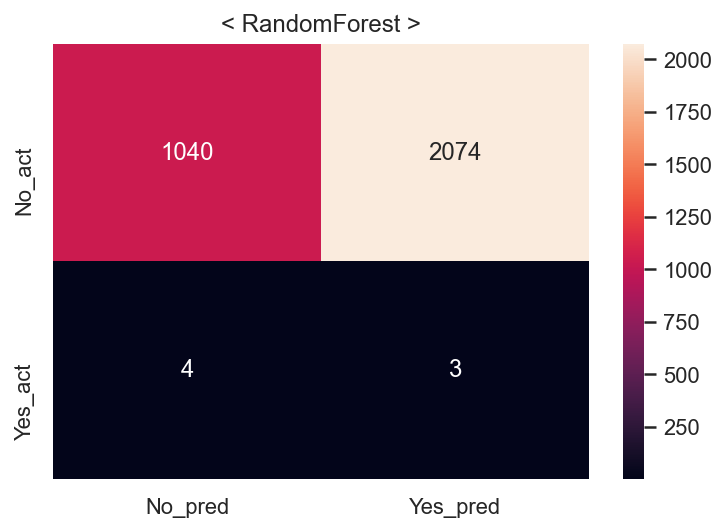

[Pipeline] ............ (step 1 of 2) Processing scaler, total=   0.0s
[Pipeline] ............... (step 2 of 2) Processing clf, total=   0.1s
====Done Evaluation====
====Done Evaluation====


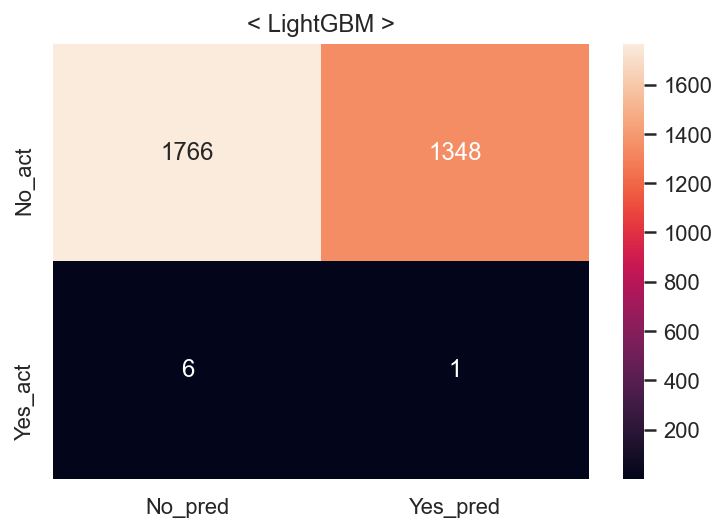

[Pipeline] ............ (step 1 of 2) Processing scaler, total=   0.0s
[Pipeline] ............... (step 2 of 2) Processing clf, total=   6.2s
====Done Evaluation====
====Done Evaluation====


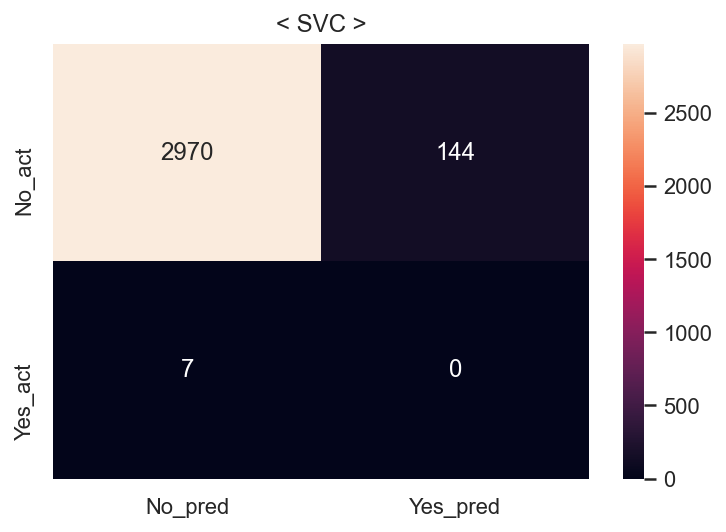

Fit time : 2.14 min


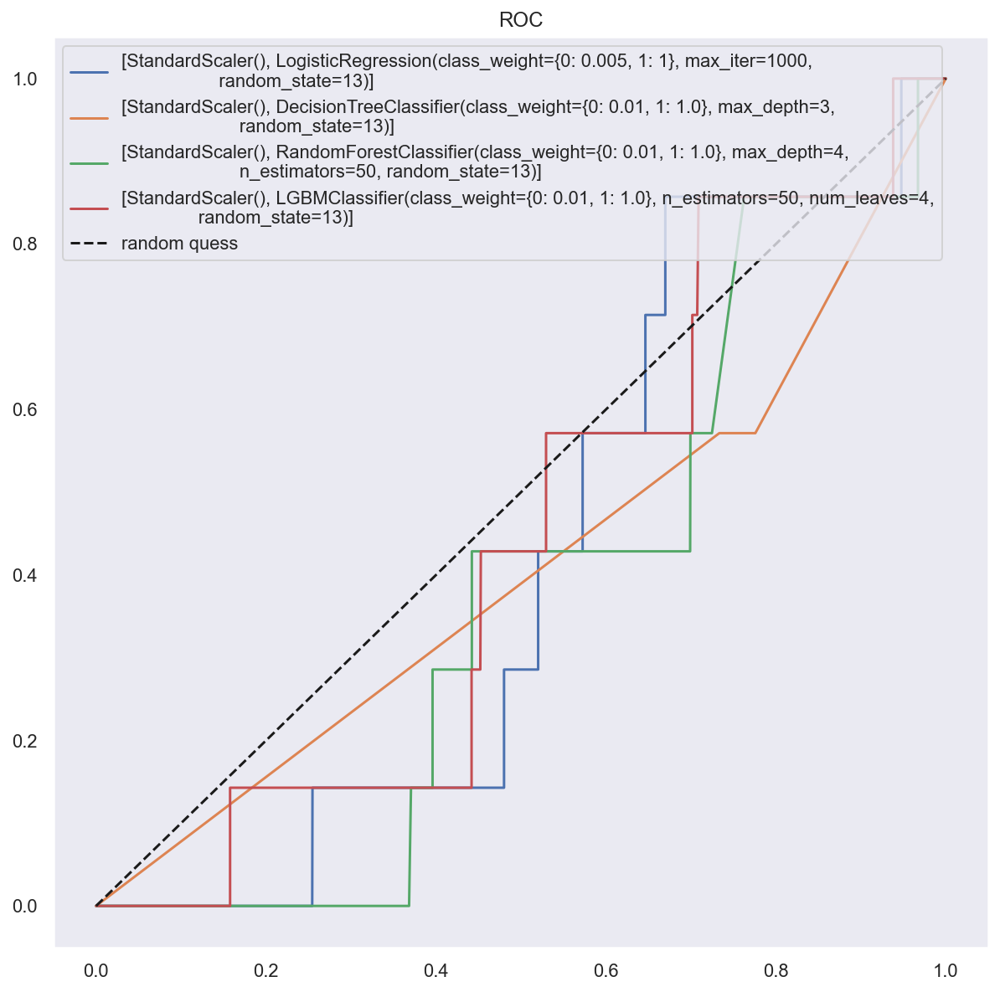

In [37]:
# null 삭제
socar_strange_delete = socar.drop(['c_15', 'c_16', 'c_21', 'c_22', 'c_23', 'c_24'], axis=1)
socar_strange_delete
# 데이터 분리
X_train, X_test, y_train, y_test = ut.split_train_test(socar_strange_delete)
# sampling to SMOTE (default)
X_train_over, y_train_over = ut.fit_sampler(X_train, y_train, sampler='SMOTE')
# evaluation
cv_list13, result_df13 = ut.fit_cv(X_train_over, y_train_over, X_test, y_test, scaler='SD')

In [38]:
result_df13['class_weight'] = [1] * len(result_df13)
result_df13["null_del"] = [1]  * len(result_df13)
result_df13["encoded"] = [0]  * len(result_df13)
result_df13["scaler"] = ["SD"]  * len(result_df13)
result_df13["sampler"] = ["SMOTE"]  * len(result_df13)
result_df13 = result_df13[['class_weight', 'null_del', 'encoded', 'scaler', 'sampler', 'classifier', 'train accuracy', 'train precision',
                             'train recall', 'train f1', 'train auc', 'test accuracy', 'test precision', 'test recall',
                             'test f1', 'test auc']]
result_df13

,class_weight,null_del,encoded,scaler,sampler,classifier,train accuracy,train precision,train recall,train f1,train auc,test accuracy,test precision,test recall,test f1,test auc
0,1,1,0,SD,SMOTE,LogisticReg,0.607974,0.560538,0.999766,0.718330,0.607974,0.289971,0.002701,0.857143,0.005386,0.572920
1,1,1,0,SD,SMOTE,DecisionTree,0.643158,0.583546,0.999922,0.736991,0.643158,0.267222,0.001748,0.571429,0.003486,0.418983
2,1,1,0,SD,SMOTE,RandomForest,0.650734,0.588744,1.000000,0.741144,0.650734,0.334188,0.001444,0.428571,0.002879,0.381274
3,1,1,0,SD,SMOTE,LightGBM,0.775109,0.689861,0.999609,0.816341,0.775109,0.566165,0.000741,0.142857,0.001475,0.354987
4,1,1,0,SD,SMOTE,SVC,0.971454,0.947446,0.998282,0.972200,0.971454,0.951618,0.000000,0.000000,0.000000,0.476879


## 열네번째
### (1) NULL값 삭제,  (2) 데이터 분리, (3) ADASYN, (4) 스케일링 Standard

==Split Result==
y_train :  [[0, 1], [12804, 34]]
y_test : [[0, 1], [3114, 7]]
==Sampling Result==
y_train :  [[0, 1], [12804, 34]]
y_train_over : [[0, 1], [12804, 12810]]
[Pipeline] ............ (step 1 of 2) Processing scaler, total=   0.0s
[Pipeline] ............... (step 2 of 2) Processing clf, total=   0.0s
====Done Evaluation====
====Done Evaluation====


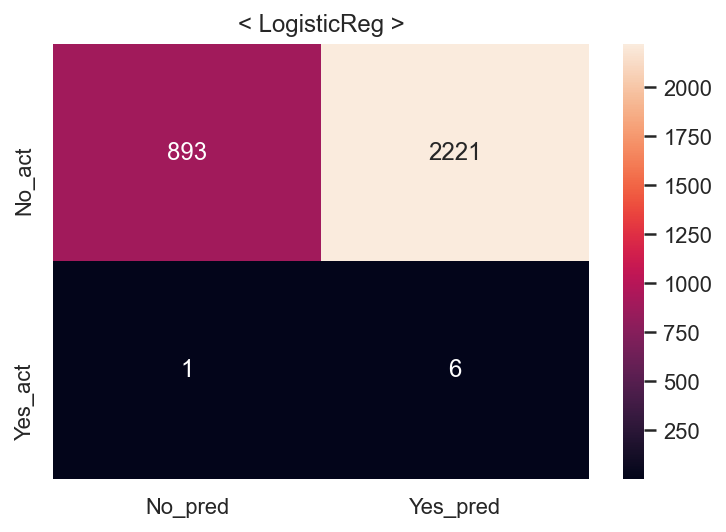

[Pipeline] ............ (step 1 of 2) Processing scaler, total=   0.0s
[Pipeline] ............... (step 2 of 2) Processing clf, total=   0.0s
====Done Evaluation====
====Done Evaluation====


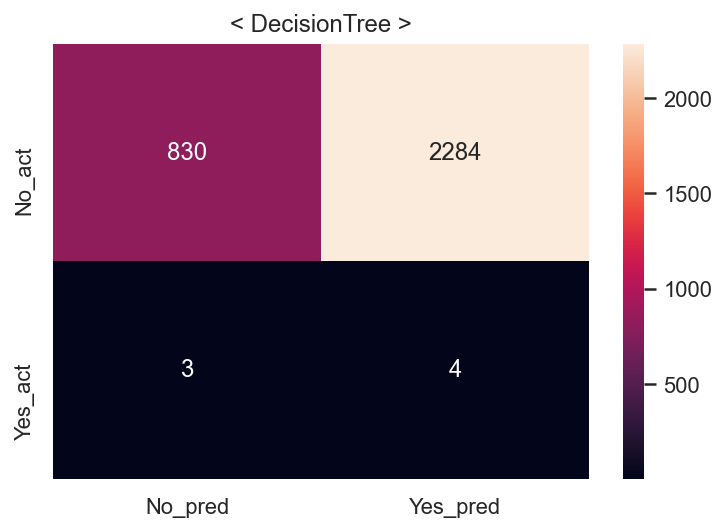

[Pipeline] ............ (step 1 of 2) Processing scaler, total=   0.0s
[Pipeline] ............... (step 2 of 2) Processing clf, total=   0.9s
====Done Evaluation====
====Done Evaluation====


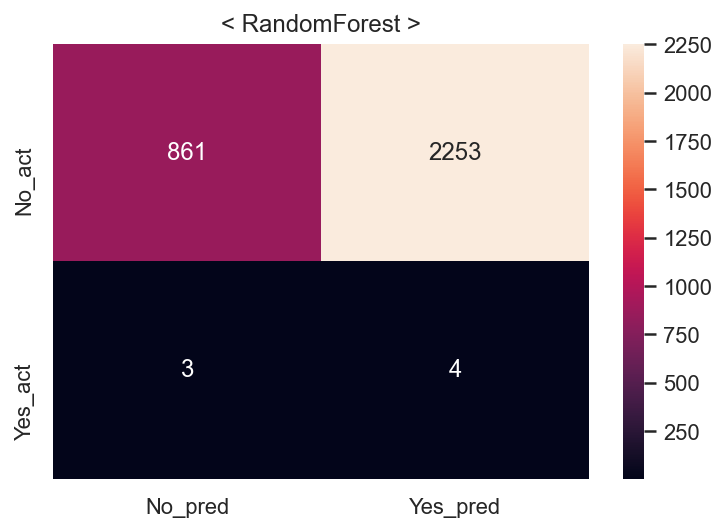

[Pipeline] ............ (step 1 of 2) Processing scaler, total=   0.0s
[Pipeline] ............... (step 2 of 2) Processing clf, total=   0.1s
====Done Evaluation====
====Done Evaluation====


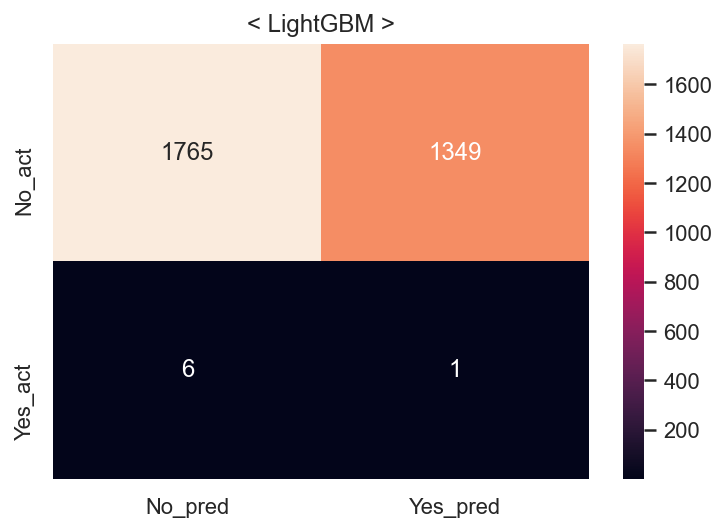

[Pipeline] ............ (step 1 of 2) Processing scaler, total=   0.0s
[Pipeline] ............... (step 2 of 2) Processing clf, total=   6.7s
====Done Evaluation====
====Done Evaluation====


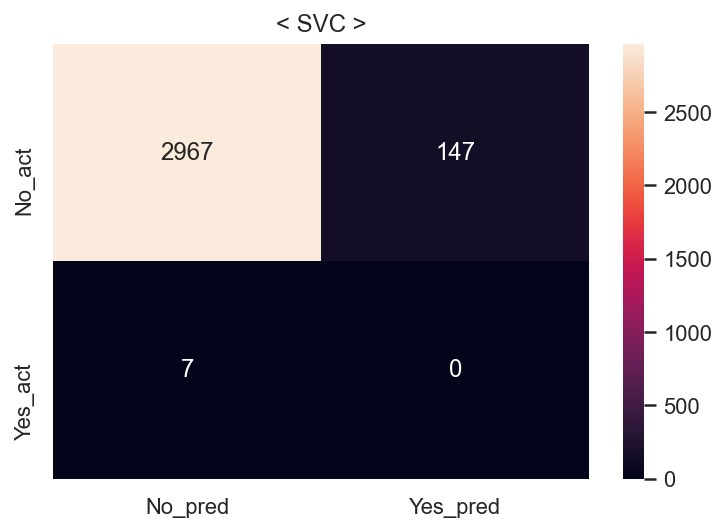

Fit time : 2.16 min


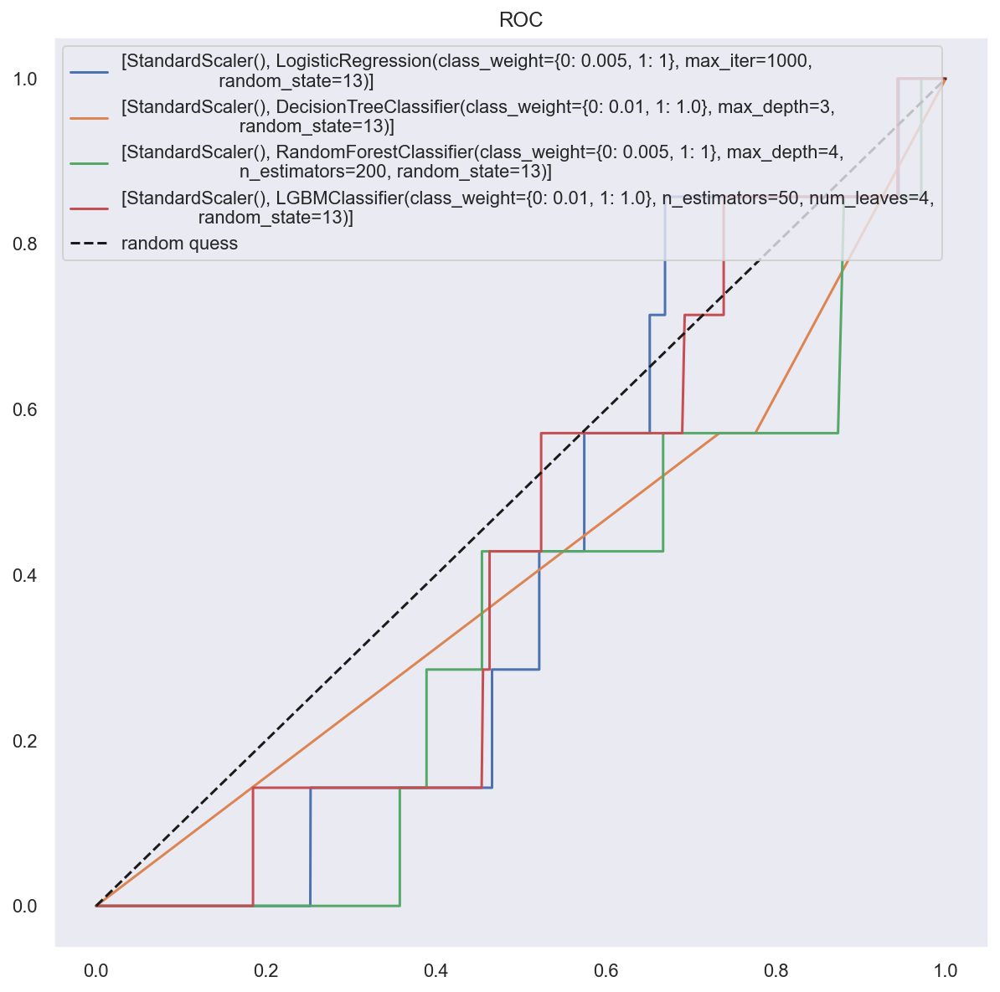

In [39]:
# null 삭제
socar_strange_delete = socar.drop(['c_15', 'c_16', 'c_21', 'c_22', 'c_23', 'c_24'], axis=1)
socar_strange_delete
# 데이터 분리
X_train, X_test, y_train, y_test = ut.split_train_test(socar_strange_delete)
# sampling to SMOTE (default)
X_train_over, y_train_over = ut.fit_sampler(X_train, y_train, sampler='ADASYN')
# evaluation
cv_list14, result_df14 = ut.fit_cv(X_train_over, y_train_over, X_test, y_test, scaler='SD')

In [40]:
result_df14['class_weight'] = [1] * len(result_df14)
result_df14["null_del"] = [1]  * len(result_df14)
result_df14["encoded"] = [0]  * len(result_df14)
result_df14["scaler"] = ["SD"]  * len(result_df14)
result_df14["sampler"] = ["ADASYN"]  * len(result_df14)
result_df14 = result_df14[['class_weight', 'null_del', 'encoded', 'scaler', 'sampler', 'classifier', 'train accuracy', 'train precision',
                             'train recall', 'train f1', 'train auc', 'test accuracy', 'test precision', 'test recall',
                             'test f1', 'test auc']]
result_df14

,class_weight,null_del,encoded,scaler,sampler,classifier,train accuracy,train precision,train recall,train f1,train auc,test accuracy,test precision,test recall,test f1,test auc
0,1,1,0,SD,ADASYN,LogisticReg,0.606504,0.559673,0.999766,0.717620,0.606412,0.288049,0.002694,0.857143,0.005372,0.571956
1,1,1,0,SD,ADASYN,DecisionTree,0.643242,0.583660,0.999922,0.737081,0.643158,0.267222,0.001748,0.571429,0.003486,0.418983
2,1,1,0,SD,ADASYN,RandomForest,0.637034,0.579454,1.000000,0.733740,0.636949,0.277155,0.001772,0.571429,0.003534,0.423961
3,1,1,0,SD,ADASYN,LightGBM,0.772117,0.687074,0.999610,0.814386,0.772064,0.565844,0.000741,0.142857,0.001474,0.354826
4,1,1,0,SD,ADASYN,SVC,0.970953,0.946889,0.997892,0.971722,0.970947,0.950657,0.000000,0.000000,0.000000,0.476397


## 열다섯번째
### (1) NULL값 삭제,  (2) 데이터 분리, (3) SMOTE, (4) 스케일링 Robust

==Split Result==
y_train :  [[0, 1], [12804, 34]]
y_test : [[0, 1], [3114, 7]]
==Sampling Result==
y_train :  [[0, 1], [12804, 34]]
y_train_over : [[0, 1], [12804, 12804]]
[Pipeline] ............ (step 1 of 2) Processing scaler, total=   0.0s
[Pipeline] ............... (step 2 of 2) Processing clf, total=   0.2s
====Done Evaluation====
====Done Evaluation====


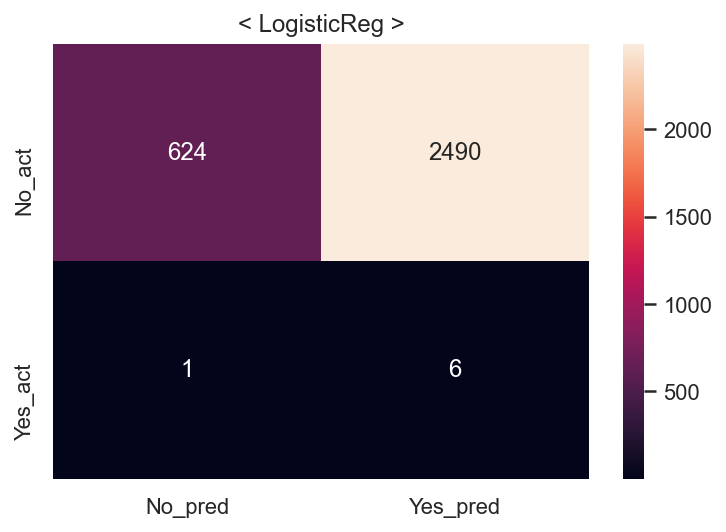

[Pipeline] ............ (step 1 of 2) Processing scaler, total=   0.0s
[Pipeline] ............... (step 2 of 2) Processing clf, total=   0.0s
====Done Evaluation====
====Done Evaluation====


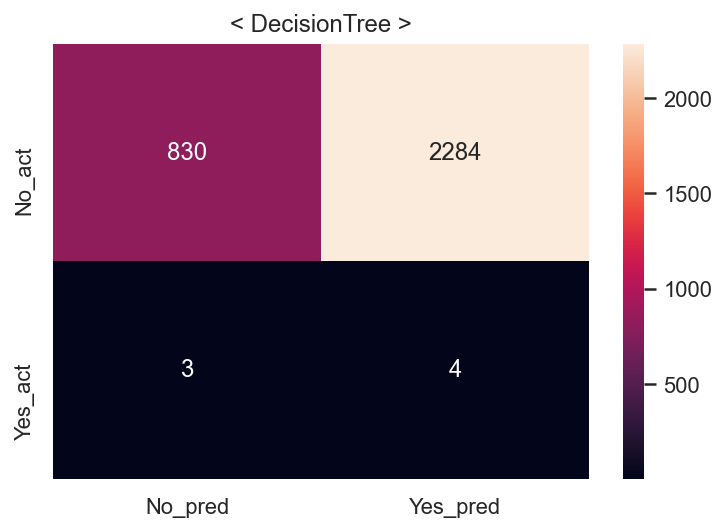

[Pipeline] ............ (step 1 of 2) Processing scaler, total=   0.0s
[Pipeline] ............... (step 2 of 2) Processing clf, total=   0.2s
====Done Evaluation====
====Done Evaluation====


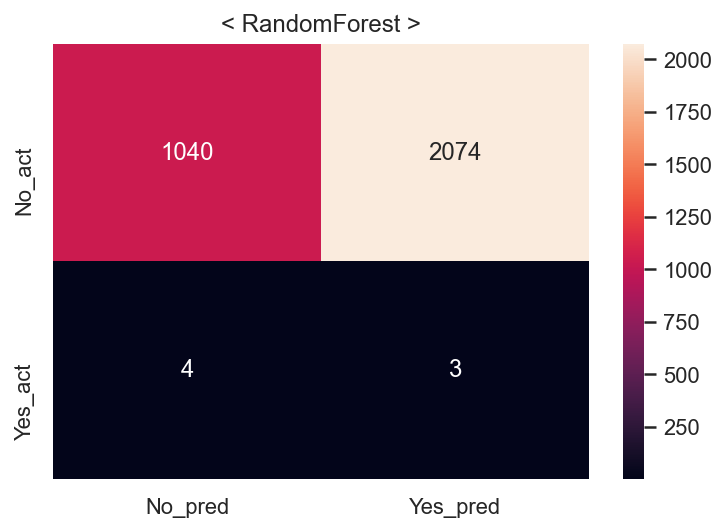

[Pipeline] ............ (step 1 of 2) Processing scaler, total=   0.0s
[Pipeline] ............... (step 2 of 2) Processing clf, total=   0.1s
====Done Evaluation====
====Done Evaluation====


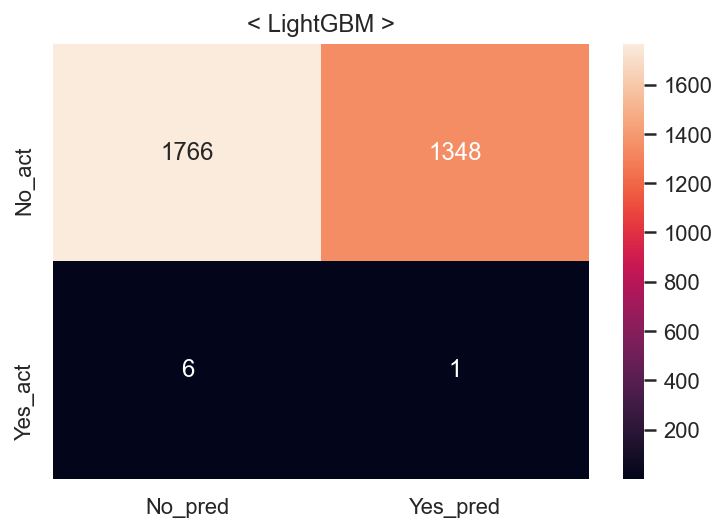

[Pipeline] ............ (step 1 of 2) Processing scaler, total=   0.0s
[Pipeline] ............... (step 2 of 2) Processing clf, total=  19.2s
====Done Evaluation====
====Done Evaluation====


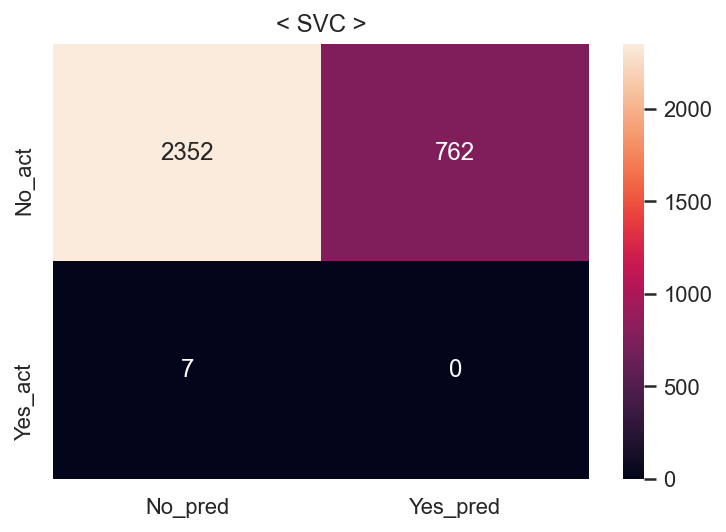

Fit time : 3.36 min


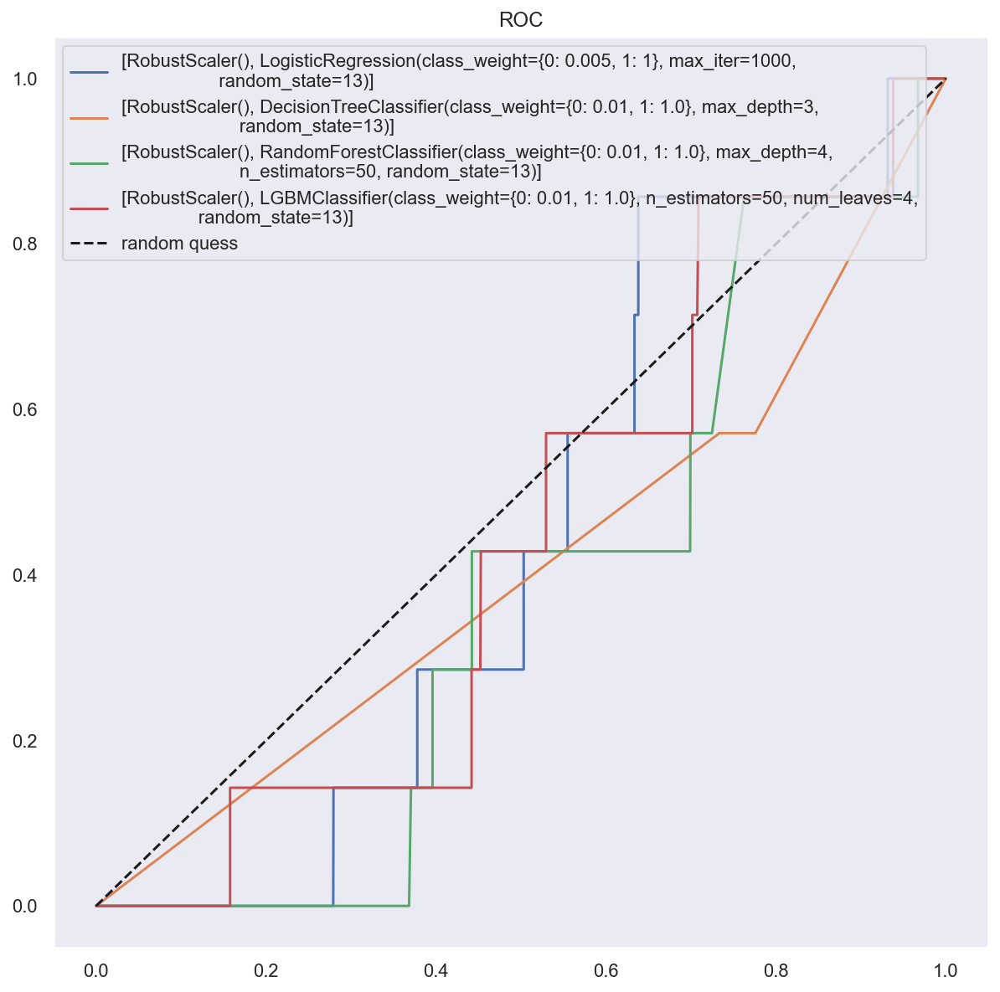

In [41]:
# null 삭제
socar_strange_delete = socar.drop(['c_15', 'c_16', 'c_21', 'c_22', 'c_23', 'c_24'], axis=1)
socar_strange_delete
# 데이터 분리
X_train, X_test, y_train, y_test = ut.split_train_test(socar_strange_delete)
# sampling to SMOTE (default)
X_train_over, y_train_over = ut.fit_sampler(X_train, y_train, sampler='SMOTE')
# evaluation
cv_list15, result_df15 = ut.fit_cv(X_train_over, y_train_over, X_test, y_test, scaler='RB')

In [42]:
result_df15['class_weight'] = [1] * len(result_df15)
result_df15["null_del"] = [1]  * len(result_df15)
result_df15["encoded"] = [0]  * len(result_df15)
result_df15["scaler"] = ["RB"]  * len(result_df15)
result_df15["sampler"] = ["SMOTE"]  * len(result_df15)
result_df15 = result_df15[['class_weight', 'null_del', 'encoded', 'scaler', 'sampler', 'classifier', 'train accuracy', 'train precision',
                             'train recall', 'train f1', 'train auc', 'test accuracy', 'test precision', 'test recall',
                             'test f1', 'test auc']]
result_df15

,class_weight,null_del,encoded,scaler,sampler,classifier,train accuracy,train precision,train recall,train f1,train auc,test accuracy,test precision,test recall,test f1,test auc
0,1,1,0,RB,SMOTE,LogisticReg,0.582435,0.544928,0.999844,0.705403,0.582435,0.201858,0.002404,0.857143,0.004794,0.528764
1,1,1,0,RB,SMOTE,DecisionTree,0.643158,0.583546,0.999922,0.736991,0.643158,0.267222,0.001748,0.571429,0.003486,0.418983
2,1,1,0,RB,SMOTE,RandomForest,0.650734,0.588744,1.000000,0.741144,0.650734,0.334188,0.001444,0.428571,0.002879,0.381274
3,1,1,0,RB,SMOTE,LightGBM,0.775109,0.689861,0.999609,0.816341,0.775109,0.566165,0.000741,0.142857,0.001475,0.354987
4,1,1,0,RB,SMOTE,SVC,0.791120,0.753107,0.866214,0.805710,0.791120,0.753605,0.000000,0.000000,0.000000,0.377649


## 열여섯번째
### (1) NULL값 삭제,  (2) 데이터 분리, (3) ADASYN, (4) 스케일링 Robust

==Split Result==
y_train :  [[0, 1], [12804, 34]]
y_test : [[0, 1], [3114, 7]]
==Sampling Result==
y_train :  [[0, 1], [12804, 34]]
y_train_over : [[0, 1], [12804, 12810]]
[Pipeline] ............ (step 1 of 2) Processing scaler, total=   0.0s
[Pipeline] ............... (step 2 of 2) Processing clf, total=   0.2s
====Done Evaluation====
====Done Evaluation====


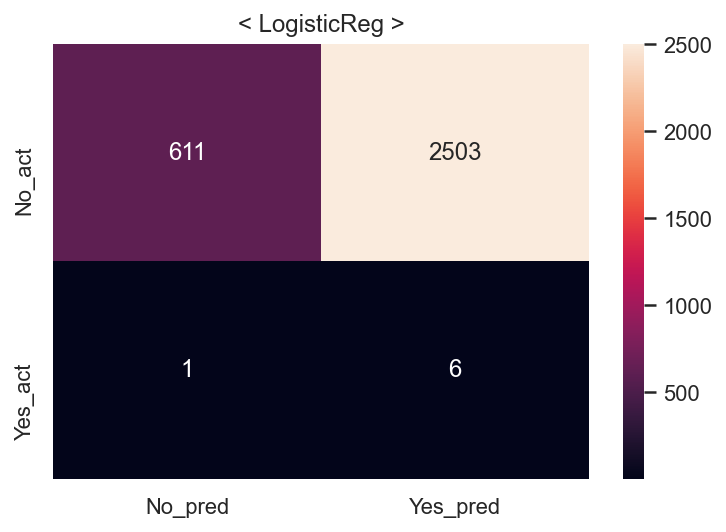

[Pipeline] ............ (step 1 of 2) Processing scaler, total=   0.0s
[Pipeline] ............... (step 2 of 2) Processing clf, total=   0.0s
====Done Evaluation====
====Done Evaluation====


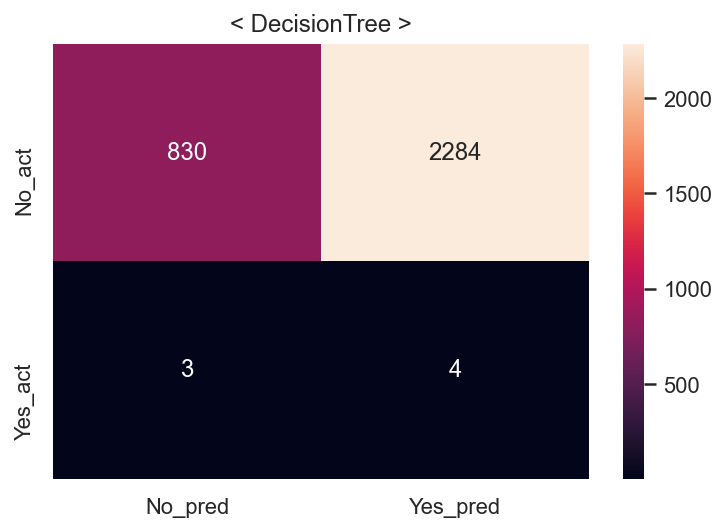

[Pipeline] ............ (step 1 of 2) Processing scaler, total=   0.0s
[Pipeline] ............... (step 2 of 2) Processing clf, total=   0.9s
====Done Evaluation====
====Done Evaluation====


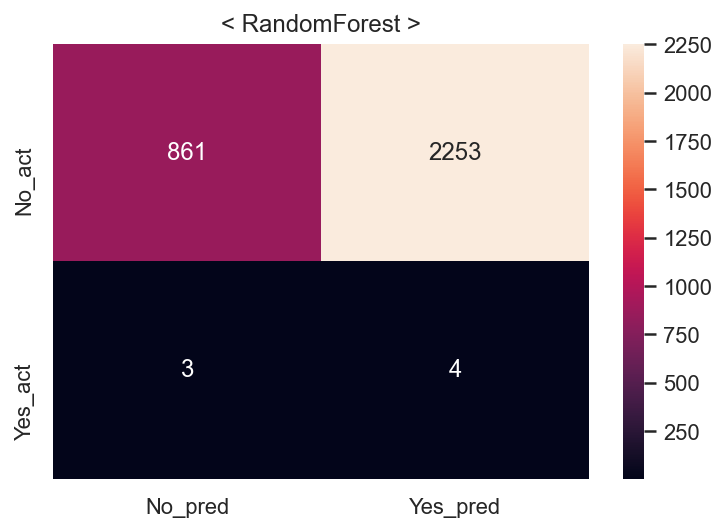

[Pipeline] ............ (step 1 of 2) Processing scaler, total=   0.0s
[Pipeline] ............... (step 2 of 2) Processing clf, total=   0.1s
====Done Evaluation====
====Done Evaluation====


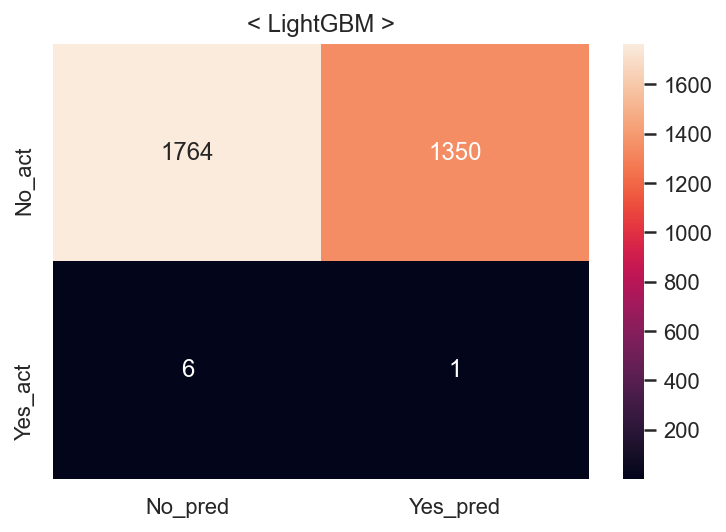

[Pipeline] ............ (step 1 of 2) Processing scaler, total=   0.0s
[Pipeline] ............... (step 2 of 2) Processing clf, total=  21.5s
====Done Evaluation====
====Done Evaluation====


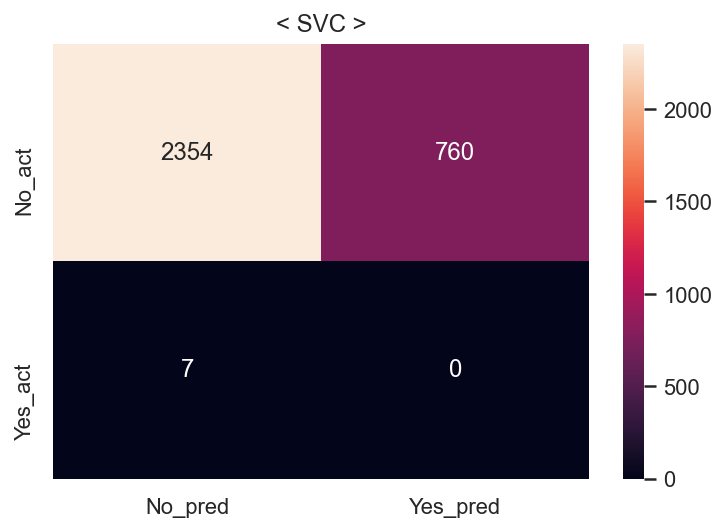

Fit time : 3.43 min


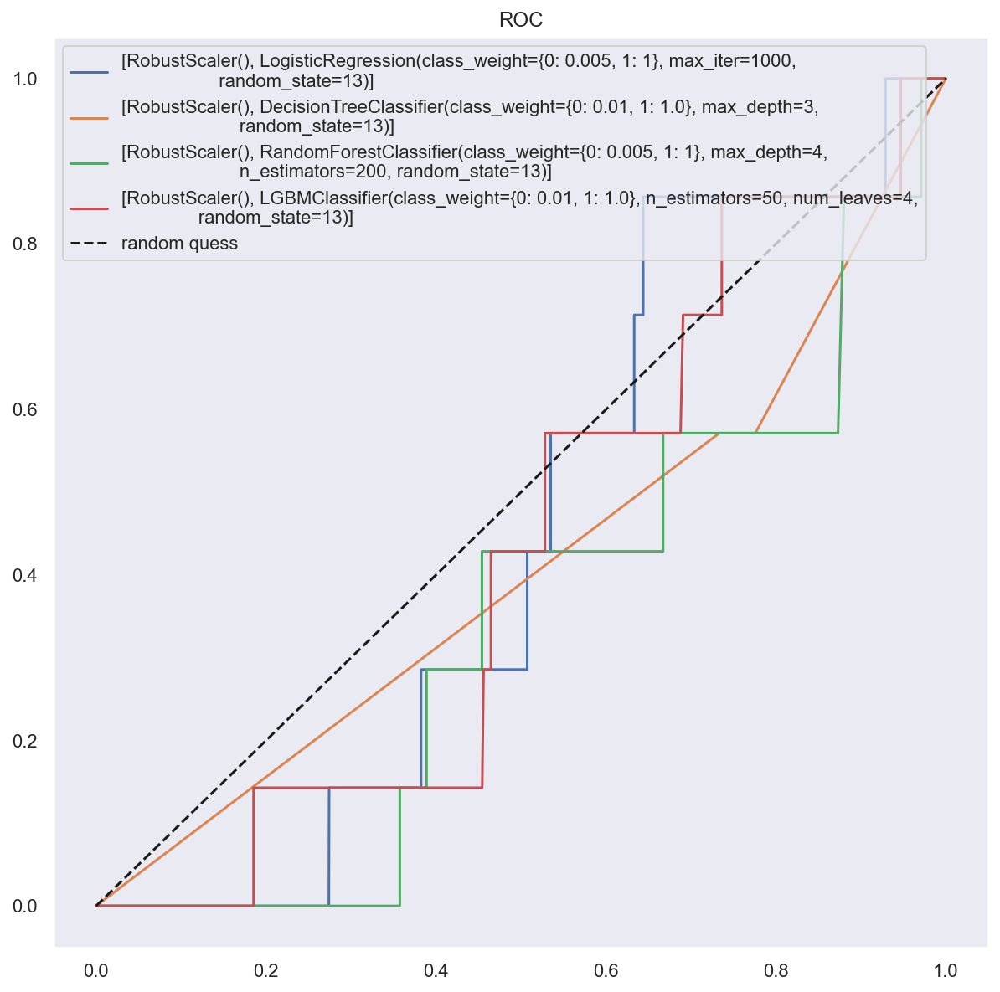

In [43]:
# null 삭제
socar_strange_delete = socar.drop(['c_15', 'c_16', 'c_21', 'c_22', 'c_23', 'c_24'], axis=1)
socar_strange_delete
# 데이터 분리
X_train, X_test, y_train, y_test = ut.split_train_test(socar_strange_delete)
# sampling to SMOTE (default)
X_train_over, y_train_over = ut.fit_sampler(X_train, y_train, sampler='ADASYN')
# evaluation
cv_list16, result_df16 = ut.fit_cv(X_train_over, y_train_over, X_test, y_test, scaler='RB')

In [44]:
result_df16['class_weight'] = [1] * len(result_df16)
result_df16["null_del"] = [1]  * len(result_df16)
result_df16["encoded"] = [0]  * len(result_df16)
result_df16["scaler"] = ["RB"]  * len(result_df16)
result_df16["sampler"] = ["ADASYN"]  * len(result_df16)
result_df16 = result_df16[['class_weight', 'null_del', 'encoded', 'scaler', 'sampler', 'classifier', 'train accuracy', 'train precision',
                             'train recall', 'train f1', 'train auc', 'test accuracy', 'test precision', 'test recall',
                             'test f1', 'test auc']]
result_df16

,class_weight,null_del,encoded,scaler,sampler,classifier,train accuracy,train precision,train recall,train f1,train auc,test accuracy,test precision,test recall,test f1,test auc
0,1,1,0,RB,ADASYN,LogisticReg,0.580659,0.543933,0.999844,0.704569,0.580561,0.197693,0.002391,0.857143,0.004769,0.526677
1,1,1,0,RB,ADASYN,DecisionTree,0.643242,0.583660,0.999922,0.737081,0.643158,0.267222,0.001748,0.571429,0.003486,0.418983
2,1,1,0,RB,ADASYN,RandomForest,0.637034,0.579454,1.000000,0.733740,0.636949,0.277155,0.001772,0.571429,0.003534,0.423961
3,1,1,0,RB,ADASYN,LightGBM,0.772507,0.687443,0.999610,0.814645,0.772454,0.565524,0.000740,0.142857,0.001473,0.354666
4,1,1,0,RB,ADASYN,SVC,0.788397,0.751326,0.862295,0.802995,0.788380,0.754245,0.000000,0.000000,0.000000,0.377970


## 2. 이상 index 삭제, 원핫인코딩 쓰는 경우 - 8가지 

In [9]:
socar

,c_1,c_2,c_3,c_4,c_5,c_6,c_7,c_8,c_9,c_10,...,c_16,c_17,c_18,c_19,c_20,c_21,c_22,c_23,c_24,c_25
0,0,2,1,3,0,2,0,100,2,0,...,0,1,0,0,1,0,0,0,-1,0
1,0,1,0,4,0,4,0,0,3,1,...,0,1,1,1,2,1,1,1,0,1
2,0,1,0,4,1,4,0,100,3,1,...,12925040,3,1,0,2,1,1,1,0,1
3,0,3,1,3,0,4,0,0,2,0,...,0,3,1,0,1,0,0,0,-1,0
4,0,1,0,1,0,1,0,100,1,0,...,1209410,1,0,0,2,0,0,0,-1,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
15995,0,2,0,2,0,2,0,100,2,0,...,0,1,1,0,1,0,0,0,-1,0
15996,0,2,0,2,1,4,0,100,1,1,...,0,2,1,0,1,0,0,0,-1,0
15997,0,2,1,2,0,4,0,100,1,0,...,0,0,0,0,1,0,0,0,-1,1
15998,0,2,0,2,0,2,0,100,2,0,...,0,4,1,0,1,0,0,0,-1,0


In [10]:
columns_1hot = socar.columns.drop(['c_1', 'c_3', 'c_5', 'c_10', 'c_11', 'c_18', 'c_19', 'c_8', 'c_15', 'c_16', 'c_20', 'c_25'])
socar_strange_1hot = pd.get_dummies(socar, columns=columns_1hot)

## 열일곱번째
### (1) NULL값 유지, (2)데이터 분리, (3) SMOTE, (4) 스케일링 없음

==Split Result==
y_train :  [[0, 1], [12804, 34]]
y_test : [[0, 1], [3114, 7]]
==Sampling Result==
y_train :  [[0, 1], [12804, 34]]
y_train_over : [[0, 1], [12804, 12804]]
[Pipeline] ............ (step 1 of 2) Processing scaler, total=   0.0s
[Pipeline] ............... (step 2 of 2) Processing clf, total=   0.3s
====Done Evaluation====
====Done Evaluation====


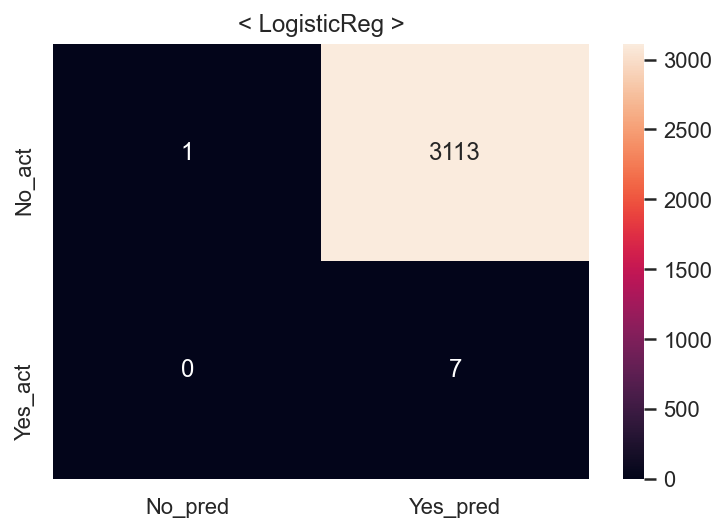

[Pipeline] ............ (step 1 of 2) Processing scaler, total=   0.0s
[Pipeline] ............... (step 2 of 2) Processing clf, total=   0.0s
====Done Evaluation====
====Done Evaluation====


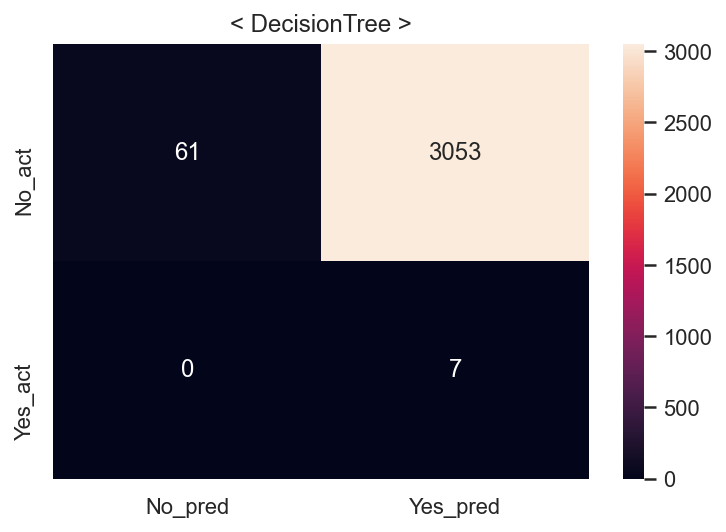

[Pipeline] ............ (step 1 of 2) Processing scaler, total=   0.0s
[Pipeline] ............... (step 2 of 2) Processing clf, total=   0.6s
====Done Evaluation====
====Done Evaluation====


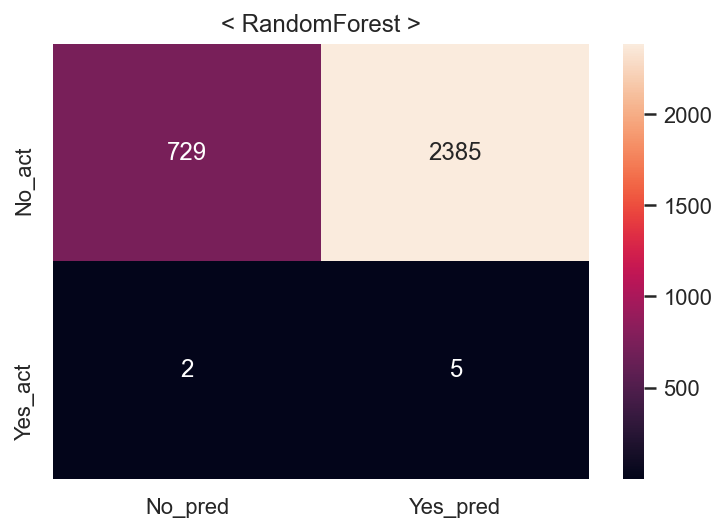

[Pipeline] ............ (step 1 of 2) Processing scaler, total=   0.0s
[Pipeline] ............... (step 2 of 2) Processing clf, total=   0.1s
====Done Evaluation====
====Done Evaluation====


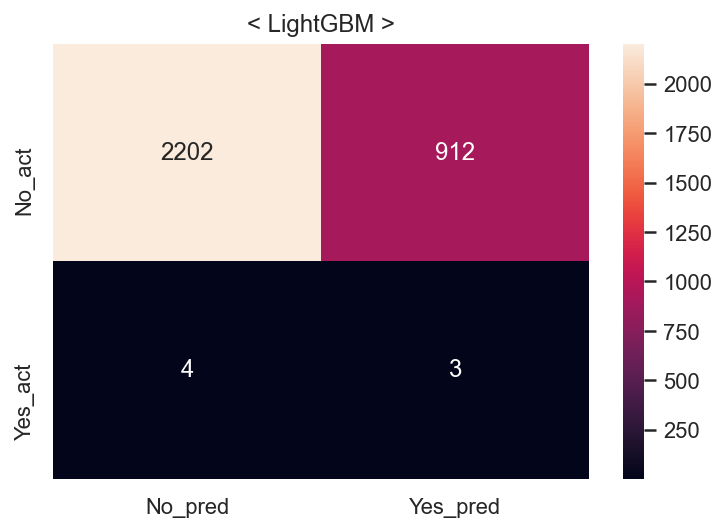

[Pipeline] ............ (step 1 of 2) Processing scaler, total=   0.0s
[Pipeline] ............... (step 2 of 2) Processing clf, total=  49.0s
====Done Evaluation====
====Done Evaluation====


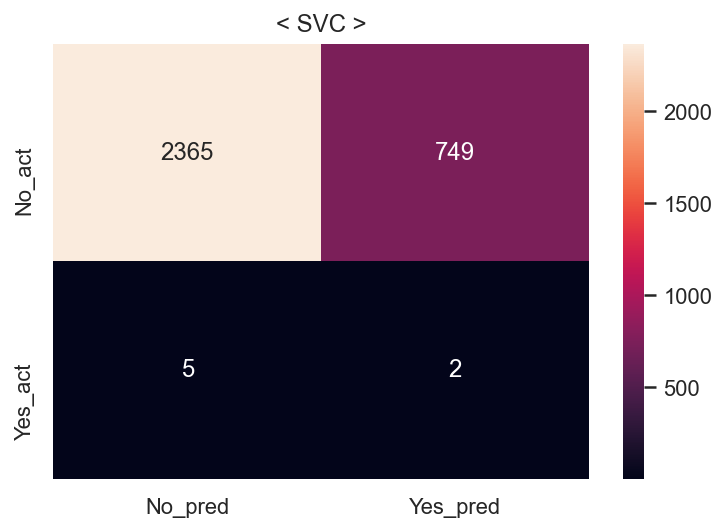

Fit time : 7.23 min


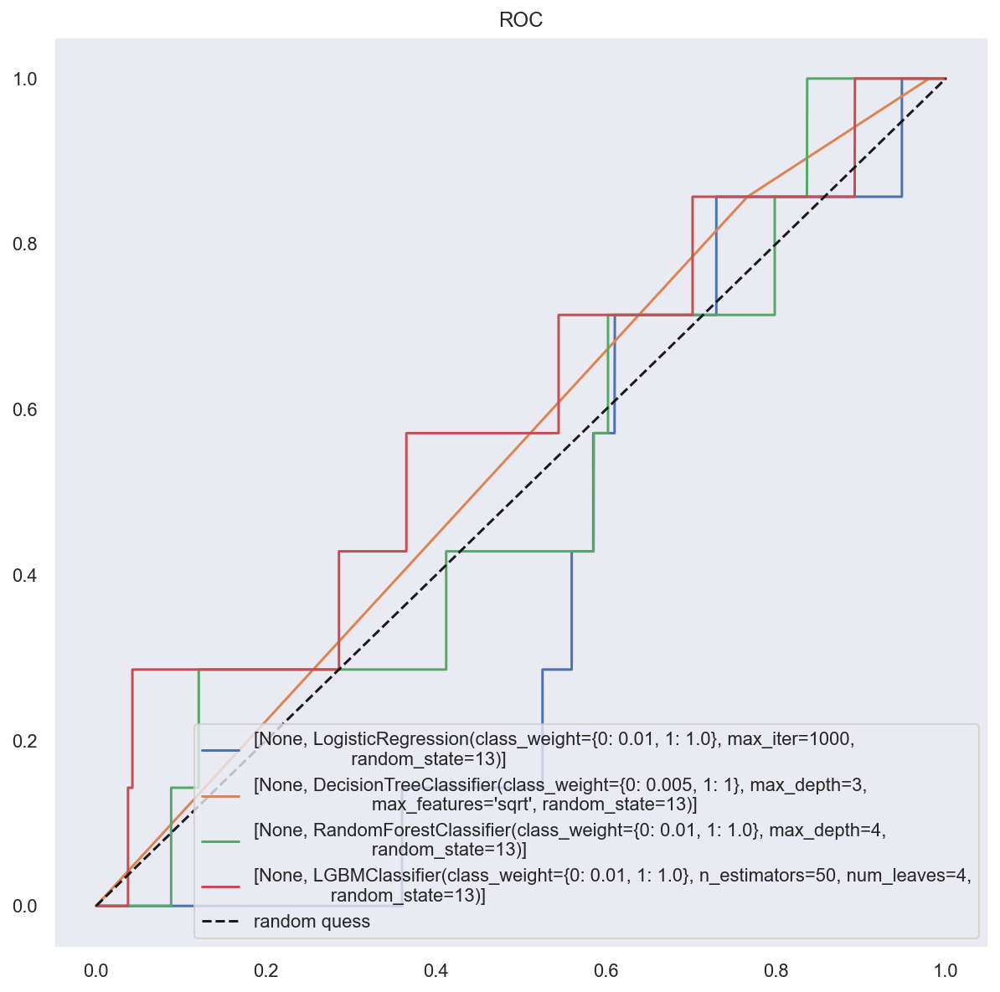

In [47]:
# 1hot
columns_1hot = socar.columns.drop(['c_1', 'c_3', 'c_5', 'c_10', 'c_11', 'c_18', 'c_19', 'c_8', 'c_15', 'c_16', 'c_20', 'c_25'])
socar_strange_1hot = pd.get_dummies(socar, columns=columns_1hot)
# 데이터 분리
X_train, X_test, y_train, y_test = ut.split_train_test(socar_strange_1hot)
# sampling to SMOTE (default)
X_train_over, y_train_over = ut.fit_sampler(X_train, y_train, sampler='SMOTE')
# evaluation
cv_list17, result_df17 = ut.fit_cv(X_train_over, y_train_over, X_test, y_test, scaler='No')

In [48]:
result_df17['class_weight'] = [1] * len(result_df17)
result_df17["null_del"] = [0]  * len(result_df17)
result_df17["encoded"] = [1]  * len(result_df17)
result_df17["scaler"] = ["None"]  * len(result_df17)
result_df17["sampler"] = ["SMOTE"]  * len(result_df17)
result_df17 = result_df17[['class_weight', 'null_del', 'encoded', 'scaler', 'sampler', 'classifier', 'train accuracy', 'train precision',
                             'train recall', 'train f1', 'train auc', 'test accuracy', 'test precision', 'test recall',
                             'test f1', 'test auc']]
result_df17

,class_weight,null_del,encoded,scaler,sampler,classifier,train accuracy,train precision,train recall,train f1,train auc,test accuracy,test precision,test recall,test f1,test auc
0,1,0,1,None,SMOTE,LogisticReg,0.500195,0.500098,1.000000,0.666753,0.500195,0.002563,0.002244,1.000000,0.004477,0.500161
1,1,0,1,None,SMOTE,DecisionTree,0.513160,0.506668,1.000000,0.672567,0.513160,0.021788,0.002288,1.000000,0.004565,0.509794
2,1,0,1,None,SMOTE,RandomForest,0.632029,0.576056,1.000000,0.731010,0.632029,0.235181,0.002092,0.714286,0.004172,0.474195
3,1,0,1,None,SMOTE,LightGBM,0.889722,0.819667,0.999297,0.900612,0.889722,0.706504,0.003279,0.428571,0.006508,0.567850
4,1,0,1,None,SMOTE,SVC,0.611137,0.657064,0.464933,0.544548,0.611137,0.758411,0.002663,0.285714,0.005277,0.522594


## 열여덟번째
### (1) NULL값 유지, (2)데이터 분리, (3) ADASYN, (4) 스케일링 없음

==Split Result==
y_train :  [[0, 1], [12804, 34]]
y_test : [[0, 1], [3114, 7]]
==Sampling Result==
y_train :  [[0, 1], [12804, 34]]
y_train_over : [[0, 1], [12804, 12818]]
[Pipeline] ............ (step 1 of 2) Processing scaler, total=   0.0s
[Pipeline] ............... (step 2 of 2) Processing clf, total=   0.2s
====Done Evaluation====
====Done Evaluation====


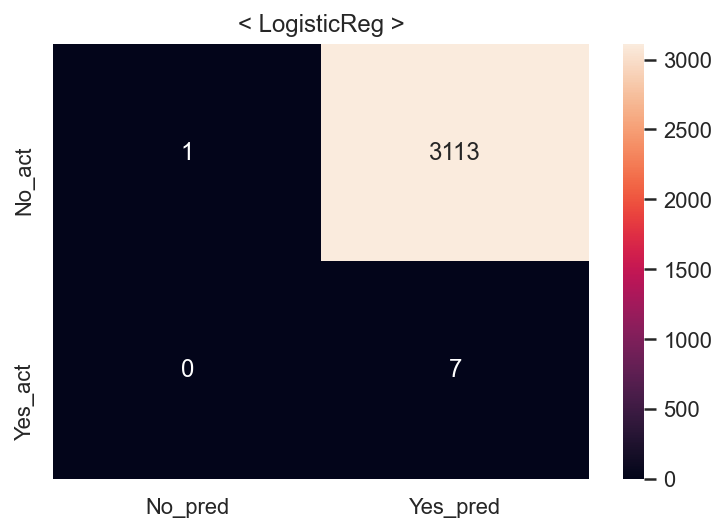

[Pipeline] ............ (step 1 of 2) Processing scaler, total=   0.0s
[Pipeline] ............... (step 2 of 2) Processing clf, total=   0.0s
====Done Evaluation====
====Done Evaluation====


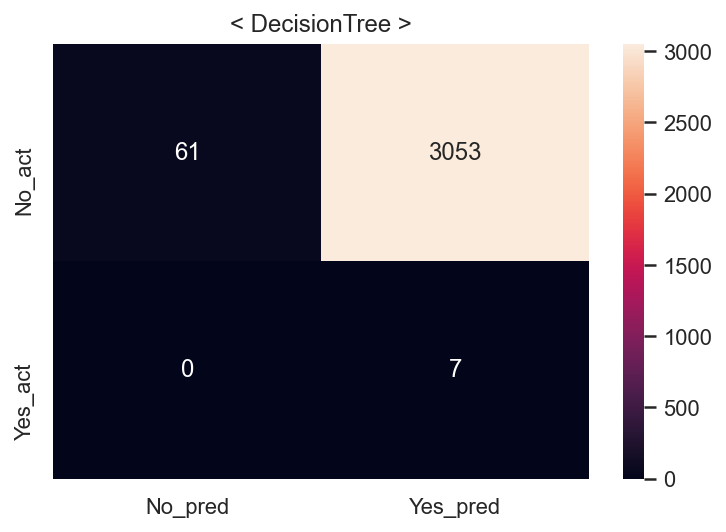

[Pipeline] ............ (step 1 of 2) Processing scaler, total=   0.0s
[Pipeline] ............... (step 2 of 2) Processing clf, total=   0.3s
====Done Evaluation====
====Done Evaluation====


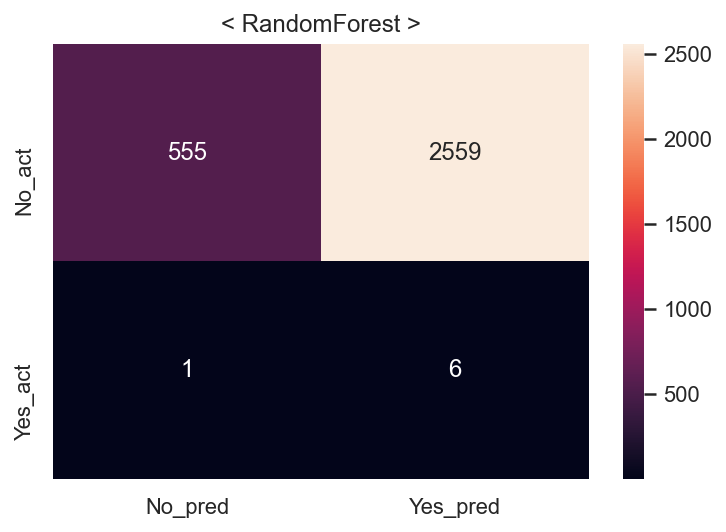

[Pipeline] ............ (step 1 of 2) Processing scaler, total=   0.0s
[Pipeline] ............... (step 2 of 2) Processing clf, total=   0.1s
====Done Evaluation====
====Done Evaluation====


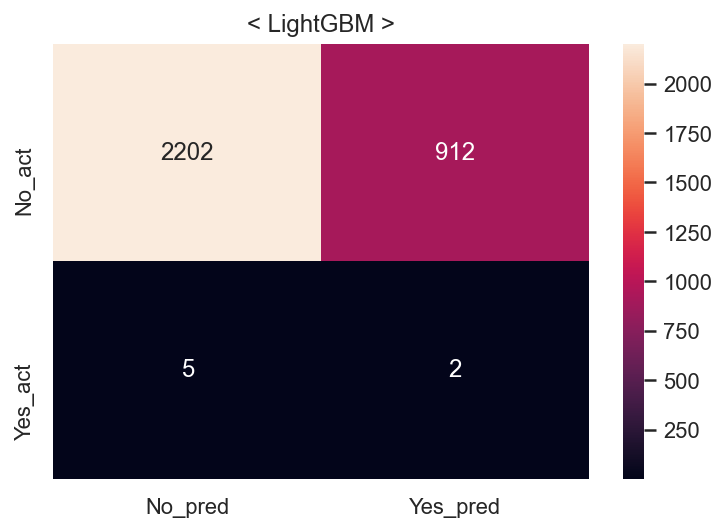

[Pipeline] ............ (step 1 of 2) Processing scaler, total=   0.0s
[Pipeline] ............... (step 2 of 2) Processing clf, total=  57.4s
====Done Evaluation====
====Done Evaluation====


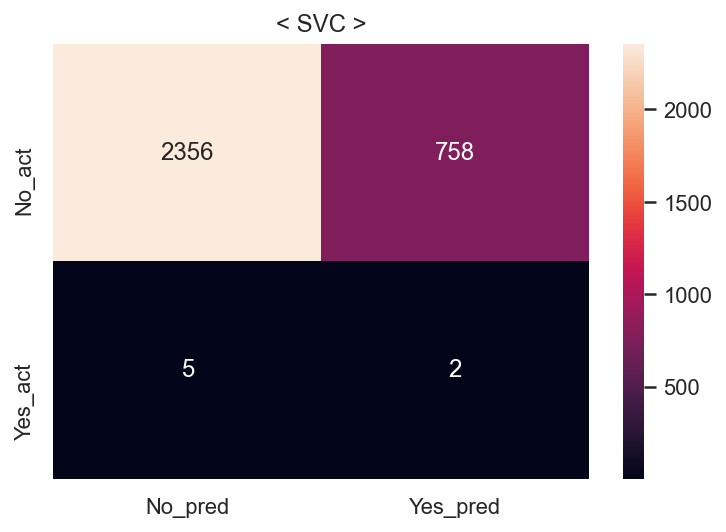

Fit time : 7.46 min


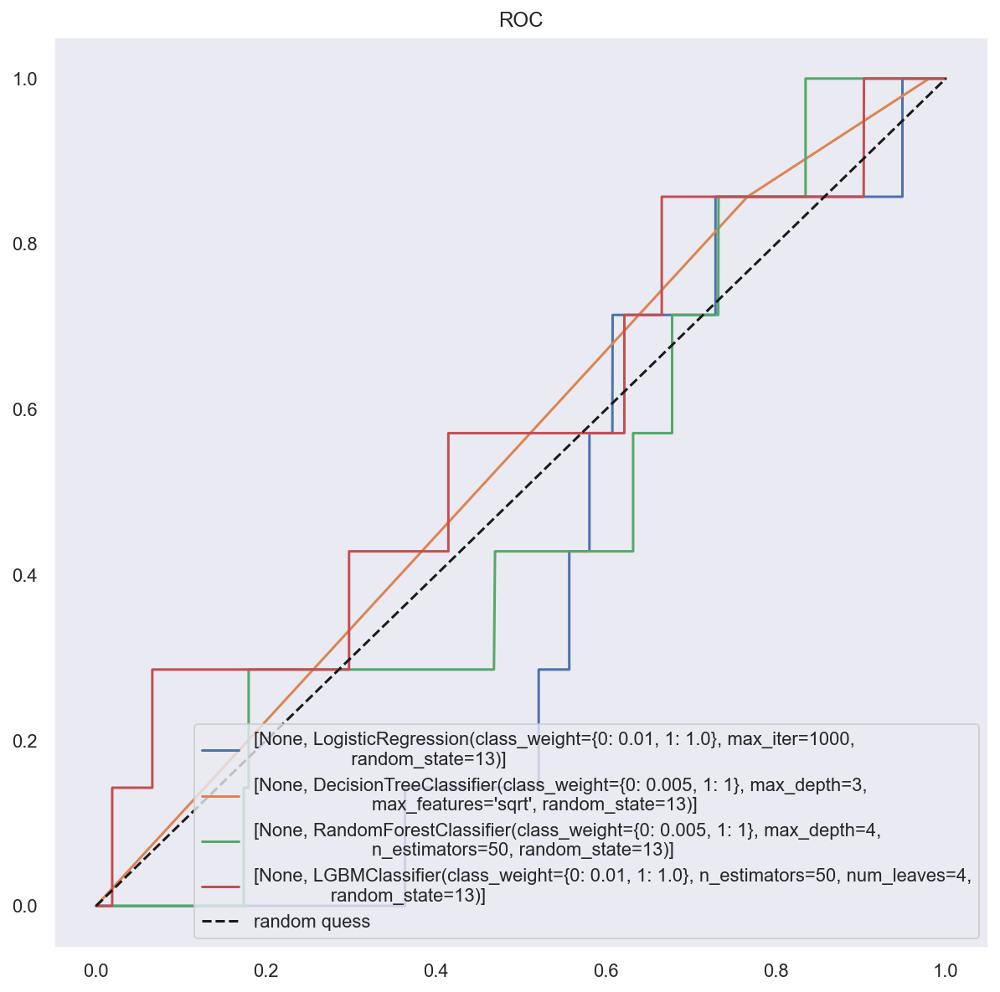

In [49]:
# 1hot
columns_1hot = socar.columns.drop(['c_1', 'c_3', 'c_5', 'c_10', 'c_11', 'c_18', 'c_19', 'c_8', 'c_15', 'c_16', 'c_20', 'c_25'])
socar_strange_1hot = pd.get_dummies(socar, columns=columns_1hot)
# 데이터 분리
X_train, X_test, y_train, y_test = ut.split_train_test(socar_strange_1hot)
# sampling to SMOTE (default)
X_train_over, y_train_over = ut.fit_sampler(X_train, y_train, sampler='ADASYN')
# evaluation
cv_list18, result_df18 = ut.fit_cv(X_train_over, y_train_over, X_test, y_test, scaler='No')

In [50]:
result_df18['class_weight'] = [1] * len(result_df18)
result_df18["null_del"] = [0]  * len(result_df18)
result_df18["encoded"] = [1]  * len(result_df18)
result_df18["scaler"] = ["None"]  * len(result_df18)
result_df18["sampler"] = ["ADASYN"]  * len(result_df18)
result_df18 = result_df18[['class_weight', 'null_del', 'encoded', 'scaler', 'sampler', 'classifier', 'train accuracy', 'train precision',
                             'train recall', 'train f1', 'train auc', 'test accuracy', 'test precision', 'test recall',
                             'test f1', 'test auc']]
result_df18

,class_weight,null_del,encoded,scaler,sampler,classifier,train accuracy,train precision,train recall,train f1,train auc,test accuracy,test precision,test recall,test f1,test auc
0,1,0,1,None,ADASYN,LogisticReg,0.500546,0.500410,1.000000,0.667031,0.500273,0.002563,0.002244,1.000000,0.004477,0.500161
1,1,0,1,None,ADASYN,DecisionTree,0.513426,0.506941,1.000000,0.672808,0.513160,0.021788,0.002288,1.000000,0.004565,0.509794
2,1,0,1,None,ADASYN,RandomForest,0.595621,0.553001,1.000000,0.712170,0.595400,0.179750,0.002339,0.857143,0.004666,0.517685
3,1,0,1,None,ADASYN,LightGBM,0.890563,0.820879,0.999298,0.901344,0.890503,0.706184,0.002188,0.285714,0.004343,0.496422
4,1,0,1,None,ADASYN,SVC,0.606861,0.652449,0.458262,0.538380,0.606943,0.755527,0.002632,0.285714,0.005215,0.521149


## 열아홉번째
### (1) NULL값 유지, (2)데이터 분리, (3) SMOTE, (4) MinMax

==Split Result==
y_train :  [[0, 1], [12804, 34]]
y_test : [[0, 1], [3114, 7]]
==Sampling Result==
y_train :  [[0, 1], [12804, 34]]
y_train_over : [[0, 1], [12804, 12804]]
[Pipeline] ............ (step 1 of 2) Processing scaler, total=   0.0s
[Pipeline] ............... (step 2 of 2) Processing clf, total=   0.2s
====Done Evaluation====
====Done Evaluation====


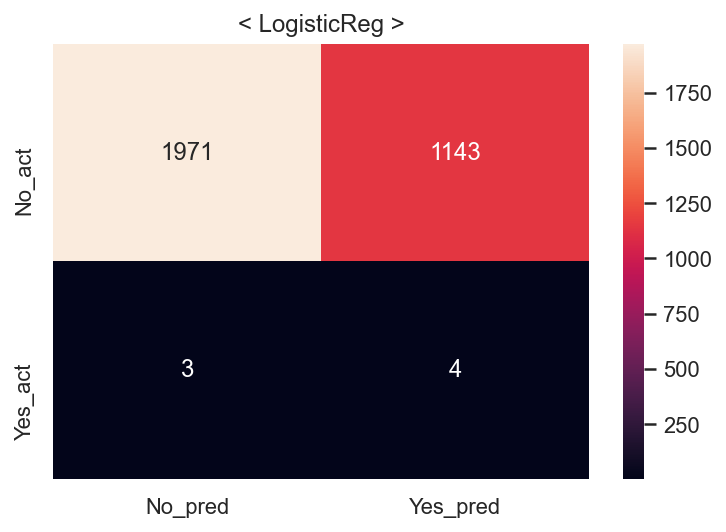

[Pipeline] ............ (step 1 of 2) Processing scaler, total=   0.0s
[Pipeline] ............... (step 2 of 2) Processing clf, total=   0.0s
====Done Evaluation====
====Done Evaluation====


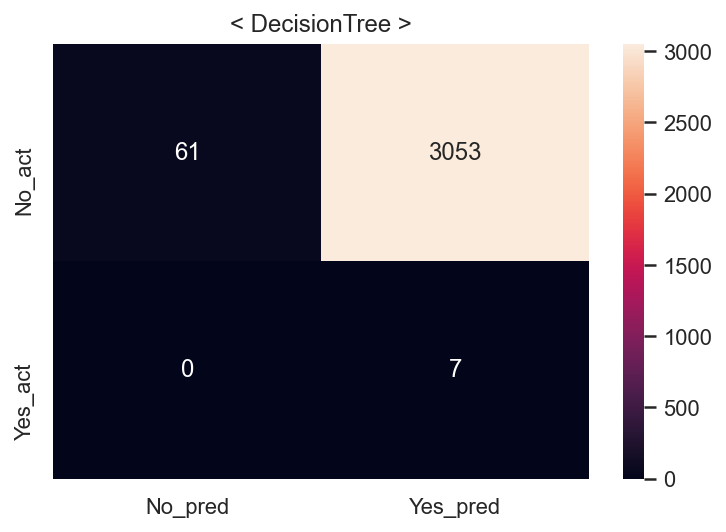

[Pipeline] ............ (step 1 of 2) Processing scaler, total=   0.0s
[Pipeline] ............... (step 2 of 2) Processing clf, total=   0.6s
====Done Evaluation====
====Done Evaluation====


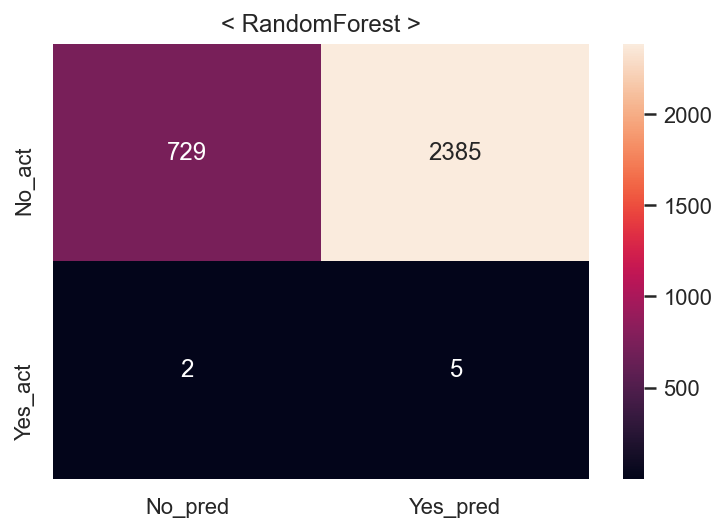

[Pipeline] ............ (step 1 of 2) Processing scaler, total=   0.0s
[Pipeline] ............... (step 2 of 2) Processing clf, total=   0.1s
====Done Evaluation====
====Done Evaluation====


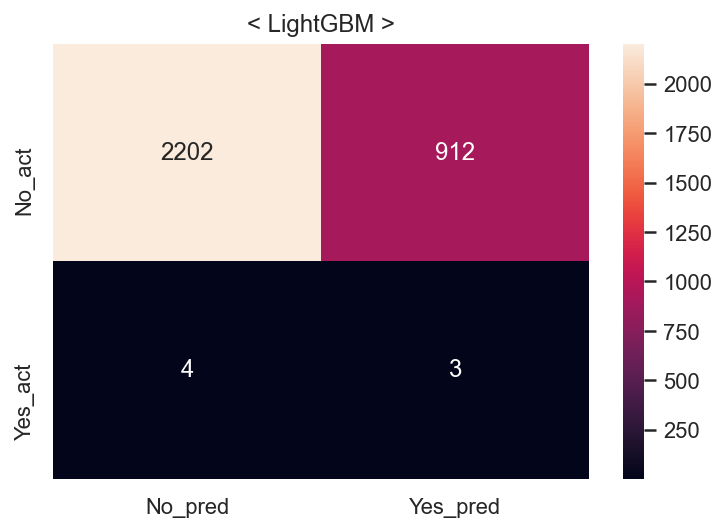

[Pipeline] ............ (step 1 of 2) Processing scaler, total=   0.0s
[Pipeline] ............... (step 2 of 2) Processing clf, total=   1.9s
====Done Evaluation====
====Done Evaluation====


C:\Users\sh\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1245: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


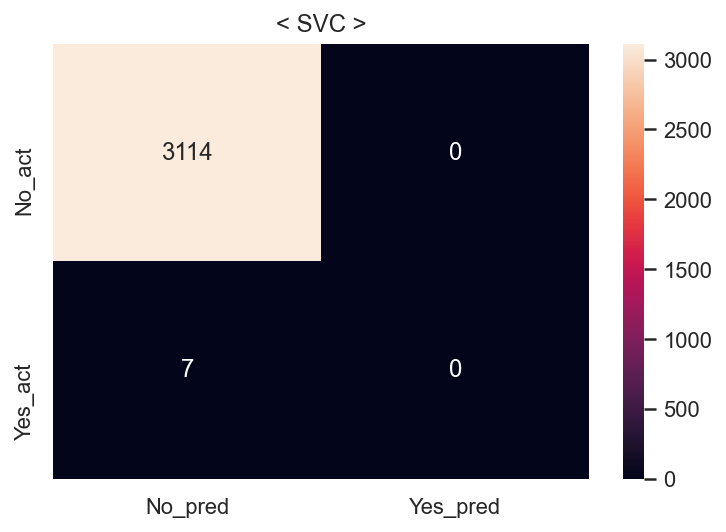

Fit time : 2.32 min


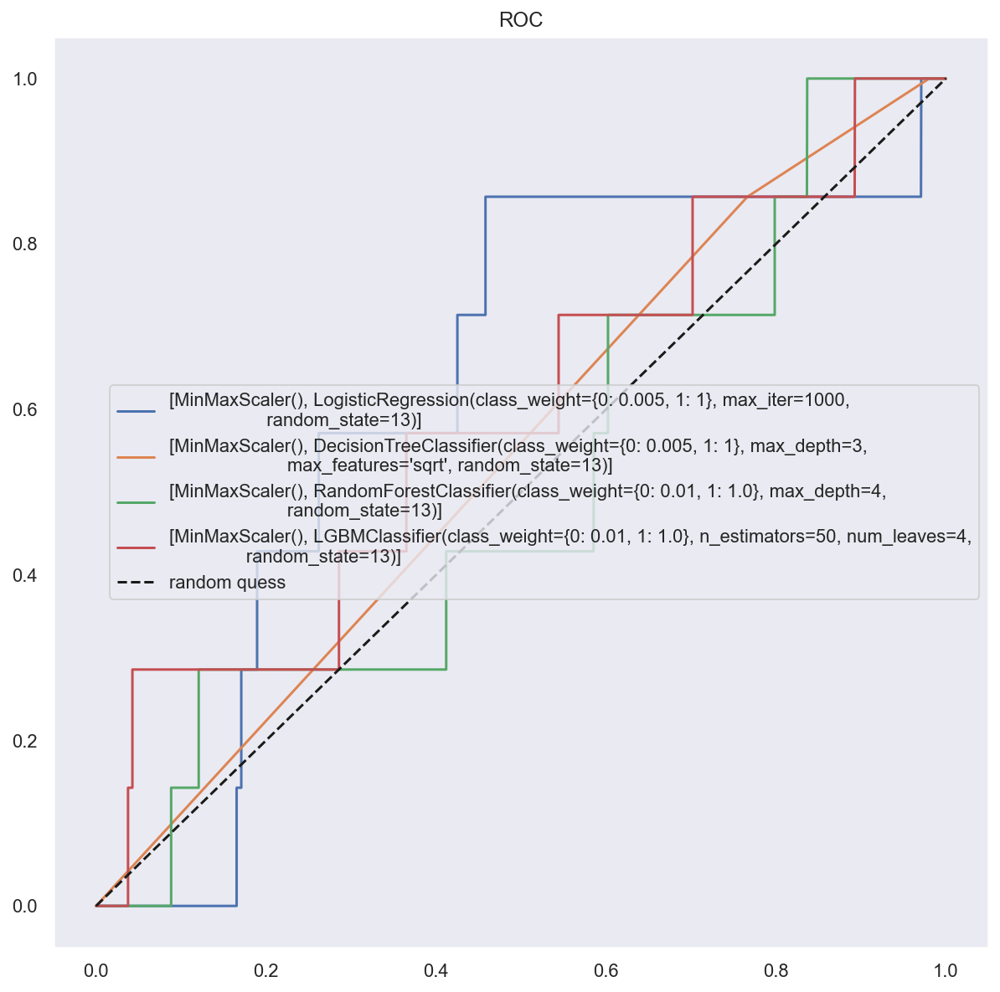

In [51]:
# 1hot
columns_1hot = socar.columns.drop(['c_1', 'c_3', 'c_5', 'c_10', 'c_11', 'c_18', 'c_19', 'c_8', 'c_15', 'c_16', 'c_20', 'c_25'])
socar_strange_1hot = pd.get_dummies(socar, columns=columns_1hot)
# 데이터 분리
X_train, X_test, y_train, y_test = ut.split_train_test(socar_strange_1hot)
# sampling to SMOTE (default)
X_train_over, y_train_over = ut.fit_sampler(X_train, y_train, sampler='SMOTE')
# evaluation
cv_list19, result_df19 = ut.fit_cv(X_train_over, y_train_over, X_test, y_test, scaler='MM')

In [52]:
result_df19['class_weight'] = [1] * len(result_df19)
result_df19["null_del"] = [0]  * len(result_df19)
result_df19["encoded"] = [1]  * len(result_df19)
result_df19["scaler"] = ["MM"]  * len(result_df19)
result_df19["sampler"] = ["SMOTE"]  * len(result_df19)
result_df19 = result_df19[['class_weight', 'null_del', 'encoded', 'scaler', 'sampler', 'classifier', 'train accuracy', 'train precision',
                             'train recall', 'train f1', 'train auc', 'test accuracy', 'test precision', 'test recall',
                             'test f1', 'test auc']]
result_df19

,class_weight,null_del,encoded,scaler,sampler,classifier,train accuracy,train precision,train recall,train f1,train auc,test accuracy,test precision,test recall,test f1,test auc
0,1,0,1,MM,SMOTE,LogisticReg,0.870119,0.794019,0.999531,0.885001,0.870119,0.632810,0.003487,0.571429,0.006932,0.602188
1,1,0,1,MM,SMOTE,DecisionTree,0.513160,0.506668,1.000000,0.672567,0.513160,0.021788,0.002288,1.000000,0.004565,0.509794
2,1,0,1,MM,SMOTE,RandomForest,0.632029,0.576056,1.000000,0.731010,0.632029,0.235181,0.002092,0.714286,0.004172,0.474195
3,1,0,1,MM,SMOTE,LightGBM,0.889722,0.819667,0.999297,0.900612,0.889722,0.706504,0.003279,0.428571,0.006508,0.567850
4,1,0,1,MM,SMOTE,SVC,0.998672,1.000000,0.997345,0.998671,0.998672,0.997757,0.000000,0.000000,0.000000,0.500000


## 스무번째
### (1) NULL값 유지, (2)데이터 분리, (3) ADASYN, (4) MinMax

==Split Result==
y_train :  [[0, 1], [12804, 34]]
y_test : [[0, 1], [3114, 7]]
==Sampling Result==
y_train :  [[0, 1], [12804, 34]]
y_train_over : [[0, 1], [12804, 12818]]
[Pipeline] ............ (step 1 of 2) Processing scaler, total=   0.0s
[Pipeline] ............... (step 2 of 2) Processing clf, total=   0.1s
====Done Evaluation====
====Done Evaluation====


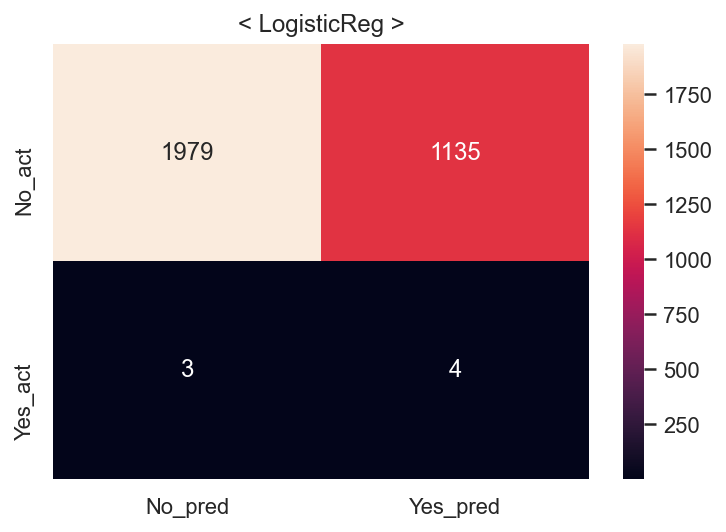

[Pipeline] ............ (step 1 of 2) Processing scaler, total=   0.0s
[Pipeline] ............... (step 2 of 2) Processing clf, total=   0.0s
====Done Evaluation====
====Done Evaluation====


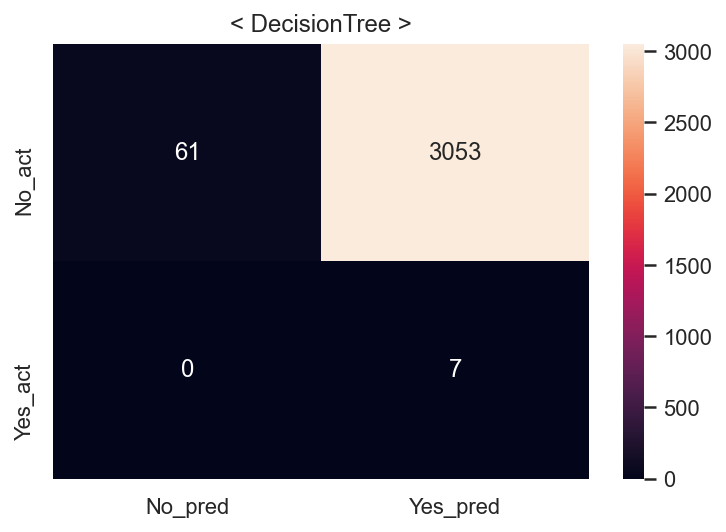

[Pipeline] ............ (step 1 of 2) Processing scaler, total=   0.0s
[Pipeline] ............... (step 2 of 2) Processing clf, total=   0.3s
====Done Evaluation====
====Done Evaluation====


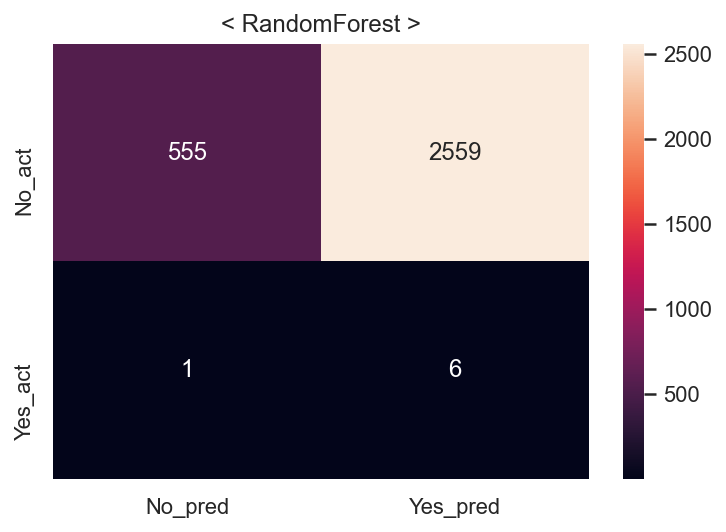

[Pipeline] ............ (step 1 of 2) Processing scaler, total=   0.0s
[Pipeline] ............... (step 2 of 2) Processing clf, total=   0.1s
====Done Evaluation====
====Done Evaluation====


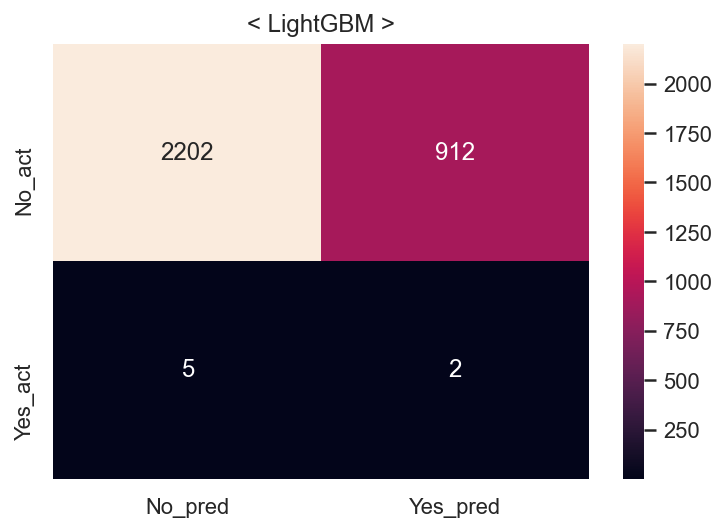

[Pipeline] ............ (step 1 of 2) Processing scaler, total=   0.0s
[Pipeline] ............... (step 2 of 2) Processing clf, total=   1.9s
====Done Evaluation====
====Done Evaluation====


C:\Users\sh\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1245: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


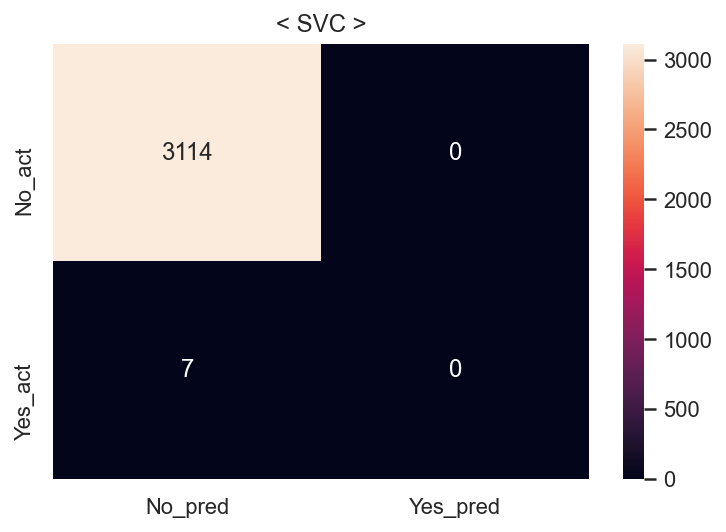

Fit time : 2.27 min


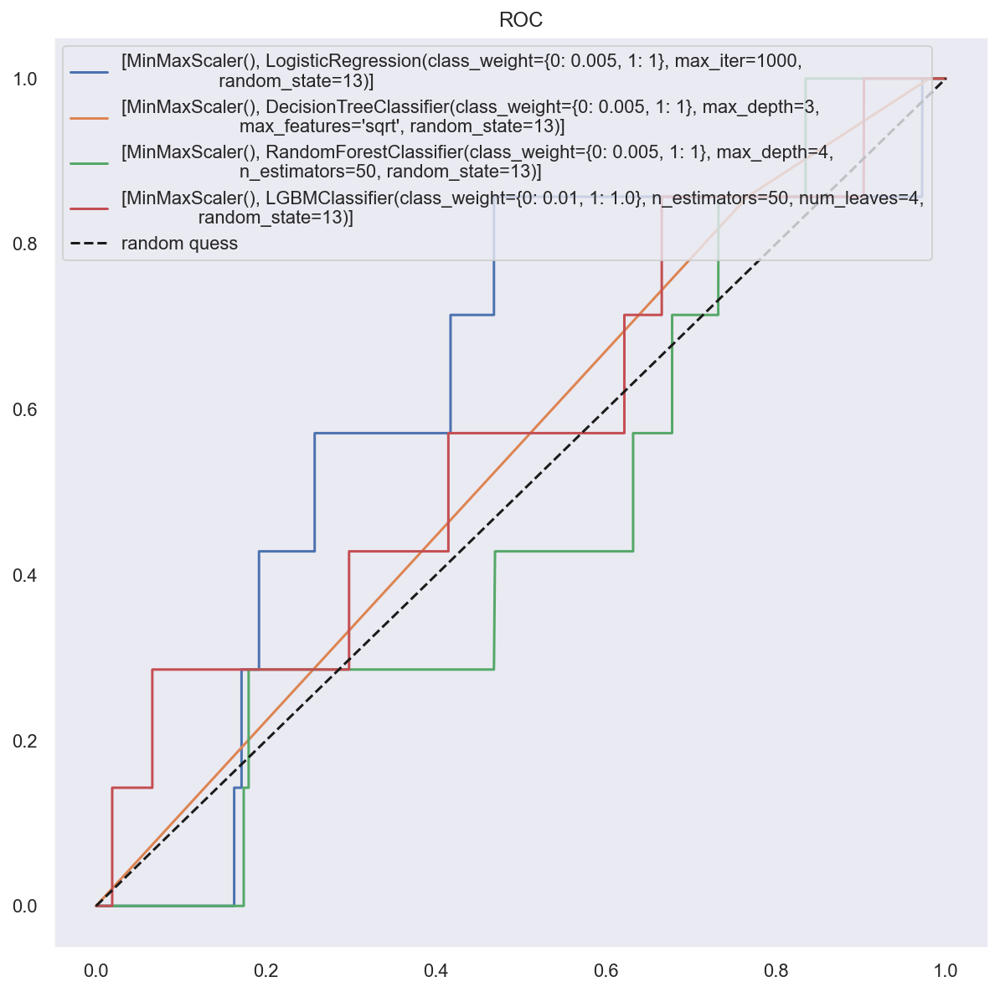

In [53]:
# 1hot
columns_1hot = socar.columns.drop(['c_1', 'c_3', 'c_5', 'c_10', 'c_11', 'c_18', 'c_19', 'c_8', 'c_15', 'c_16', 'c_20', 'c_25'])
socar_strange_1hot = pd.get_dummies(socar, columns=columns_1hot)
# 데이터 분리
X_train, X_test, y_train, y_test = ut.split_train_test(socar_strange_1hot)
# sampling to SMOTE (default)
X_train_over, y_train_over = ut.fit_sampler(X_train, y_train, sampler='ADASYN')
# evaluation
cv_list20, result_df20 = ut.fit_cv(X_train_over, y_train_over, X_test, y_test, scaler='MM')

In [54]:
result_df20['class_weight'] = [1] * len(result_df20)
result_df20["null_del"] = [0]  * len(result_df20)
result_df20["encoded"] = [1]  * len(result_df20)
result_df20["scaler"] = ["MM"]  * len(result_df20)
result_df20["sampler"] = ["ADASYN"]  * len(result_df20)
result_df20 = result_df20[['class_weight', 'null_del', 'encoded', 'scaler', 'sampler', 'classifier', 'train accuracy', 'train precision',
                             'train recall', 'train f1', 'train auc', 'test accuracy', 'test precision', 'test recall',
                             'test f1', 'test auc']]
result_df20

,class_weight,null_del,encoded,scaler,sampler,classifier,train accuracy,train precision,train recall,train f1,train auc,test accuracy,test precision,test recall,test f1,test auc
0,1,0,1,MM,ADASYN,LogisticReg,0.871087,0.795332,0.999532,0.885816,0.871017,0.635373,0.003512,0.571429,0.006981,0.603473
1,1,0,1,MM,ADASYN,DecisionTree,0.513426,0.506941,1.000000,0.672808,0.513160,0.021788,0.002288,1.000000,0.004565,0.509794
2,1,0,1,MM,ADASYN,RandomForest,0.595621,0.553001,1.000000,0.712170,0.595400,0.179750,0.002339,0.857143,0.004666,0.517685
3,1,0,1,MM,ADASYN,LightGBM,0.890563,0.820879,0.999298,0.901344,0.890503,0.706184,0.002188,0.285714,0.004343,0.496422
4,1,0,1,MM,ADASYN,SVC,0.998673,1.000000,0.997347,0.998672,0.998674,0.997757,0.000000,0.000000,0.000000,0.500000


## 스물한번째
### (1) NULL값 유지, (2)데이터 분리, (3) SMOTE, (4) Standard

==Split Result==
y_train :  [[0, 1], [12804, 34]]
y_test : [[0, 1], [3114, 7]]
==Sampling Result==
y_train :  [[0, 1], [12804, 34]]
y_train_over : [[0, 1], [12804, 12804]]
[Pipeline] ............ (step 1 of 2) Processing scaler, total=   0.0s
[Pipeline] ............... (step 2 of 2) Processing clf, total=   0.2s
====Done Evaluation====
====Done Evaluation====


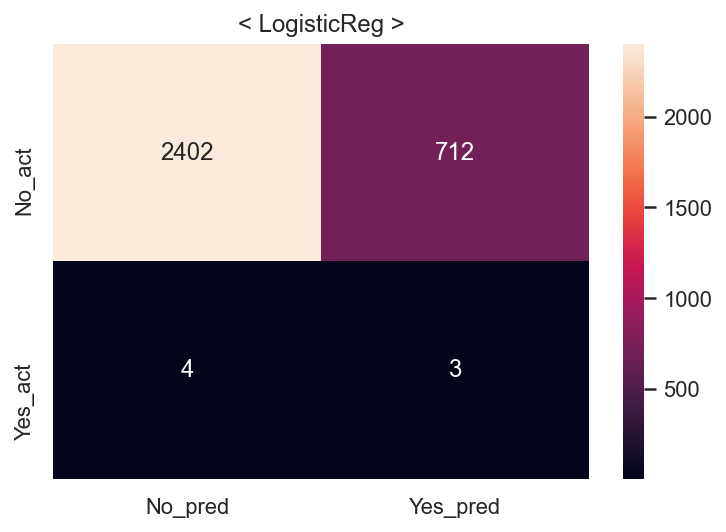

[Pipeline] ............ (step 1 of 2) Processing scaler, total=   0.0s
[Pipeline] ............... (step 2 of 2) Processing clf, total=   0.0s
====Done Evaluation====
====Done Evaluation====


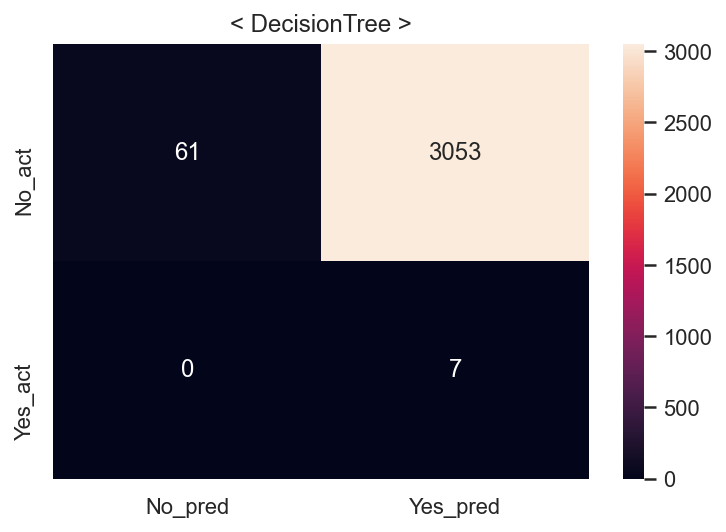

[Pipeline] ............ (step 1 of 2) Processing scaler, total=   0.0s
[Pipeline] ............... (step 2 of 2) Processing clf, total=   0.6s
====Done Evaluation====
====Done Evaluation====


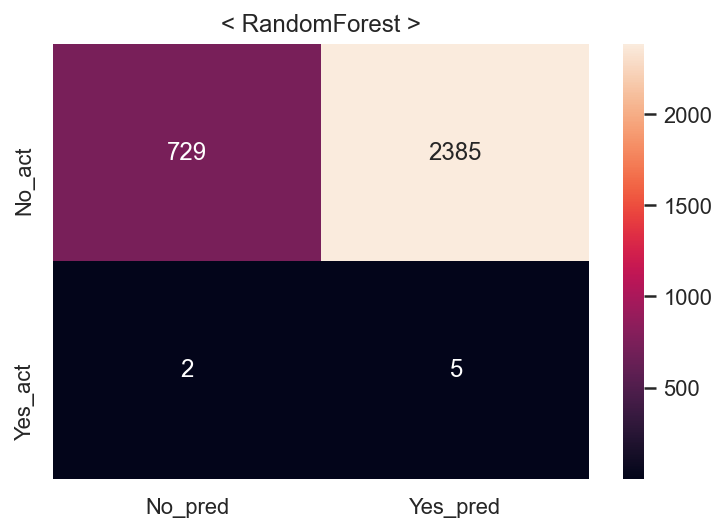

[Pipeline] ............ (step 1 of 2) Processing scaler, total=   0.0s
[Pipeline] ............... (step 2 of 2) Processing clf, total=   0.2s
====Done Evaluation====
====Done Evaluation====


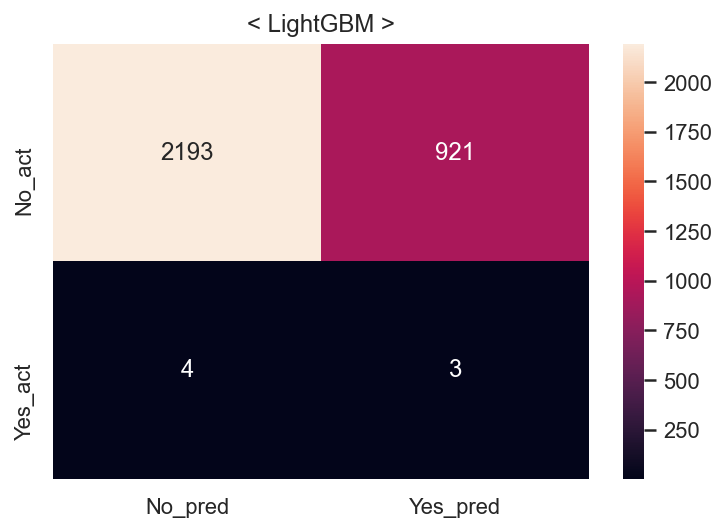

[Pipeline] ............ (step 1 of 2) Processing scaler, total=   0.0s
[Pipeline] ............... (step 2 of 2) Processing clf, total=   1.9s
====Done Evaluation====
====Done Evaluation====


C:\Users\sh\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1245: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


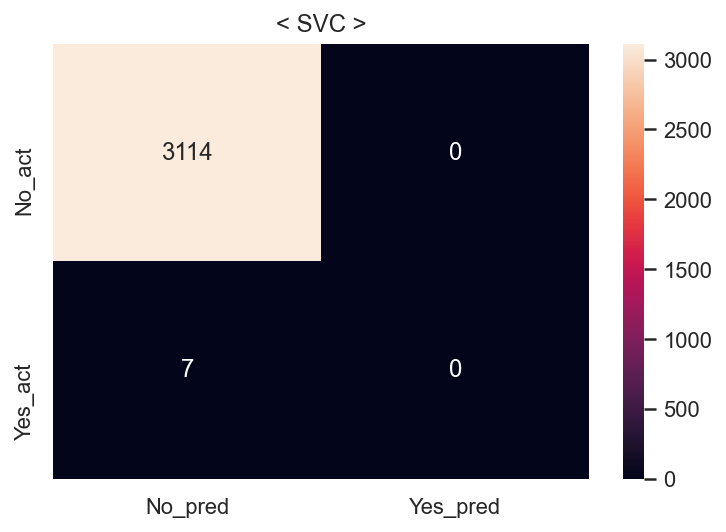

Fit time : 2.53 min


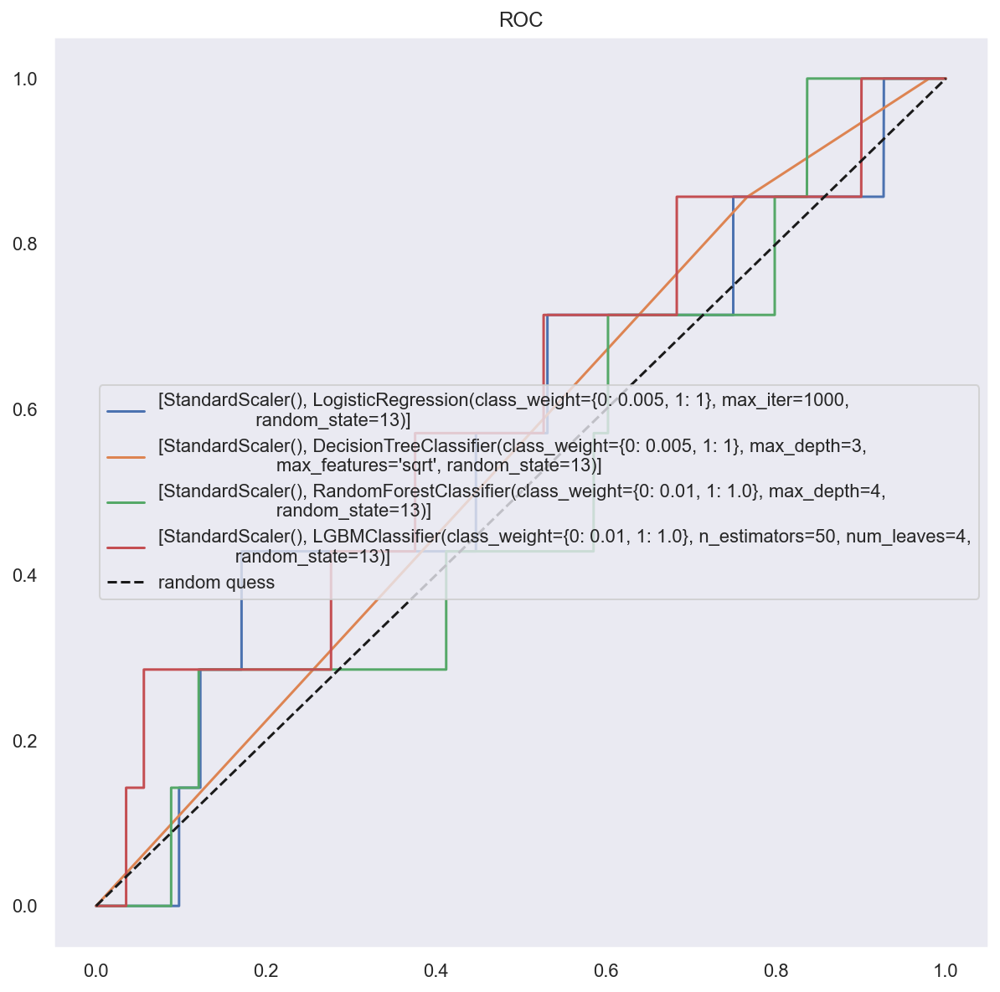

In [55]:
# 1hot
columns_1hot = socar.columns.drop(['c_1', 'c_3', 'c_5', 'c_10', 'c_11', 'c_18', 'c_19', 'c_8', 'c_15', 'c_16', 'c_20', 'c_25'])
socar_strange_1hot = pd.get_dummies(socar, columns=columns_1hot)
# 데이터 분리
X_train, X_test, y_train, y_test = ut.split_train_test(socar_strange_1hot)
# sampling to SMOTE (default)
X_train_over, y_train_over = ut.fit_sampler(X_train, y_train, sampler='SMOTE')
# evaluation
cv_list21, result_df21 = ut.fit_cv(X_train_over, y_train_over, X_test, y_test, scaler='SD')

In [56]:
result_df21['class_weight'] = [1] * len(result_df21)
result_df21["null_del"] = [0]  * len(result_df21)
result_df21["encoded"] = [1]  * len(result_df21)
result_df21["scaler"] = ["SD"]  * len(result_df21)
result_df21["sampler"] = ["SMOTE"]  * len(result_df21)
result_df21 = result_df21[['class_weight', 'null_del', 'encoded', 'scaler', 'sampler', 'classifier', 'train accuracy', 'train precision',
                             'train recall', 'train f1', 'train auc', 'test accuracy', 'test precision', 'test recall',
                             'test f1', 'test auc']]
result_df21

,class_weight,null_del,encoded,scaler,sampler,classifier,train accuracy,train precision,train recall,train f1,train auc,test accuracy,test precision,test recall,test f1,test auc
0,1,0,1,SD,SMOTE,LogisticReg,0.925492,0.870663,0.999453,0.930623,0.925492,0.770586,0.004196,0.428571,0.008310,0.599963
1,1,0,1,SD,SMOTE,DecisionTree,0.513160,0.506668,1.000000,0.672567,0.513160,0.021788,0.002288,1.000000,0.004565,0.509794
2,1,0,1,SD,SMOTE,RandomForest,0.632029,0.576056,1.000000,0.731010,0.632029,0.235181,0.002092,0.714286,0.004172,0.474195
3,1,0,1,SD,SMOTE,LightGBM,0.889566,0.819457,0.999297,0.900486,0.889566,0.703621,0.003247,0.428571,0.006445,0.566405
4,1,0,1,SD,SMOTE,SVC,0.998672,1.000000,0.997345,0.998671,0.998672,0.997757,0.000000,0.000000,0.000000,0.500000


## 스물두번째
### (1) NULL값 유지, (2)데이터 분리, (3) ADASYN, (4) Standard

==Split Result==
y_train :  [[0, 1], [12804, 34]]
y_test : [[0, 1], [3114, 7]]
==Sampling Result==
y_train :  [[0, 1], [12804, 34]]
y_train_over : [[0, 1], [12804, 12818]]
[Pipeline] ............ (step 1 of 2) Processing scaler, total=   0.0s
[Pipeline] ............... (step 2 of 2) Processing clf, total=   0.1s
====Done Evaluation====
====Done Evaluation====


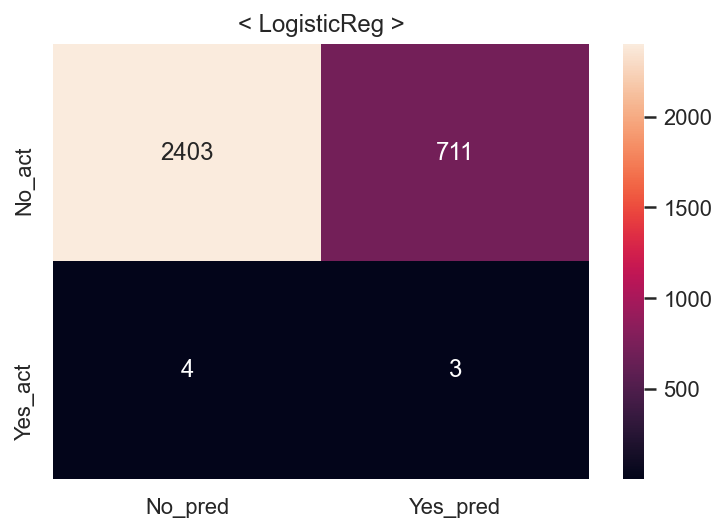

[Pipeline] ............ (step 1 of 2) Processing scaler, total=   0.0s
[Pipeline] ............... (step 2 of 2) Processing clf, total=   0.0s
====Done Evaluation====
====Done Evaluation====


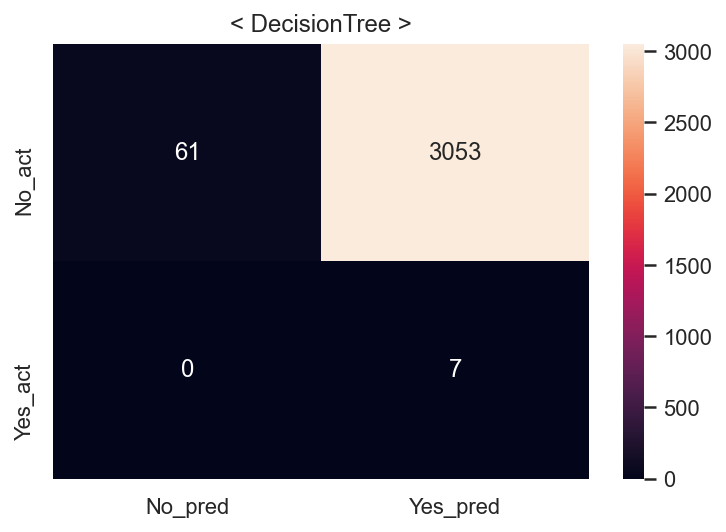

[Pipeline] ............ (step 1 of 2) Processing scaler, total=   0.0s
[Pipeline] ............... (step 2 of 2) Processing clf, total=   0.3s
====Done Evaluation====
====Done Evaluation====


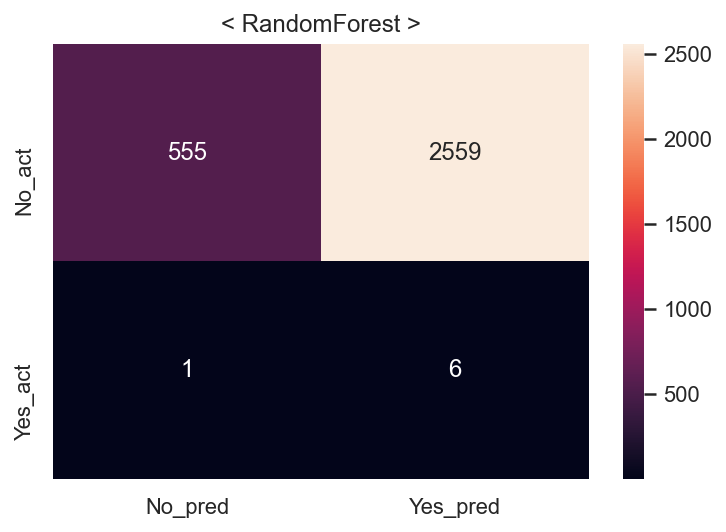

[Pipeline] ............ (step 1 of 2) Processing scaler, total=   0.0s
[Pipeline] ............... (step 2 of 2) Processing clf, total=   0.2s
====Done Evaluation====
====Done Evaluation====


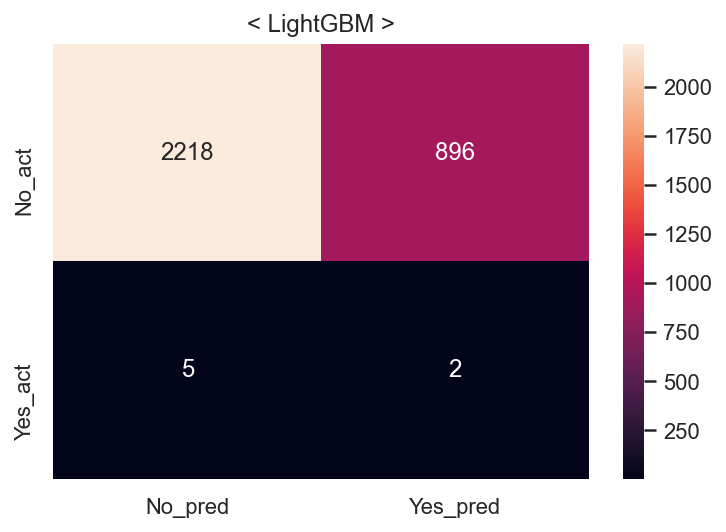

[Pipeline] ............ (step 1 of 2) Processing scaler, total=   0.0s
[Pipeline] ............... (step 2 of 2) Processing clf, total=   1.9s
====Done Evaluation====
====Done Evaluation====


C:\Users\sh\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1245: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


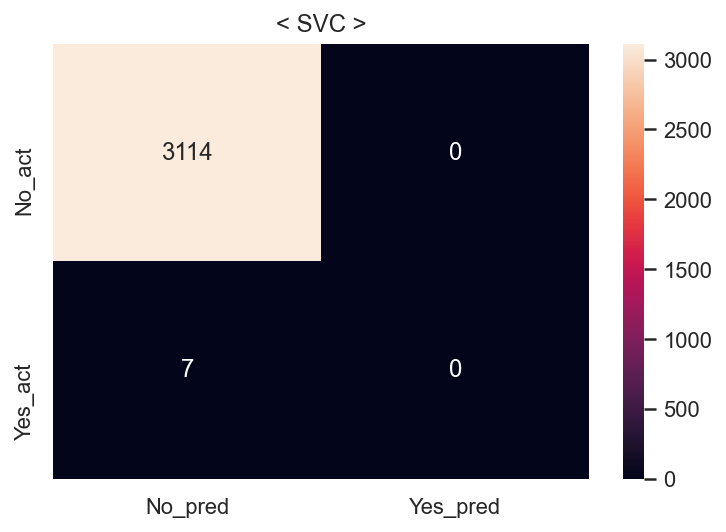

Fit time : 2.44 min


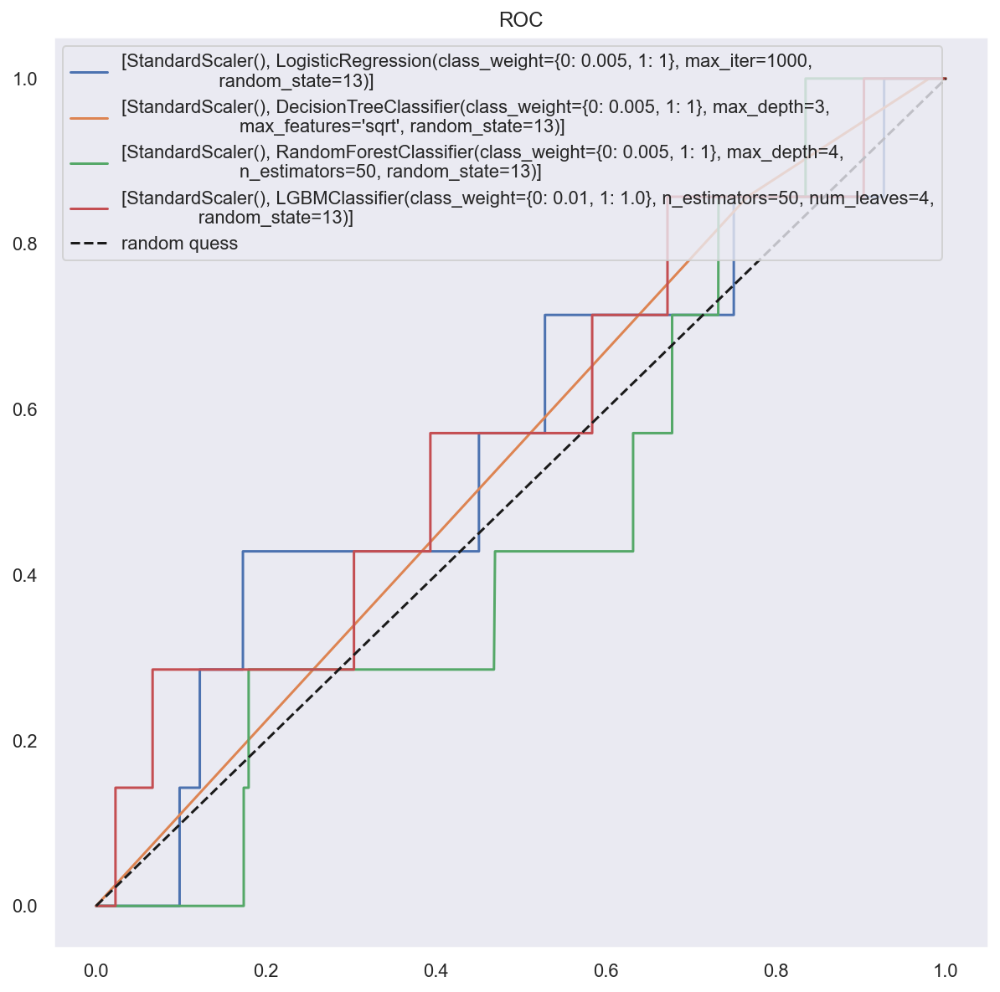

In [57]:
# 1hot
columns_1hot = socar.columns.drop(['c_1', 'c_3', 'c_5', 'c_10', 'c_11', 'c_18', 'c_19', 'c_8', 'c_15', 'c_16', 'c_20', 'c_25'])
socar_strange_1hot = pd.get_dummies(socar, columns=columns_1hot)
# 데이터 분리
X_train, X_test, y_train, y_test = ut.split_train_test(socar_strange_1hot)
# sampling to SMOTE (default)
X_train_over, y_train_over = ut.fit_sampler(X_train, y_train, sampler='ADASYN')
# evaluation
cv_list22, result_df22 = ut.fit_cv(X_train_over, y_train_over, X_test, y_test, scaler='SD')

In [58]:
result_df22['class_weight'] = [1] * len(result_df22)
result_df22["null_del"] = [0]  * len(result_df22)
result_df22["encoded"] = [1]  * len(result_df22)
result_df22["scaler"] = ["SD"]  * len(result_df22)
result_df22["sampler"] = ["ADASYN"]  * len(result_df22)
result_df22 = result_df22[['class_weight', 'null_del', 'encoded', 'scaler', 'sampler', 'classifier', 'train accuracy', 'train precision',
                             'train recall', 'train f1', 'train auc', 'test accuracy', 'test precision', 'test recall',
                             'test f1', 'test auc']]
result_df22

,class_weight,null_del,encoded,scaler,sampler,classifier,train accuracy,train precision,train recall,train f1,train auc,test accuracy,test precision,test recall,test f1,test auc
0,1,0,1,SD,ADASYN,LogisticReg,0.925611,0.870904,0.999454,0.930761,0.925570,0.770907,0.004202,0.428571,0.008322,0.600124
1,1,0,1,SD,ADASYN,DecisionTree,0.513426,0.506941,1.000000,0.672808,0.513160,0.021788,0.002288,1.000000,0.004565,0.509794
2,1,0,1,SD,ADASYN,RandomForest,0.595621,0.553001,1.000000,0.712170,0.595400,0.179750,0.002339,0.857143,0.004666,0.517685
3,1,0,1,SD,ADASYN,LightGBM,0.890875,0.821342,0.999220,0.901591,0.890816,0.711310,0.002227,0.285714,0.004420,0.498991
4,1,0,1,SD,ADASYN,SVC,0.998673,1.000000,0.997347,0.998672,0.998674,0.997757,0.000000,0.000000,0.000000,0.500000


## 스물세번째
### (1) NULL값 유지, (2)데이터 분리, (3) SMOTE, (4) Robust

==Split Result==
y_train :  [[0, 1], [12804, 34]]
y_test : [[0, 1], [3114, 7]]
==Sampling Result==
y_train :  [[0, 1], [12804, 34]]
y_train_over : [[0, 1], [12804, 12804]]
[Pipeline] ............ (step 1 of 2) Processing scaler, total=   0.0s
[Pipeline] ............... (step 2 of 2) Processing clf, total=   0.4s
====Done Evaluation====
====Done Evaluation====


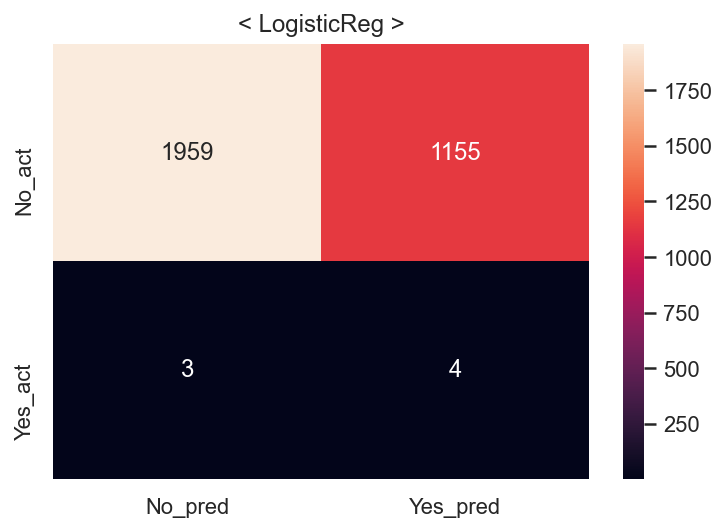

[Pipeline] ............ (step 1 of 2) Processing scaler, total=   0.0s
[Pipeline] ............... (step 2 of 2) Processing clf, total=   0.0s
====Done Evaluation====
====Done Evaluation====


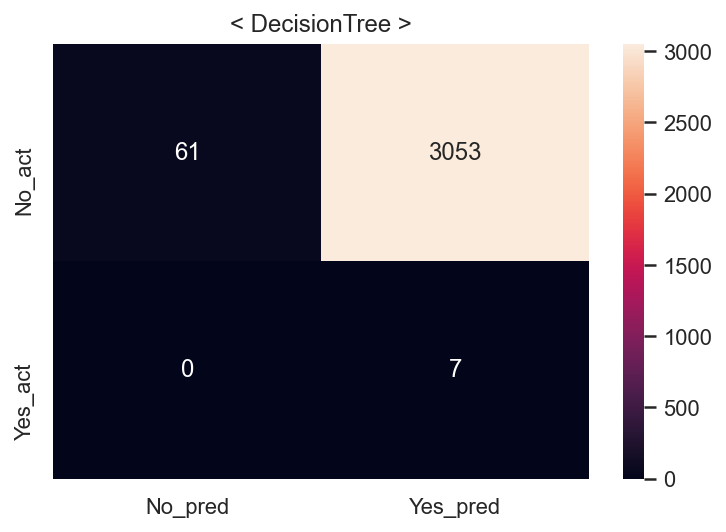

[Pipeline] ............ (step 1 of 2) Processing scaler, total=   0.0s
[Pipeline] ............... (step 2 of 2) Processing clf, total=   0.7s
====Done Evaluation====
====Done Evaluation====


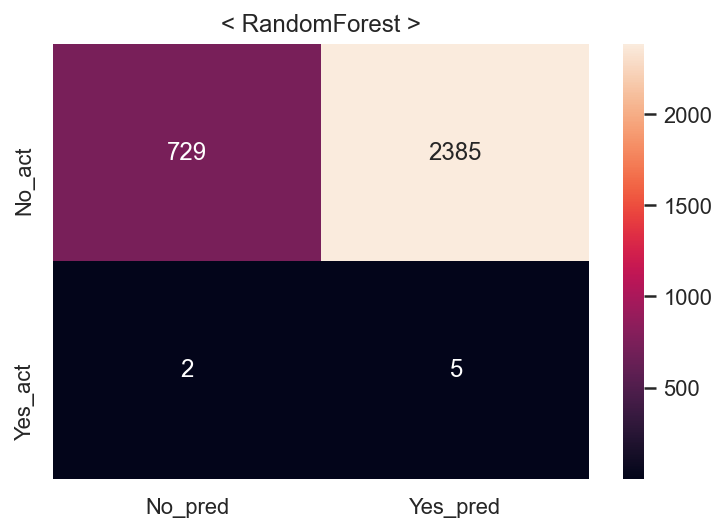

[Pipeline] ............ (step 1 of 2) Processing scaler, total=   0.0s
[Pipeline] ............... (step 2 of 2) Processing clf, total=   0.1s
====Done Evaluation====
====Done Evaluation====


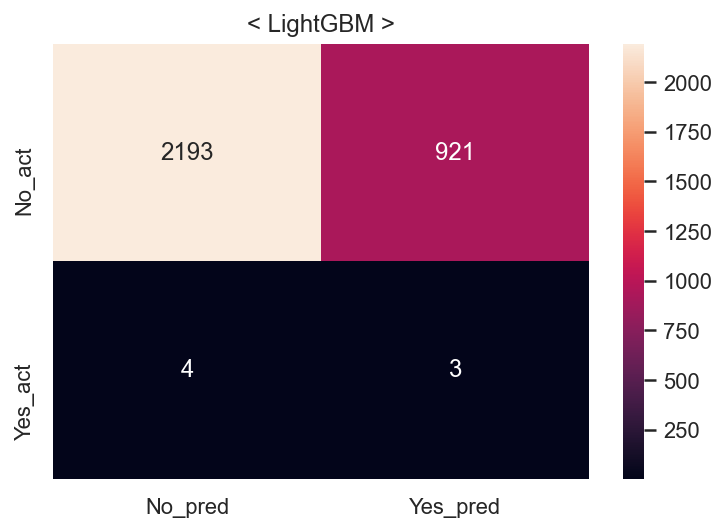

[Pipeline] ............ (step 1 of 2) Processing scaler, total=   0.0s
[Pipeline] ............... (step 2 of 2) Processing clf, total=   6.8s
====Done Evaluation====
====Done Evaluation====


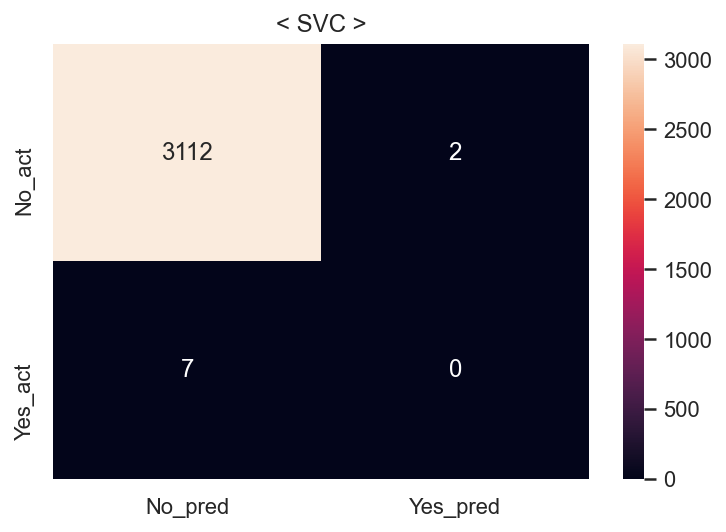

Fit time : 3.66 min


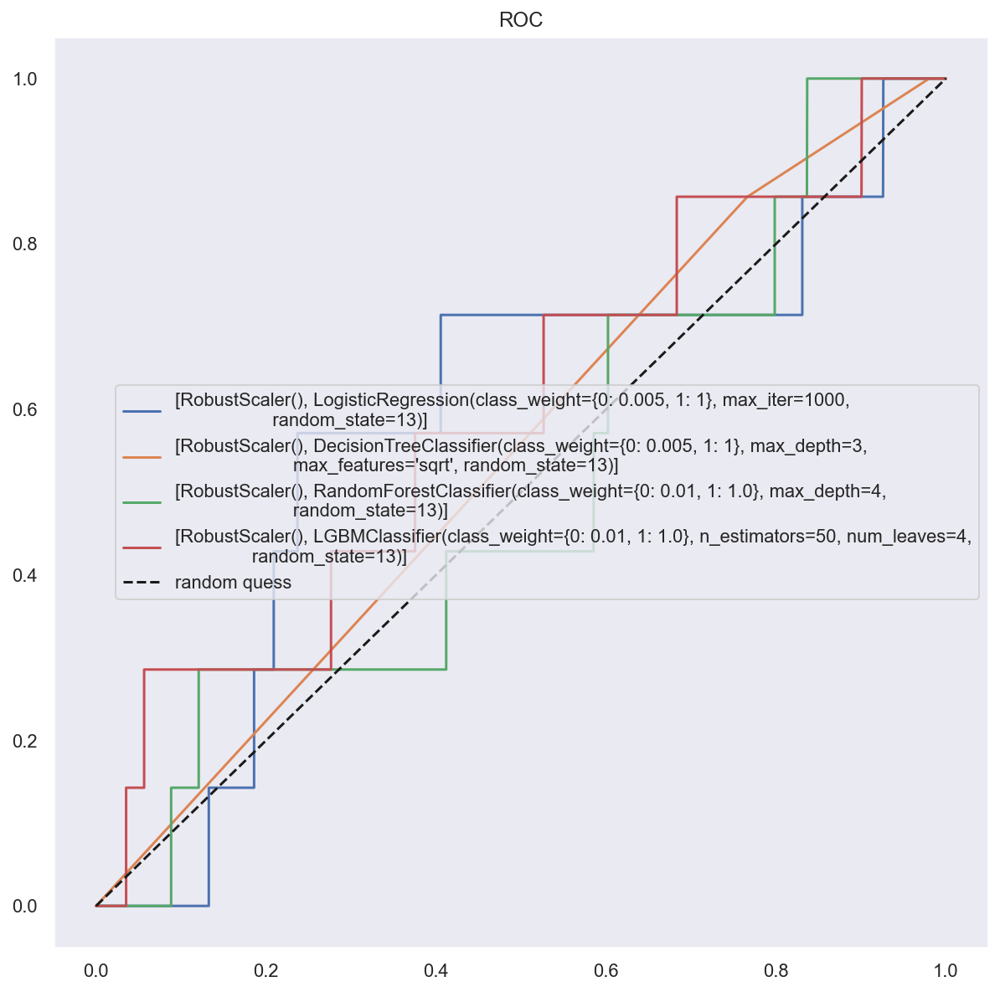

In [59]:
# 1hot
columns_1hot = socar.columns.drop(['c_1', 'c_3', 'c_5', 'c_10', 'c_11', 'c_18', 'c_19', 'c_8', 'c_15', 'c_16', 'c_20', 'c_25'])
socar_strange_1hot = pd.get_dummies(socar, columns=columns_1hot)
# 데이터 분리
X_train, X_test, y_train, y_test = ut.split_train_test(socar_strange_1hot)
# sampling to SMOTE (default)
X_train_over, y_train_over = ut.fit_sampler(X_train, y_train, sampler='SMOTE')
# evaluation
cv_list23, result_df23 = ut.fit_cv(X_train_over, y_train_over, X_test, y_test, scaler='RB')

In [60]:
result_df23['class_weight'] = [1] * len(result_df23)
result_df23["null_del"] = [0]  * len(result_df23)
result_df23["encoded"] = [1]  * len(result_df23)
result_df23["scaler"] = ["RB"]  * len(result_df23)
result_df23["sampler"] = ["SMOTE"]  * len(result_df23)
result_df23 = result_df23[['class_weight', 'null_del', 'encoded', 'scaler', 'sampler', 'classifier', 'train accuracy', 'train precision',
                             'train recall', 'train f1', 'train auc', 'test accuracy', 'test precision', 'test recall',
                             'test f1', 'test auc']]
result_df23

,class_weight,null_del,encoded,scaler,sampler,classifier,train accuracy,train precision,train recall,train f1,train auc,test accuracy,test precision,test recall,test f1,test auc
0,1,0,1,RB,SMOTE,LogisticReg,0.870119,0.793983,0.999609,0.885009,0.870119,0.628965,0.003451,0.571429,0.006861,0.600261
1,1,0,1,RB,SMOTE,DecisionTree,0.513160,0.506668,1.000000,0.672567,0.513160,0.021788,0.002288,1.000000,0.004565,0.509794
2,1,0,1,RB,SMOTE,RandomForest,0.632029,0.576056,1.000000,0.731010,0.632029,0.235181,0.002092,0.714286,0.004172,0.474195
3,1,0,1,RB,SMOTE,LightGBM,0.889605,0.819509,0.999297,0.900517,0.889605,0.703621,0.003247,0.428571,0.006445,0.566405
4,1,0,1,RB,SMOTE,SVC,0.998516,0.999609,0.997423,0.998514,0.998516,0.997116,0.000000,0.000000,0.000000,0.499679


## 스물네번째
### (1) NULL값 유지, (2)데이터 분리, (3) ADASYN, (4) Robust

==Split Result==
y_train :  [[0, 1], [12804, 34]]
y_test : [[0, 1], [3114, 7]]
==Sampling Result==
y_train :  [[0, 1], [12804, 34]]
y_train_over : [[0, 1], [12804, 12818]]
[Pipeline] ............ (step 1 of 2) Processing scaler, total=   0.0s
[Pipeline] ............... (step 2 of 2) Processing clf, total=   0.3s
====Done Evaluation====
====Done Evaluation====


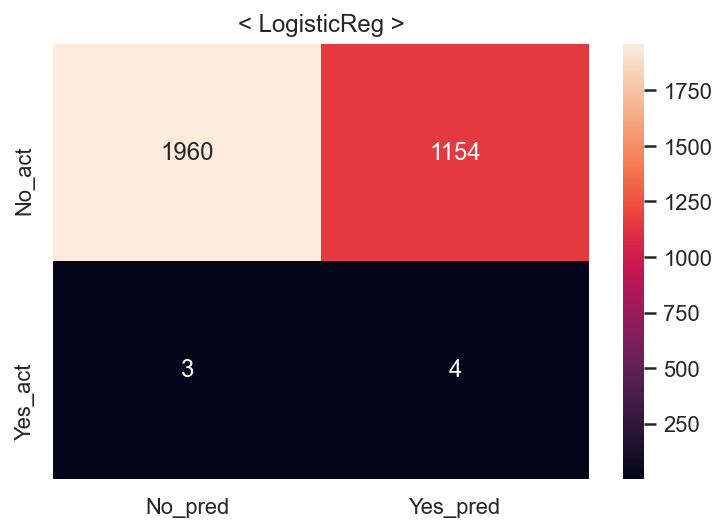

[Pipeline] ............ (step 1 of 2) Processing scaler, total=   0.0s
[Pipeline] ............... (step 2 of 2) Processing clf, total=   0.0s
====Done Evaluation====
====Done Evaluation====


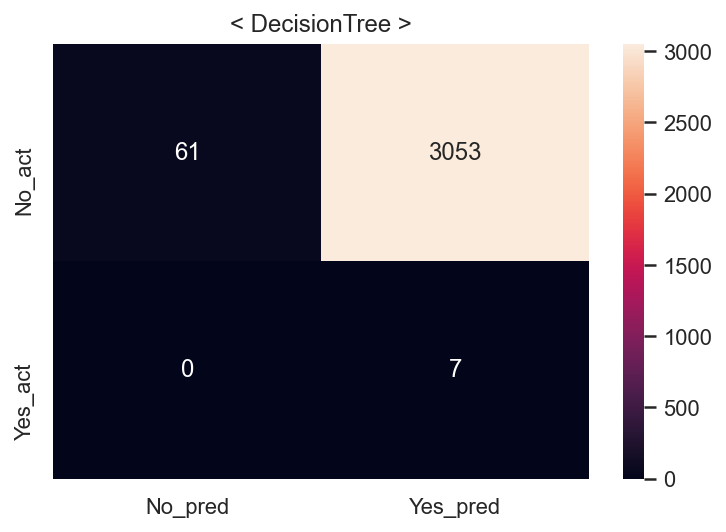

[Pipeline] ............ (step 1 of 2) Processing scaler, total=   0.0s
[Pipeline] ............... (step 2 of 2) Processing clf, total=   0.3s
====Done Evaluation====
====Done Evaluation====


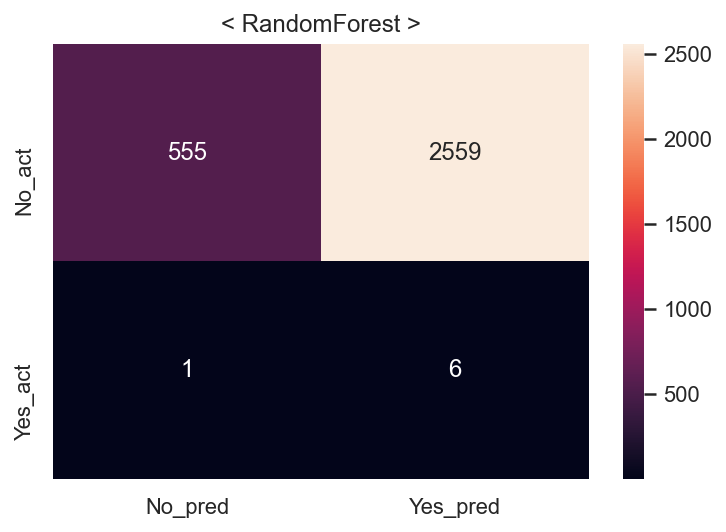

[Pipeline] ............ (step 1 of 2) Processing scaler, total=   0.0s
[Pipeline] ............... (step 2 of 2) Processing clf, total=   0.1s
====Done Evaluation====
====Done Evaluation====


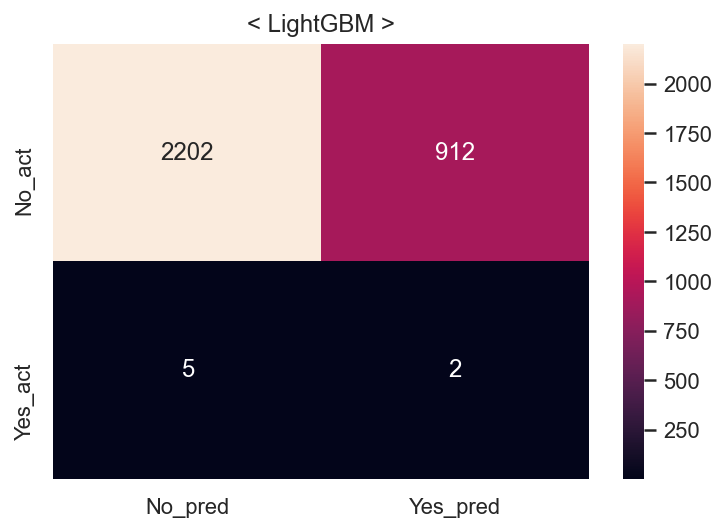

[Pipeline] ............ (step 1 of 2) Processing scaler, total=   0.0s
[Pipeline] ............... (step 2 of 2) Processing clf, total=   7.6s
====Done Evaluation====
====Done Evaluation====


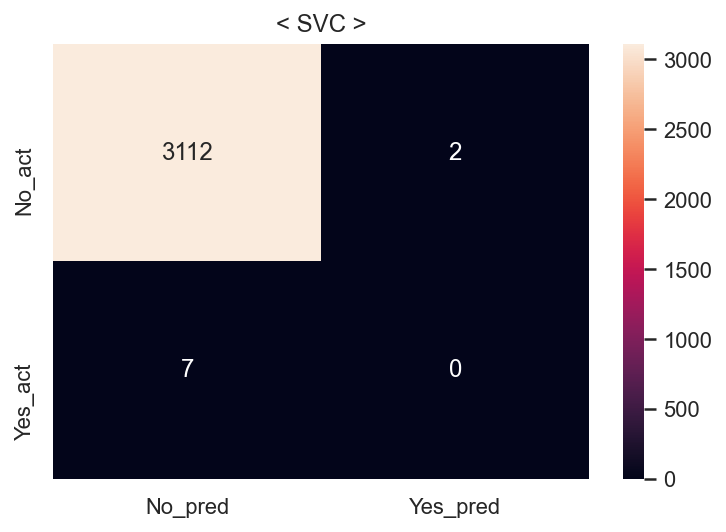

Fit time : 3.62 min


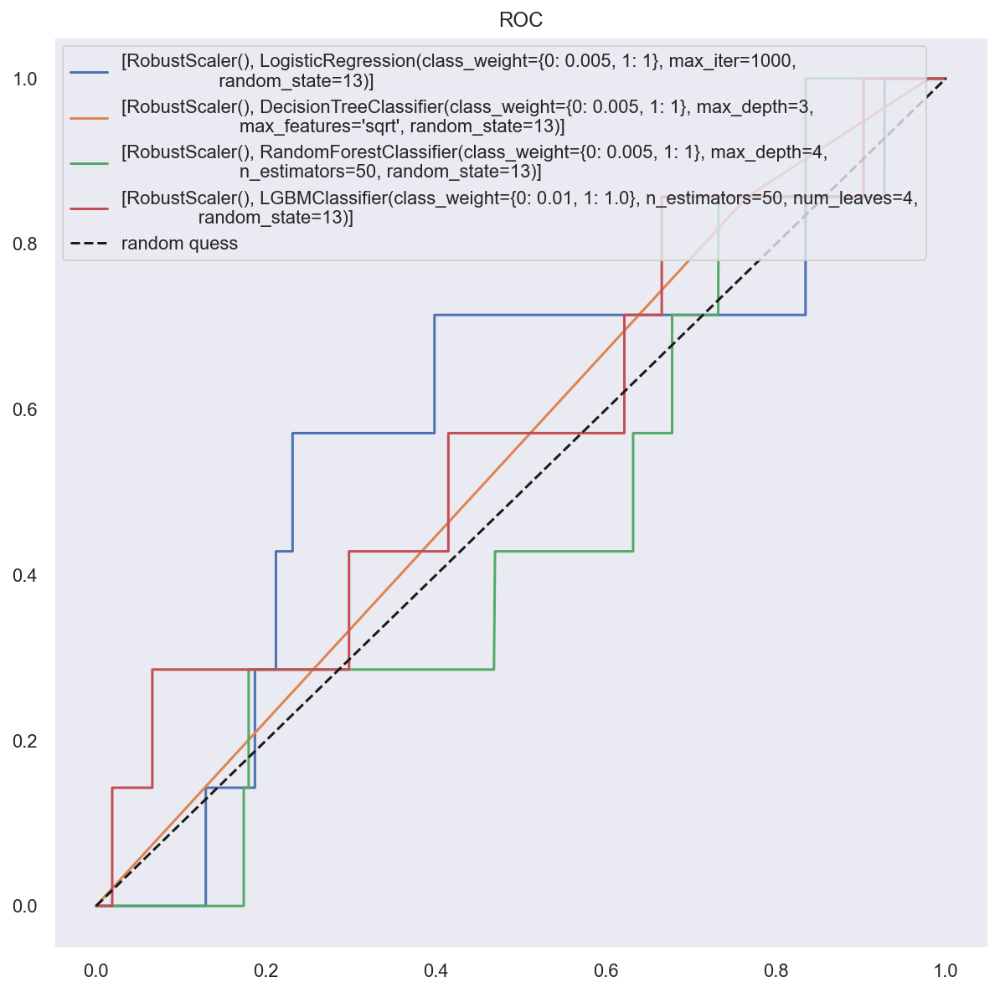

In [61]:
# 1hot
columns_1hot = socar.columns.drop(['c_1', 'c_3', 'c_5', 'c_10', 'c_11', 'c_18', 'c_19', 'c_8', 'c_15', 'c_16', 'c_20', 'c_25'])
socar_strange_1hot = pd.get_dummies(socar, columns=columns_1hot)
# 데이터 분리
X_train, X_test, y_train, y_test = ut.split_train_test(socar_strange_1hot)
# sampling to SMOTE (default)
X_train_over, y_train_over = ut.fit_sampler(X_train, y_train, sampler='ADASYN')
# evaluation
cv_list24, result_df24 = ut.fit_cv(X_train_over, y_train_over, X_test, y_test, scaler='RB')

In [62]:
result_df24['class_weight'] = [1] * len(result_df24)
result_df24["null_del"] = [0]  * len(result_df24)
result_df24["encoded"] = [1]  * len(result_df24)
result_df24["scaler"] = ["RB"]  * len(result_df24)
result_df24["sampler"] = ["ADASYN"]  * len(result_df24)
result_df24 = result_df24[['class_weight', 'null_del', 'encoded', 'scaler', 'sampler', 'classifier', 'train accuracy', 'train precision',
                             'train recall', 'train f1', 'train auc', 'test accuracy', 'test precision', 'test recall',
                             'test f1', 'test auc']]
result_df24

,class_weight,null_del,encoded,scaler,sampler,classifier,train accuracy,train precision,train recall,train f1,train auc,test accuracy,test precision,test recall,test f1,test auc
0,1,0,1,RB,ADASYN,LogisticReg,0.871087,0.795295,0.999610,0.885824,0.871017,0.629285,0.003454,0.571429,0.006867,0.600422
1,1,0,1,RB,ADASYN,DecisionTree,0.513426,0.506941,1.000000,0.672808,0.513160,0.021788,0.002288,1.000000,0.004565,0.509794
2,1,0,1,RB,ADASYN,RandomForest,0.595621,0.553001,1.000000,0.712170,0.595400,0.179750,0.002339,0.857143,0.004666,0.517685
3,1,0,1,RB,ADASYN,LightGBM,0.890641,0.820984,0.999298,0.901407,0.890581,0.706184,0.002188,0.285714,0.004343,0.496422
4,1,0,1,RB,ADASYN,SVC,0.998517,0.999609,0.997425,0.998516,0.998517,0.997116,0.000000,0.000000,0.000000,0.499679


## 스물다섯번째
### (1) NULL값 삭제, (2)데이터 분리, (3) SMOTE, (4) 스케일링 없음

==Split Result==
y_train :  [[0, 1], [12804, 34]]
y_test : [[0, 1], [3114, 7]]
==Sampling Result==
y_train :  [[0, 1], [12804, 34]]
y_train_over : [[0, 1], [12804, 12804]]
[Pipeline] ............ (step 1 of 2) Processing scaler, total=   0.0s
[Pipeline] ............... (step 2 of 2) Processing clf, total=   0.9s
====Done Evaluation====
====Done Evaluation====


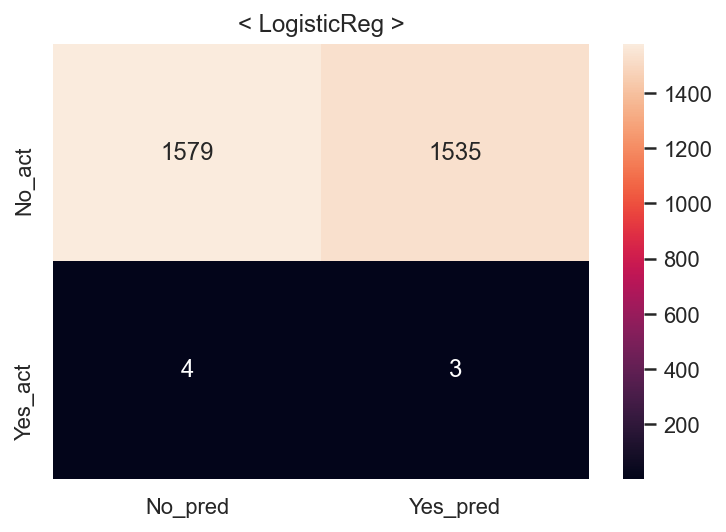

[Pipeline] ............ (step 1 of 2) Processing scaler, total=   0.0s
[Pipeline] ............... (step 2 of 2) Processing clf, total=   0.0s
====Done Evaluation====
====Done Evaluation====


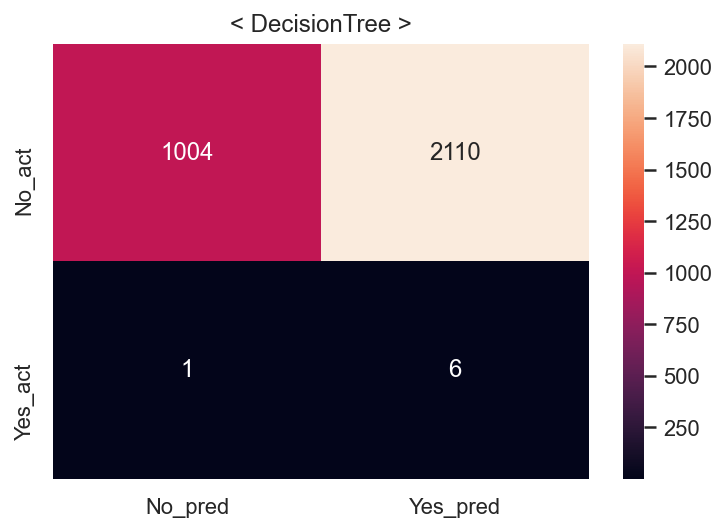

[Pipeline] ............ (step 1 of 2) Processing scaler, total=   0.0s
[Pipeline] ............... (step 2 of 2) Processing clf, total=   0.3s
====Done Evaluation====
====Done Evaluation====


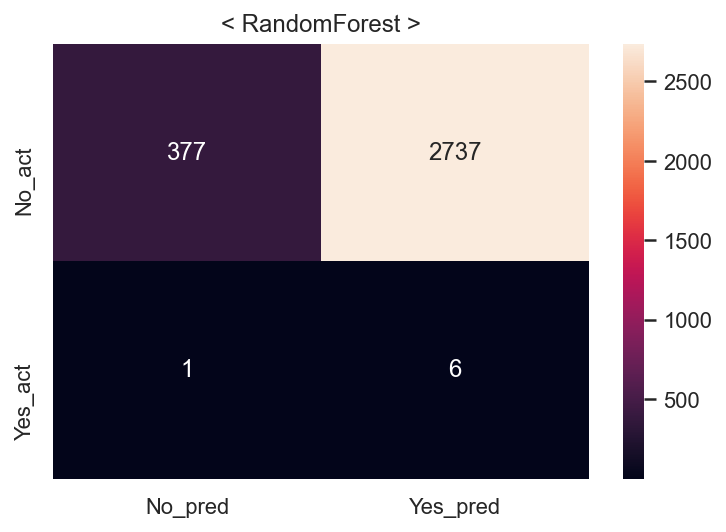

[Pipeline] ............ (step 1 of 2) Processing scaler, total=   0.0s
[Pipeline] ............... (step 2 of 2) Processing clf, total=   0.1s
====Done Evaluation====
====Done Evaluation====


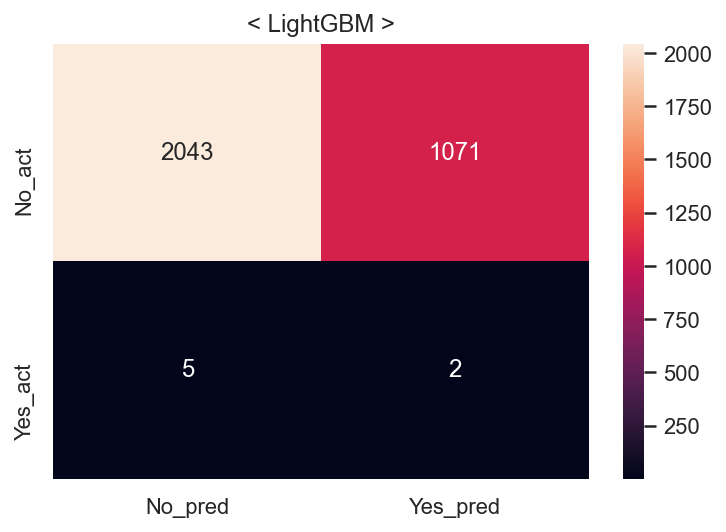

[Pipeline] ............ (step 1 of 2) Processing scaler, total=   0.0s
[Pipeline] ............... (step 2 of 2) Processing clf, total=  31.4s
====Done Evaluation====
====Done Evaluation====


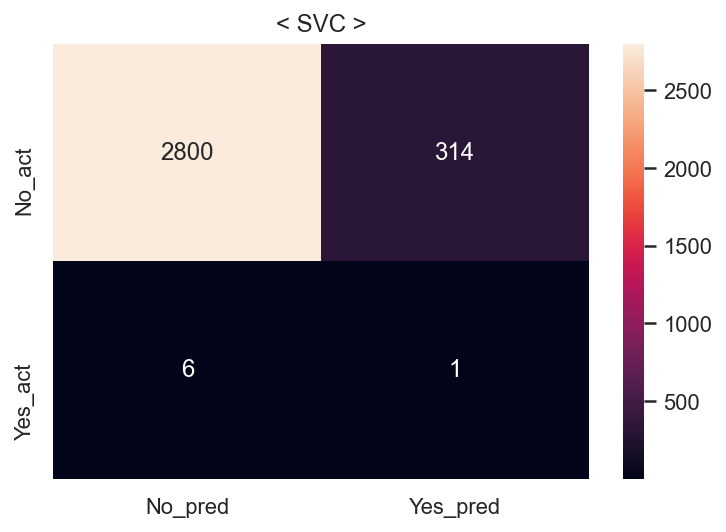

Fit time : 5.76 min


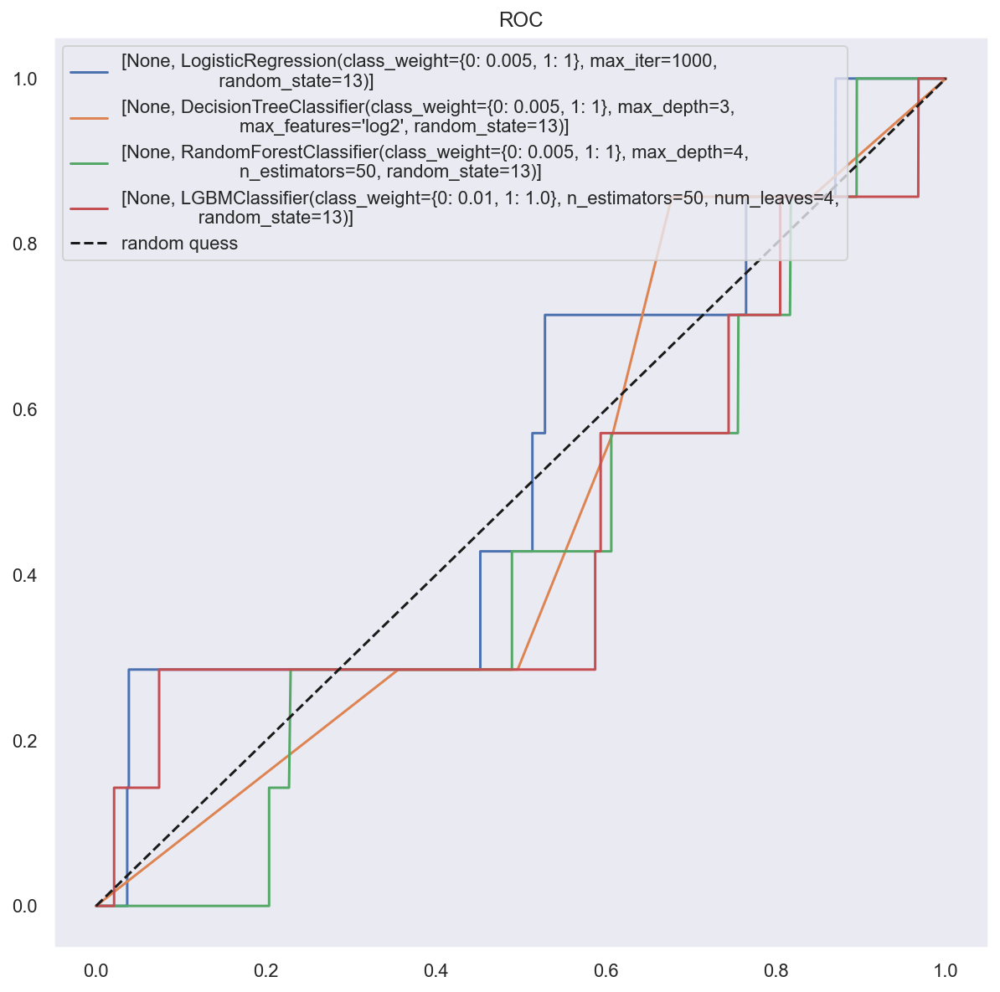

In [63]:
# null 삭제
socar_strange_delete = socar.drop(['c_15', 'c_16', 'c_21', 'c_22', 'c_23', 'c_24'], axis=1)
# 1hot
columns_1hot = socar_strange_delete.columns.drop(['c_1', 'c_3', 'c_5', 'c_10', 'c_11', 'c_18', 'c_19', 'c_8', 'c_20', 'c_25'])
socar_strange_delete_1hot = pd.get_dummies(socar_strange_delete, columns=columns_1hot)
# 데이터 분리
X_train, X_test, y_train, y_test = ut.split_train_test(socar_strange_delete_1hot)
# sampling to SMOTE (default)
X_train_over, y_train_over = ut.fit_sampler(X_train, y_train, sampler='SMOTE')
# evaluation
cv_list25, result_df25 = ut.fit_cv(X_train_over, y_train_over, X_test, y_test, scaler='No')

In [64]:
result_df25['class_weight'] = [1] * len(result_df25)
result_df25["null_del"] = [1]  * len(result_df25)
result_df25["encoded"] = [1]  * len(result_df25)
result_df25["scaler"] = ["None"]  * len(result_df25)
result_df25["sampler"] = ["SMOTE"]  * len(result_df25)
result_df25 = result_df25[['class_weight', 'null_del', 'encoded', 'scaler', 'sampler', 'classifier', 'train accuracy', 'train precision',
                             'train recall', 'train f1', 'train auc', 'test accuracy', 'test precision', 'test recall',
                             'test f1', 'test auc']]
result_df25

,class_weight,null_del,encoded,scaler,sampler,classifier,train accuracy,train precision,train recall,train f1,train auc,test accuracy,test precision,test recall,test f1,test auc
0,1,1,1,None,SMOTE,LogisticReg,0.782646,0.697113,0.999609,0.821396,0.782646,0.506889,0.001951,0.428571,0.003883,0.467818
1,1,1,1,None,SMOTE,DecisionTree,0.621837,0.569377,0.999922,0.725588,0.621837,0.323614,0.002836,0.857143,0.005652,0.589779
2,1,1,1,None,SMOTE,RandomForest,0.560059,0.531948,1.000000,0.694473,0.560059,0.122717,0.002187,0.857143,0.004364,0.489105
3,1,1,1,None,SMOTE,LightGBM,0.835403,0.752454,0.999688,0.858628,0.835403,0.655239,0.001864,0.285714,0.003704,0.470892
4,1,1,1,None,SMOTE,SVC,0.949274,0.918821,0.985629,0.951053,0.949274,0.897469,0.003175,0.142857,0.006211,0.521011


## 스물여섯번째
### (1) NULL값 삭제, (2)데이터 분리, (3) ADASYN, (4) 스케일링 없음

==Split Result==
y_train :  [[0, 1], [12804, 34]]
y_test : [[0, 1], [3114, 7]]
==Sampling Result==
y_train :  [[0, 1], [12804, 34]]
y_train_over : [[0, 1], [12804, 12794]]
[Pipeline] ............ (step 1 of 2) Processing scaler, total=   0.0s
[Pipeline] ............... (step 2 of 2) Processing clf, total=   0.9s
====Done Evaluation====
====Done Evaluation====


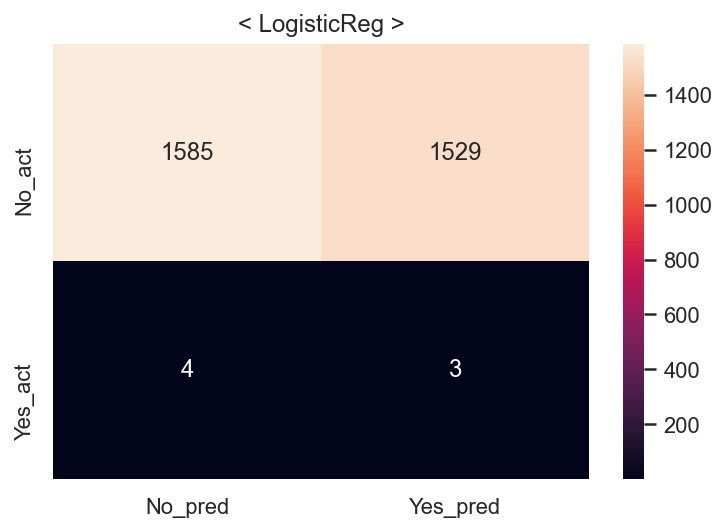

[Pipeline] ............ (step 1 of 2) Processing scaler, total=   0.0s
[Pipeline] ............... (step 2 of 2) Processing clf, total=   0.0s
====Done Evaluation====
====Done Evaluation====


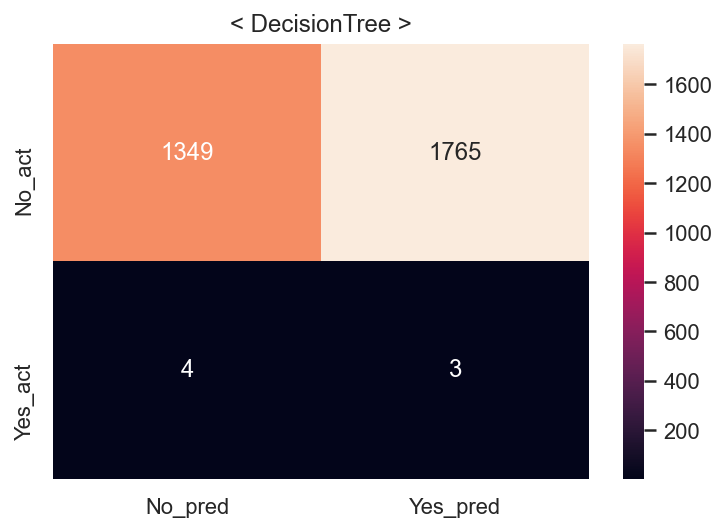

[Pipeline] ............ (step 1 of 2) Processing scaler, total=   0.0s
[Pipeline] ............... (step 2 of 2) Processing clf, total=   0.3s
====Done Evaluation====
====Done Evaluation====


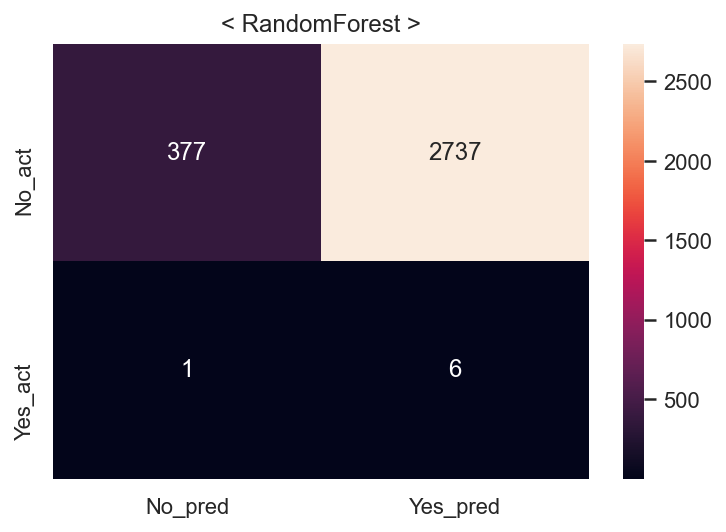

[Pipeline] ............ (step 1 of 2) Processing scaler, total=   0.0s
[Pipeline] ............... (step 2 of 2) Processing clf, total=   0.1s
====Done Evaluation====
====Done Evaluation====


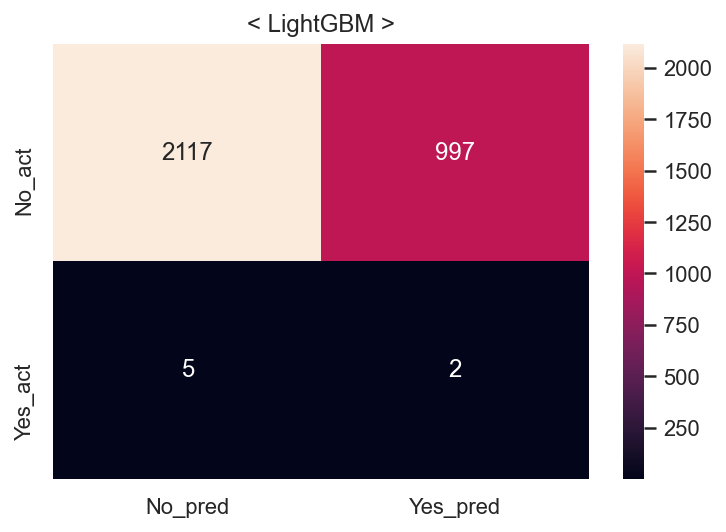

[Pipeline] ............ (step 1 of 2) Processing scaler, total=   0.0s
[Pipeline] ............... (step 2 of 2) Processing clf, total=  34.9s
====Done Evaluation====
====Done Evaluation====


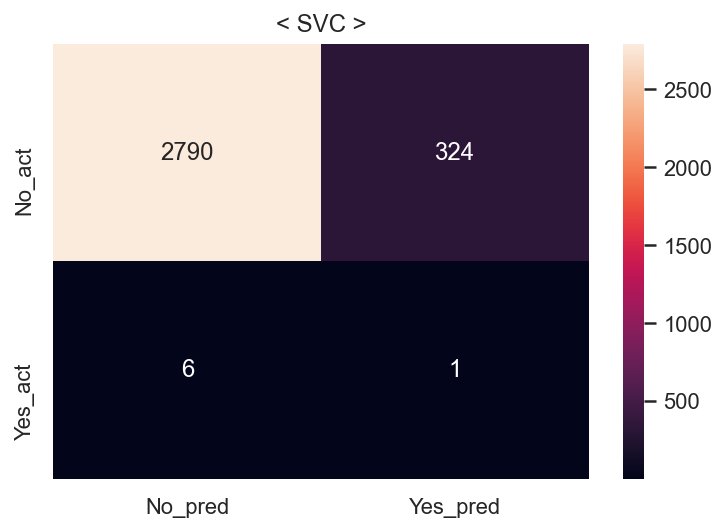

Fit time : 5.76 min


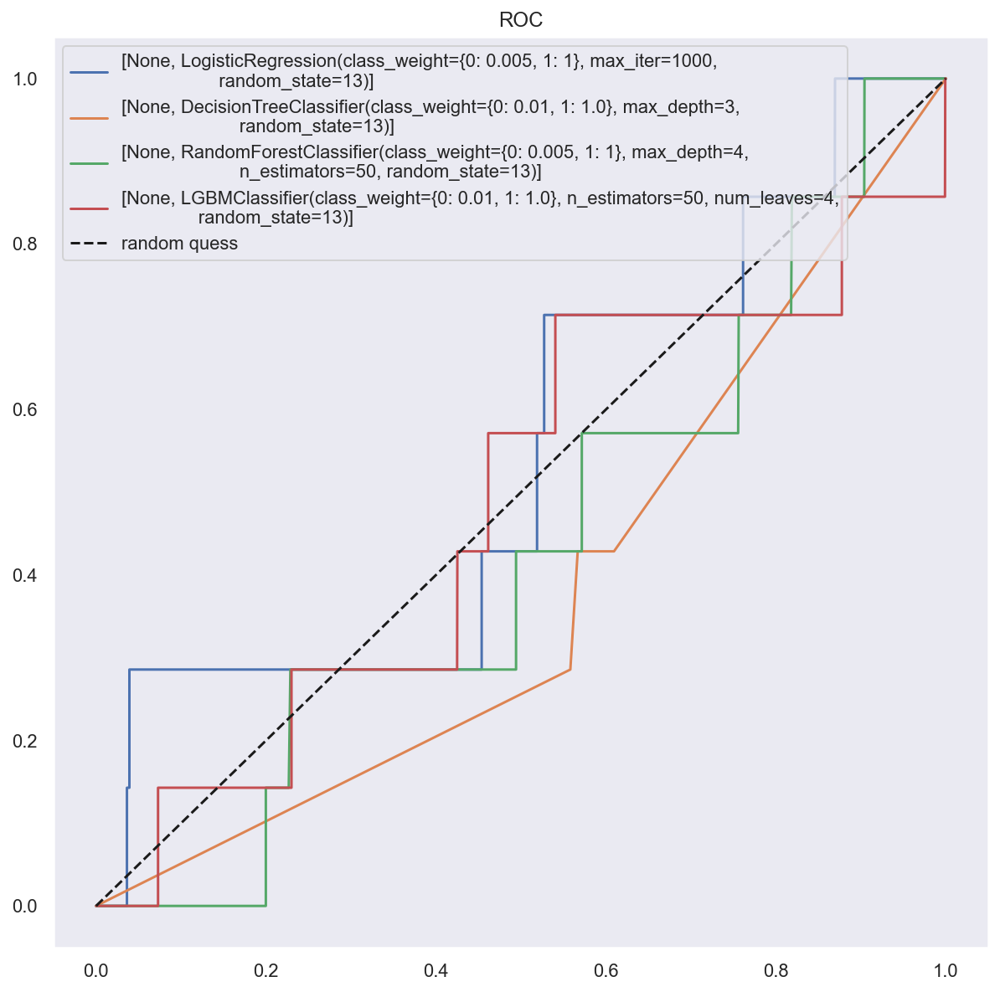

In [66]:
# null 삭제
socar_strange_delete = socar.drop(['c_15', 'c_16', 'c_21', 'c_22', 'c_23', 'c_24'], axis=1)
# 1hot
columns_1hot = socar_strange_delete.columns.drop(['c_1', 'c_3', 'c_5', 'c_10', 'c_11', 'c_18', 'c_19', 'c_8', 'c_20', 'c_25'])
socar_strange_delete_1hot = pd.get_dummies(socar_strange_delete, columns=columns_1hot)
# 데이터 분리
X_train, X_test, y_train, y_test = ut.split_train_test(socar_strange_delete_1hot)
# sampling to SMOTE (default)
X_train_over, y_train_over = ut.fit_sampler(X_train, y_train, sampler='ADASYN')
# evaluation
cv_list26, result_df26 = ut.fit_cv(X_train_over, y_train_over, X_test, y_test, scaler='No')

In [67]:
result_df26['class_weight'] = [1] * len(result_df26)
result_df26["null_del"] = [1]  * len(result_df26)
result_df26["encoded"] = [1]  * len(result_df26)
result_df26["scaler"] = ["None"]  * len(result_df26)
result_df26["sampler"] = ["ADASYN"]  * len(result_df26)
result_df26 = result_df26[['class_weight', 'null_del', 'encoded', 'scaler', 'sampler', 'classifier', 'train accuracy', 'train precision',
                             'train recall', 'train f1', 'train auc', 'test accuracy', 'test precision', 'test recall',
                             'test f1', 'test auc']]
result_df26

,class_weight,null_del,encoded,scaler,sampler,classifier,train accuracy,train precision,train recall,train f1,train auc,test accuracy,test precision,test recall,test f1,test auc
0,1,1,1,None,ADASYN,LogisticReg,0.782639,0.697024,0.999609,0.821335,0.782724,0.508811,0.001958,0.428571,0.003899,0.468782
1,1,1,1,None,ADASYN,DecisionTree,0.656028,0.592359,0.999844,0.743959,0.656162,0.433194,0.001697,0.428571,0.003380,0.430888
2,1,1,1,None,ADASYN,RandomForest,0.560591,0.532152,1.000000,0.694647,0.560762,0.122717,0.002187,0.857143,0.004364,0.489105
3,1,1,1,None,ADASYN,LightGBM,0.836198,0.753313,0.999609,0.859158,0.836262,0.678949,0.002002,0.285714,0.003976,0.482774
4,1,1,1,None,ADASYN,SVC,0.949098,0.917581,0.986791,0.950928,0.949112,0.894265,0.003077,0.142857,0.006024,0.519405


## 스물일곱번째
### (1) NULL값 삭제, (2)데이터 분리, (3) SMOTE, (4) MinMax

==Split Result==
y_train :  [[0, 1], [12804, 34]]
y_test : [[0, 1], [3114, 7]]
==Sampling Result==
y_train :  [[0, 1], [12804, 34]]
y_train_over : [[0, 1], [12804, 12804]]
[Pipeline] ............ (step 1 of 2) Processing scaler, total=   0.0s
[Pipeline] ............... (step 2 of 2) Processing clf, total=   0.1s
====Done Evaluation====
====Done Evaluation====


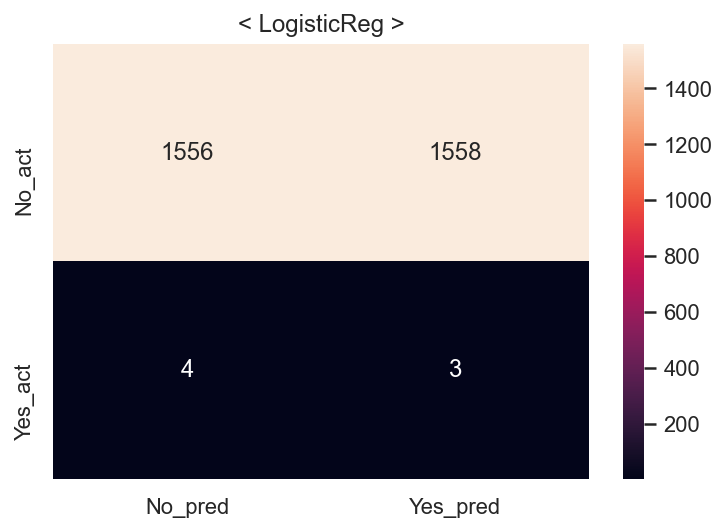

[Pipeline] ............ (step 1 of 2) Processing scaler, total=   0.0s
[Pipeline] ............... (step 2 of 2) Processing clf, total=   0.0s
====Done Evaluation====
====Done Evaluation====


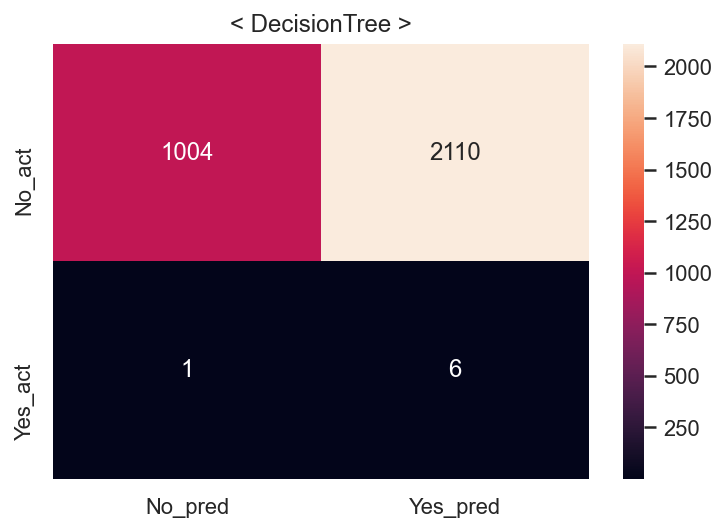

[Pipeline] ............ (step 1 of 2) Processing scaler, total=   0.0s
[Pipeline] ............... (step 2 of 2) Processing clf, total=   0.3s
====Done Evaluation====
====Done Evaluation====


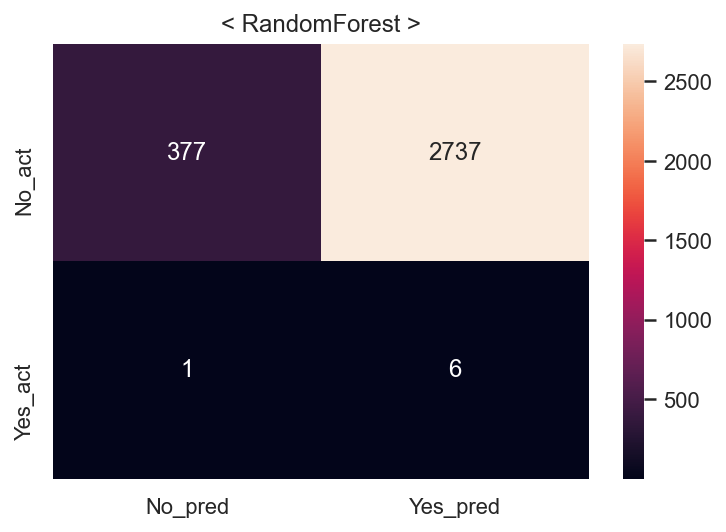

[Pipeline] ............ (step 1 of 2) Processing scaler, total=   0.0s
[Pipeline] ............... (step 2 of 2) Processing clf, total=   0.1s
====Done Evaluation====
====Done Evaluation====


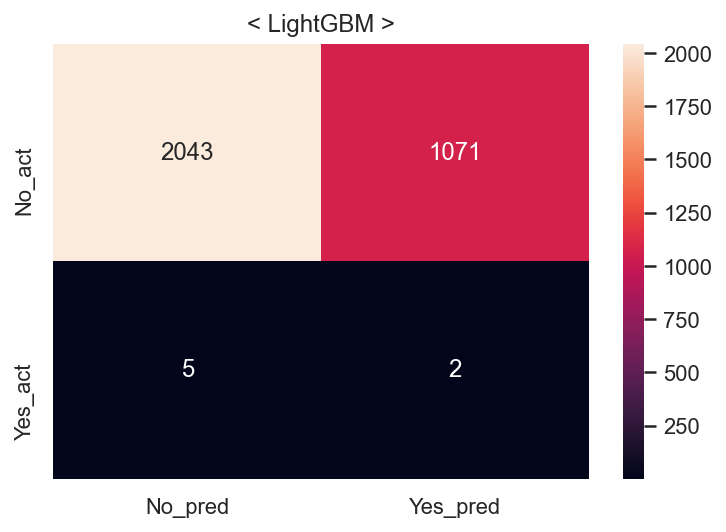

[Pipeline] ............ (step 1 of 2) Processing scaler, total=   0.0s
[Pipeline] ............... (step 2 of 2) Processing clf, total=   2.2s
====Done Evaluation====
====Done Evaluation====


C:\Users\sh\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1245: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


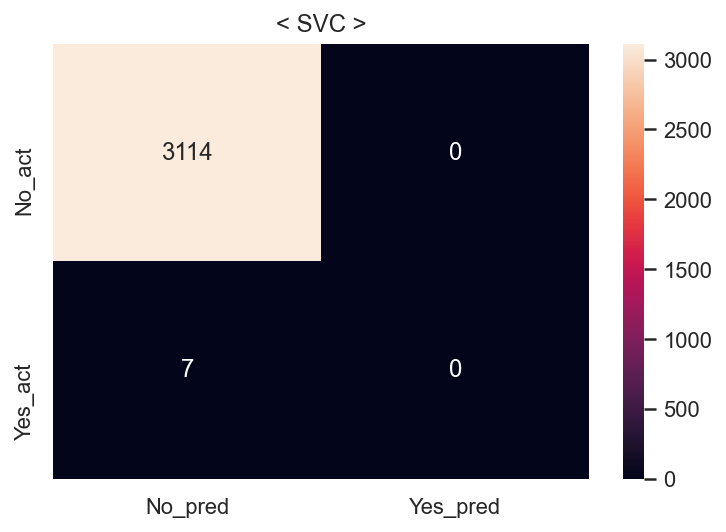

Fit time : 2.15 min


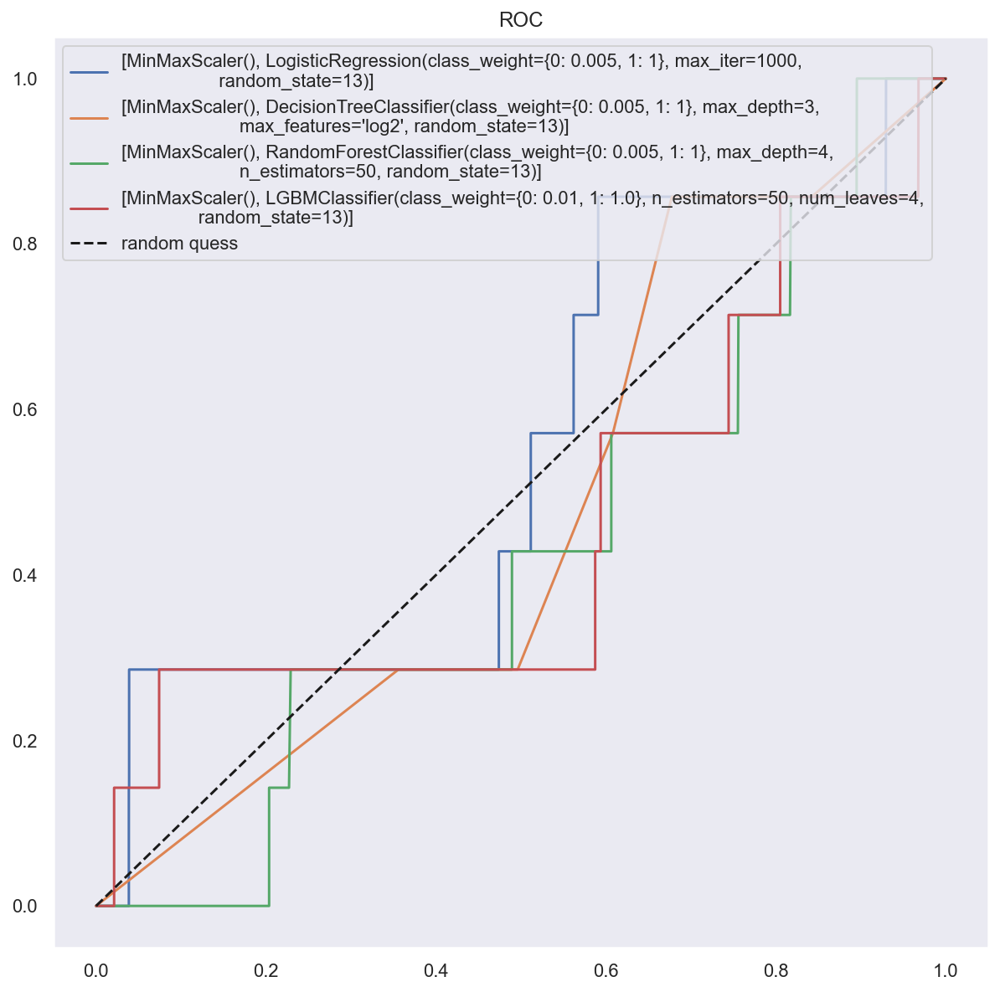

In [68]:
# null 삭제
socar_strange_delete = socar.drop(['c_15', 'c_16', 'c_21', 'c_22', 'c_23', 'c_24'], axis=1)
# 1hot
columns_1hot = socar_strange_delete.columns.drop(['c_1', 'c_3', 'c_5', 'c_10', 'c_11', 'c_18', 'c_19', 'c_8', 'c_20', 'c_25'])
socar_strange_delete_1hot = pd.get_dummies(socar_strange_delete, columns=columns_1hot)
# 데이터 분리
X_train, X_test, y_train, y_test = ut.split_train_test(socar_strange_delete_1hot)
# sampling to SMOTE (default)
X_train_over, y_train_over = ut.fit_sampler(X_train, y_train, sampler='SMOTE')
# evaluation
cv_list27, result_df27 = ut.fit_cv(X_train_over, y_train_over, X_test, y_test, scaler='MM')

In [69]:
result_df27['class_weight'] = [1] * len(result_df27)
result_df27["null_del"] = [1]  * len(result_df27)
result_df27["encoded"] = [1]  * len(result_df27)
result_df27["scaler"] = ["MM"]  * len(result_df27)
result_df27["sampler"] = ["SMOTE"]  * len(result_df27)
result_df27 = result_df27[['class_weight', 'null_del', 'encoded', 'scaler', 'sampler', 'classifier', 'train accuracy', 'train precision',
                             'train recall', 'train f1', 'train auc', 'test accuracy', 'test precision', 'test recall',
                             'test f1', 'test auc']]
result_df27

,class_weight,null_del,encoded,scaler,sampler,classifier,train accuracy,train precision,train recall,train f1,train auc,test accuracy,test precision,test recall,test f1,test auc
0,1,1,1,MM,SMOTE,LogisticReg,0.779092,0.693696,0.999531,0.818993,0.779092,0.499519,0.001922,0.428571,0.003827,0.464125
1,1,1,1,MM,SMOTE,DecisionTree,0.621837,0.569377,0.999922,0.725588,0.621837,0.323614,0.002836,0.857143,0.005652,0.589779
2,1,1,1,MM,SMOTE,RandomForest,0.560059,0.531948,1.000000,0.694473,0.560059,0.122717,0.002187,0.857143,0.004364,0.489105
3,1,1,1,MM,SMOTE,LightGBM,0.835403,0.752454,0.999688,0.858628,0.835403,0.655239,0.001864,0.285714,0.003704,0.470892
4,1,1,1,MM,SMOTE,SVC,0.998633,0.999922,0.997345,0.998631,0.998633,0.997757,0.000000,0.000000,0.000000,0.500000


## 스물여덟번째
### (1) NULL값 삭제, (2)데이터 분리, (3) ADASYN, (4) MinMax

==Split Result==
y_train :  [[0, 1], [12804, 34]]
y_test : [[0, 1], [3114, 7]]
==Sampling Result==
y_train :  [[0, 1], [12804, 34]]
y_train_over : [[0, 1], [12804, 12794]]
[Pipeline] ............ (step 1 of 2) Processing scaler, total=   0.0s
[Pipeline] ............... (step 2 of 2) Processing clf, total=   0.1s
====Done Evaluation====
====Done Evaluation====


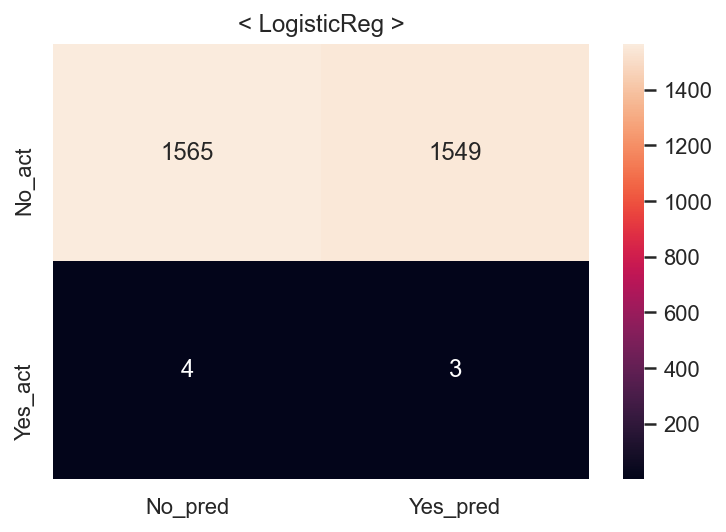

[Pipeline] ............ (step 1 of 2) Processing scaler, total=   0.0s
[Pipeline] ............... (step 2 of 2) Processing clf, total=   0.0s
====Done Evaluation====
====Done Evaluation====


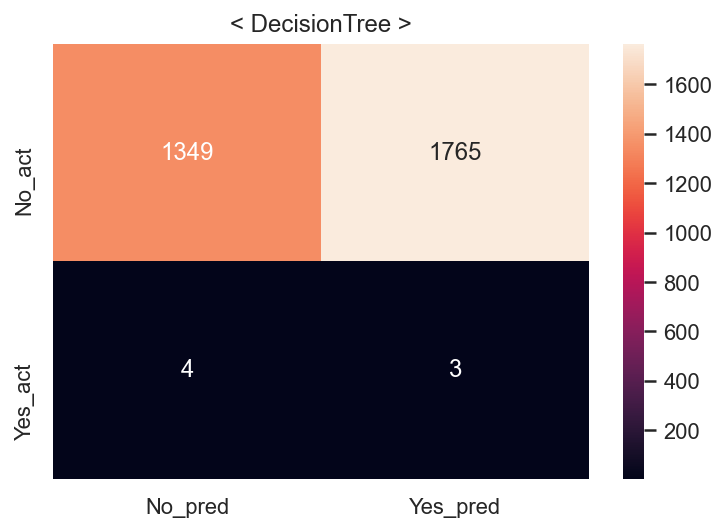

[Pipeline] ............ (step 1 of 2) Processing scaler, total=   0.0s
[Pipeline] ............... (step 2 of 2) Processing clf, total=   0.2s
====Done Evaluation====
====Done Evaluation====


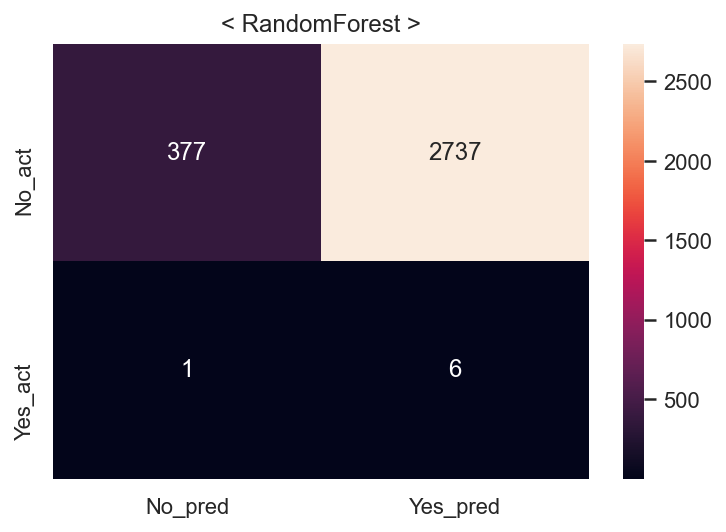

[Pipeline] ............ (step 1 of 2) Processing scaler, total=   0.0s
[Pipeline] ............... (step 2 of 2) Processing clf, total=   0.1s
====Done Evaluation====
====Done Evaluation====


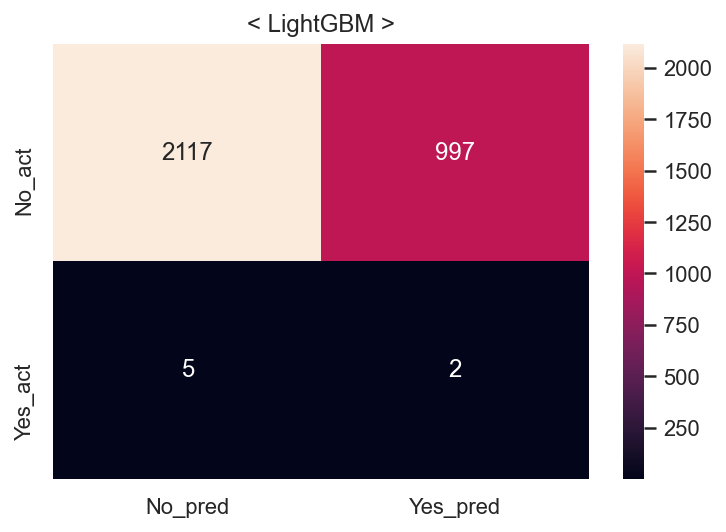

[Pipeline] ............ (step 1 of 2) Processing scaler, total=   0.0s
[Pipeline] ............... (step 2 of 2) Processing clf, total=   2.1s
====Done Evaluation====
====Done Evaluation====


C:\Users\sh\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1245: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


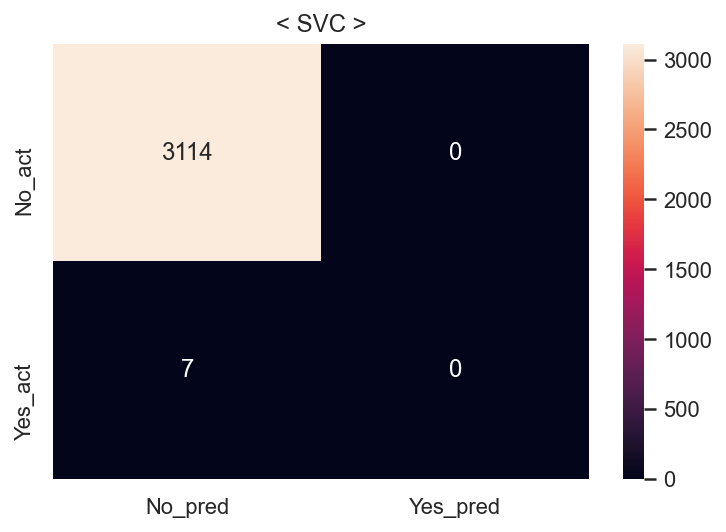

Fit time : 2.07 min


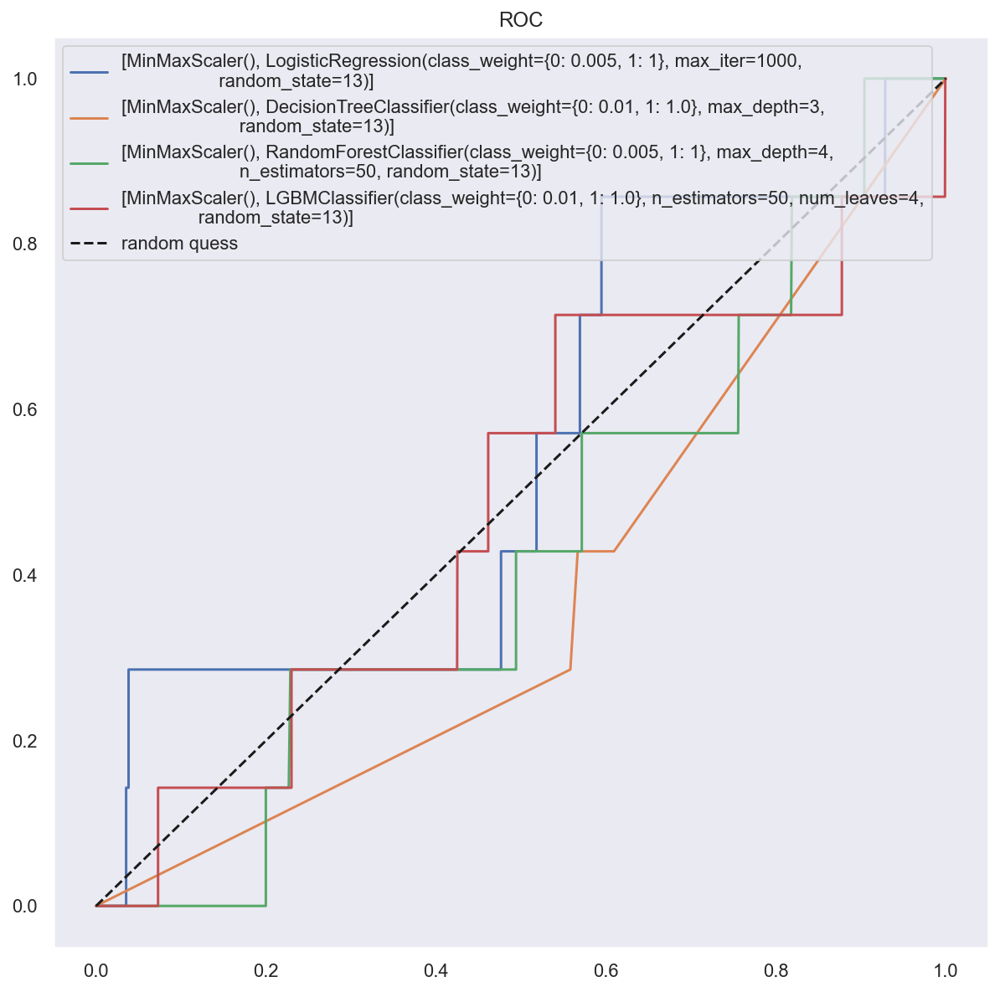

In [70]:
# null 삭제
socar_strange_delete = socar.drop(['c_15', 'c_16', 'c_21', 'c_22', 'c_23', 'c_24'], axis=1)
# 1hot
columns_1hot = socar_strange_delete.columns.drop(['c_1', 'c_3', 'c_5', 'c_10', 'c_11', 'c_18', 'c_19', 'c_8', 'c_20', 'c_25'])
socar_strange_delete_1hot = pd.get_dummies(socar_strange_delete, columns=columns_1hot)
# 데이터 분리
X_train, X_test, y_train, y_test = ut.split_train_test(socar_strange_delete_1hot)
# sampling to SMOTE (default)
X_train_over, y_train_over = ut.fit_sampler(X_train, y_train, sampler='ADASYN')
# evaluation
cv_list28, result_df28 = ut.fit_cv(X_train_over, y_train_over, X_test, y_test, scaler='MM')

In [71]:
result_df28['class_weight'] = [1] * len(result_df28)
result_df28["null_del"] = [1]  * len(result_df28)
result_df28["encoded"] = [1]  * len(result_df28)
result_df28["scaler"] = ["MM"]  * len(result_df28)
result_df28["sampler"] = ["ADASYN"]  * len(result_df28)
result_df28 = result_df28[['class_weight', 'null_del', 'encoded', 'scaler', 'sampler', 'classifier', 'train accuracy', 'train precision',
                             'train recall', 'train f1', 'train auc', 'test accuracy', 'test precision', 'test recall',
                             'test f1', 'test auc']]
result_df28

,class_weight,null_del,encoded,scaler,sampler,classifier,train accuracy,train precision,train recall,train f1,train auc,test accuracy,test precision,test recall,test f1,test auc
0,1,1,1,MM,ADASYN,LogisticReg,0.779553,0.694057,0.999531,0.819245,0.779639,0.502403,0.001933,0.428571,0.003849,0.465570
1,1,1,1,MM,ADASYN,DecisionTree,0.656028,0.592359,0.999844,0.743959,0.656162,0.433194,0.001697,0.428571,0.003380,0.430888
2,1,1,1,MM,ADASYN,RandomForest,0.560591,0.532152,1.000000,0.694647,0.560762,0.122717,0.002187,0.857143,0.004364,0.489105
3,1,1,1,MM,ADASYN,LightGBM,0.836198,0.753313,0.999609,0.859158,0.836262,0.678949,0.002002,0.285714,0.003976,0.482774
4,1,1,1,MM,ADASYN,SVC,0.998633,0.999922,0.997343,0.998630,0.998632,0.997757,0.000000,0.000000,0.000000,0.500000


## 스물아홉번째
### (1) NULL값 삭제, (2)데이터 분리, (3) SMOTE, (4) Standard

==Split Result==
y_train :  [[0, 1], [12804, 34]]
y_test : [[0, 1], [3114, 7]]
==Sampling Result==
y_train :  [[0, 1], [12804, 34]]
y_train_over : [[0, 1], [12804, 12804]]
[Pipeline] ............ (step 1 of 2) Processing scaler, total=   0.0s
[Pipeline] ............... (step 2 of 2) Processing clf, total=   0.1s
====Done Evaluation====
====Done Evaluation====


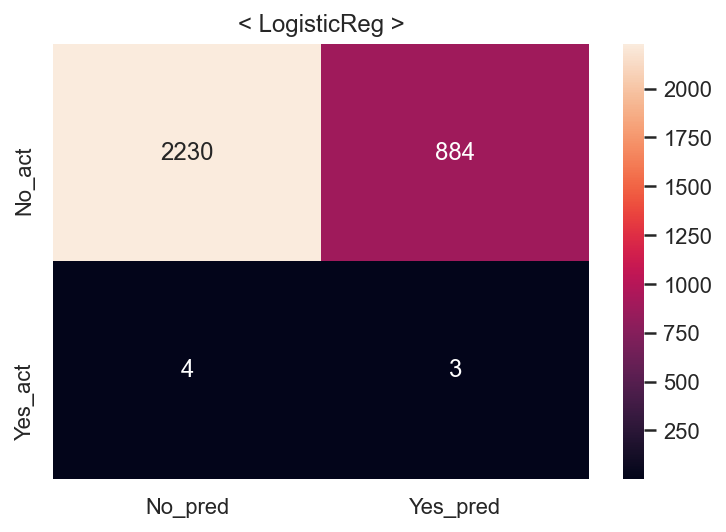

[Pipeline] ............ (step 1 of 2) Processing scaler, total=   0.0s
[Pipeline] ............... (step 2 of 2) Processing clf, total=   0.0s
====Done Evaluation====
====Done Evaluation====


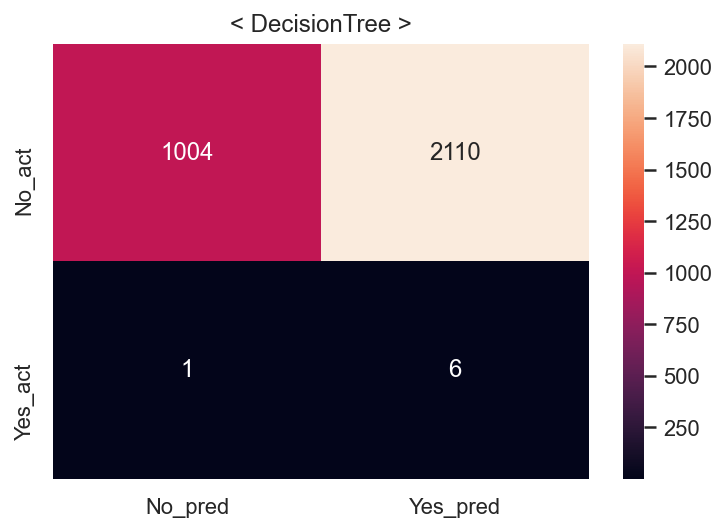

[Pipeline] ............ (step 1 of 2) Processing scaler, total=   0.0s
[Pipeline] ............... (step 2 of 2) Processing clf, total=   0.3s
====Done Evaluation====
====Done Evaluation====


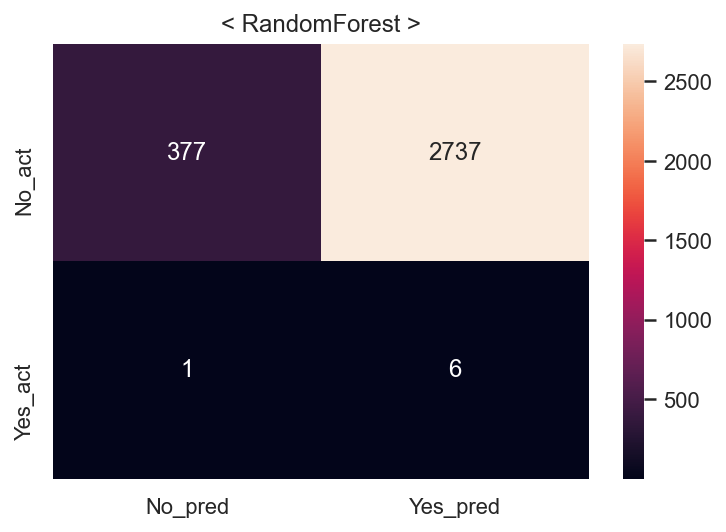

[Pipeline] ............ (step 1 of 2) Processing scaler, total=   0.0s
[Pipeline] ............... (step 2 of 2) Processing clf, total=   0.1s
====Done Evaluation====
====Done Evaluation====


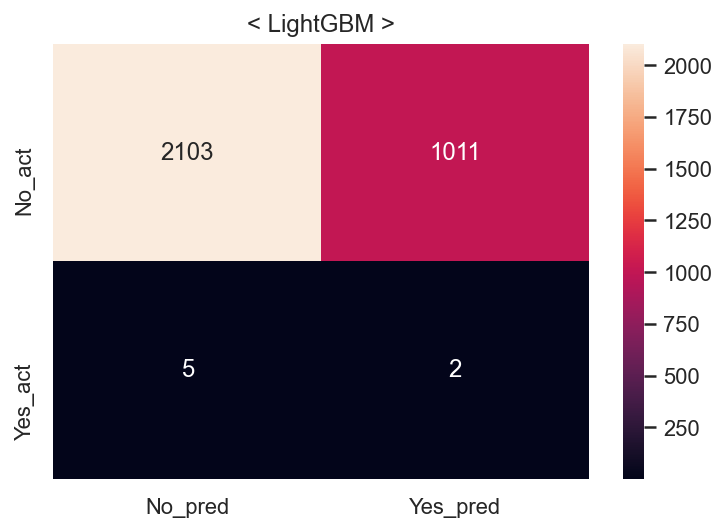

[Pipeline] ............ (step 1 of 2) Processing scaler, total=   0.0s
[Pipeline] ............... (step 2 of 2) Processing clf, total=   2.0s
====Done Evaluation====
====Done Evaluation====


C:\Users\sh\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1245: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


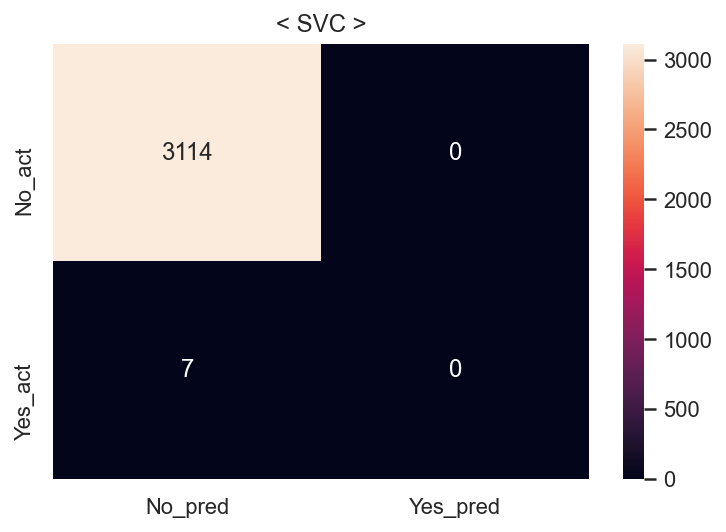

Fit time : 2.29 min


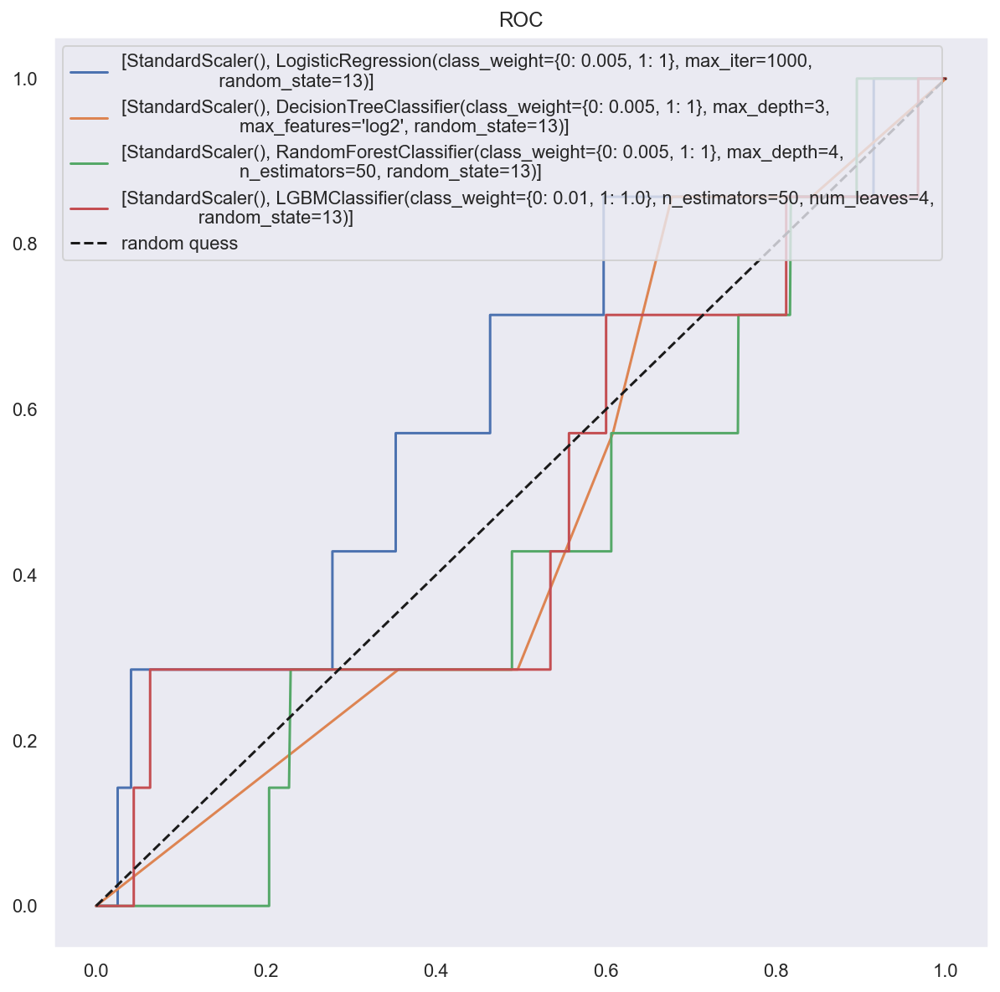

In [72]:
# null 삭제
socar_strange_delete = socar.drop(['c_15', 'c_16', 'c_21', 'c_22', 'c_23', 'c_24'], axis=1)
# 1hot
columns_1hot = socar_strange_delete.columns.drop(['c_1', 'c_3', 'c_5', 'c_10', 'c_11', 'c_18', 'c_19', 'c_8', 'c_20', 'c_25'])
socar_strange_delete_1hot = pd.get_dummies(socar_strange_delete, columns=columns_1hot)
# 데이터 분리
X_train, X_test, y_train, y_test = ut.split_train_test(socar_strange_delete_1hot)
# sampling to SMOTE (default)
X_train_over, y_train_over = ut.fit_sampler(X_train, y_train, sampler='SMOTE')
# evaluation
cv_list29, result_df29 = ut.fit_cv(X_train_over, y_train_over, X_test, y_test, scaler='SD')

In [73]:
result_df29['class_weight'] = [1] * len(result_df29)
result_df29["null_del"] = [1]  * len(result_df29)
result_df29["encoded"] = [1]  * len(result_df29)
result_df29["scaler"] = ["SD"]  * len(result_df29)
result_df29["sampler"] = ["SMOTE"]  * len(result_df29)
result_df29 = result_df29[['class_weight', 'null_del', 'encoded', 'scaler', 'sampler', 'classifier', 'train accuracy', 'train precision',
                             'train recall', 'train f1', 'train auc', 'test accuracy', 'test precision', 'test recall',
                             'test f1', 'test auc']]
result_df29

,class_weight,null_del,encoded,scaler,sampler,classifier,train accuracy,train precision,train recall,train f1,train auc,test accuracy,test precision,test recall,test f1,test auc
0,1,1,1,SD,SMOTE,LogisticReg,0.892690,0.823677,0.999297,0.903028,0.892690,0.715476,0.003382,0.428571,0.006711,0.572346
1,1,1,1,SD,SMOTE,DecisionTree,0.621837,0.569377,0.999922,0.725588,0.621837,0.323614,0.002836,0.857143,0.005652,0.589779
2,1,1,1,SD,SMOTE,RandomForest,0.560059,0.531948,1.000000,0.694473,0.560059,0.122717,0.002187,0.857143,0.004364,0.489105
3,1,1,1,SD,SMOTE,LightGBM,0.837785,0.755222,0.999531,0.860370,0.837785,0.674463,0.001974,0.285714,0.003922,0.480526
4,1,1,1,SD,SMOTE,SVC,0.998672,1.000000,0.997345,0.998671,0.998672,0.997757,0.000000,0.000000,0.000000,0.500000


## 서른번째
### (1) NULL값 삭제, (2)데이터 분리, (3) ADASYN, (4) Standard

==Split Result==
y_train :  [[0, 1], [12804, 34]]
y_test : [[0, 1], [3114, 7]]
==Sampling Result==
y_train :  [[0, 1], [12804, 34]]
y_train_over : [[0, 1], [12804, 12794]]
[Pipeline] ............ (step 1 of 2) Processing scaler, total=   0.0s
[Pipeline] ............... (step 2 of 2) Processing clf, total=   0.1s
====Done Evaluation====
====Done Evaluation====


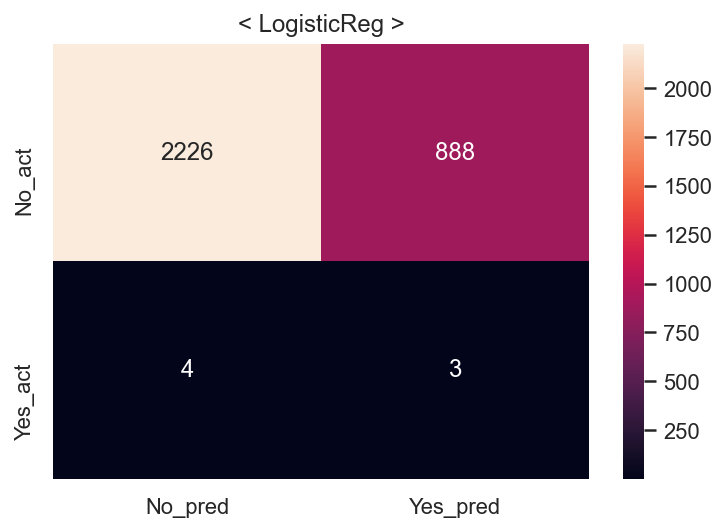

[Pipeline] ............ (step 1 of 2) Processing scaler, total=   0.0s
[Pipeline] ............... (step 2 of 2) Processing clf, total=   0.0s
====Done Evaluation====
====Done Evaluation====


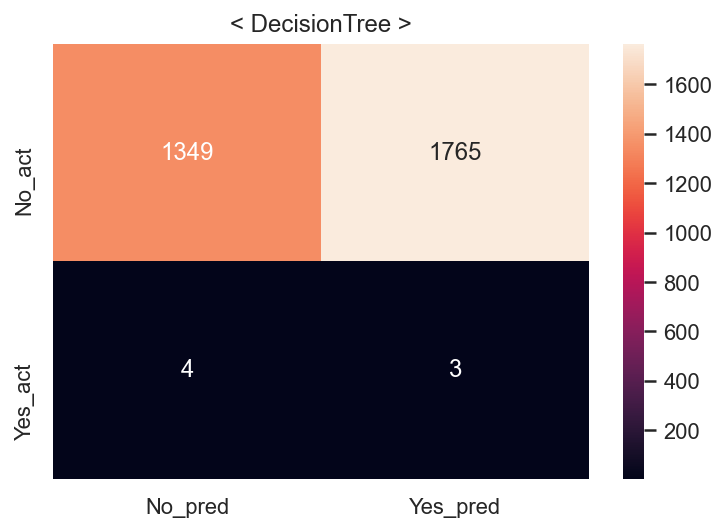

[Pipeline] ............ (step 1 of 2) Processing scaler, total=   0.0s
[Pipeline] ............... (step 2 of 2) Processing clf, total=   0.3s
====Done Evaluation====
====Done Evaluation====


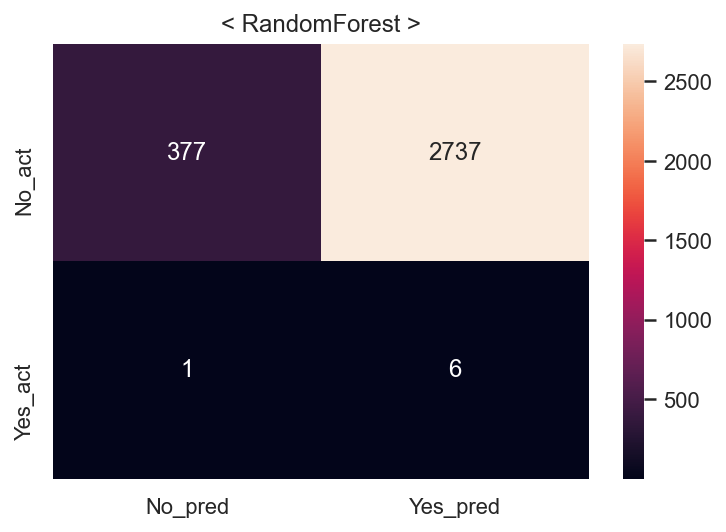

[Pipeline] ............ (step 1 of 2) Processing scaler, total=   0.0s
[Pipeline] ............... (step 2 of 2) Processing clf, total=   0.1s
====Done Evaluation====
====Done Evaluation====


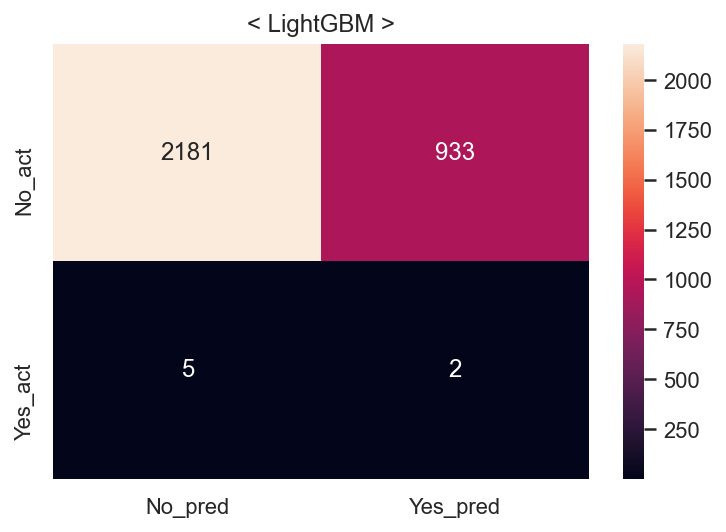

[Pipeline] ............ (step 1 of 2) Processing scaler, total=   0.0s
[Pipeline] ............... (step 2 of 2) Processing clf, total=   2.1s
====Done Evaluation====
====Done Evaluation====


C:\Users\sh\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1245: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


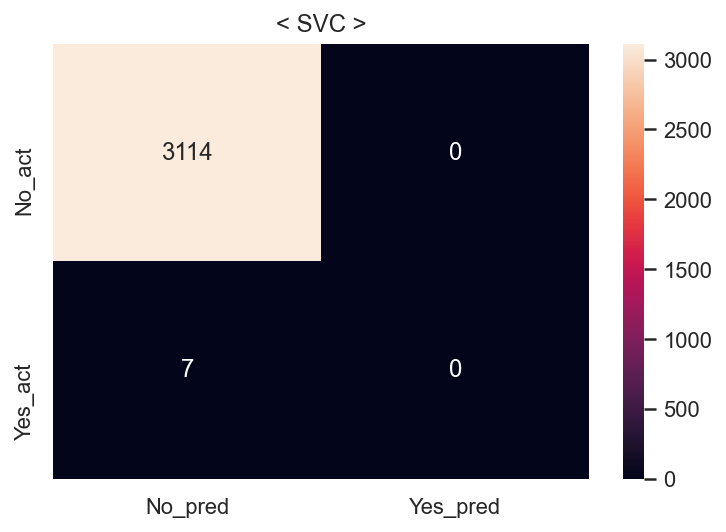

Fit time : 2.19 min


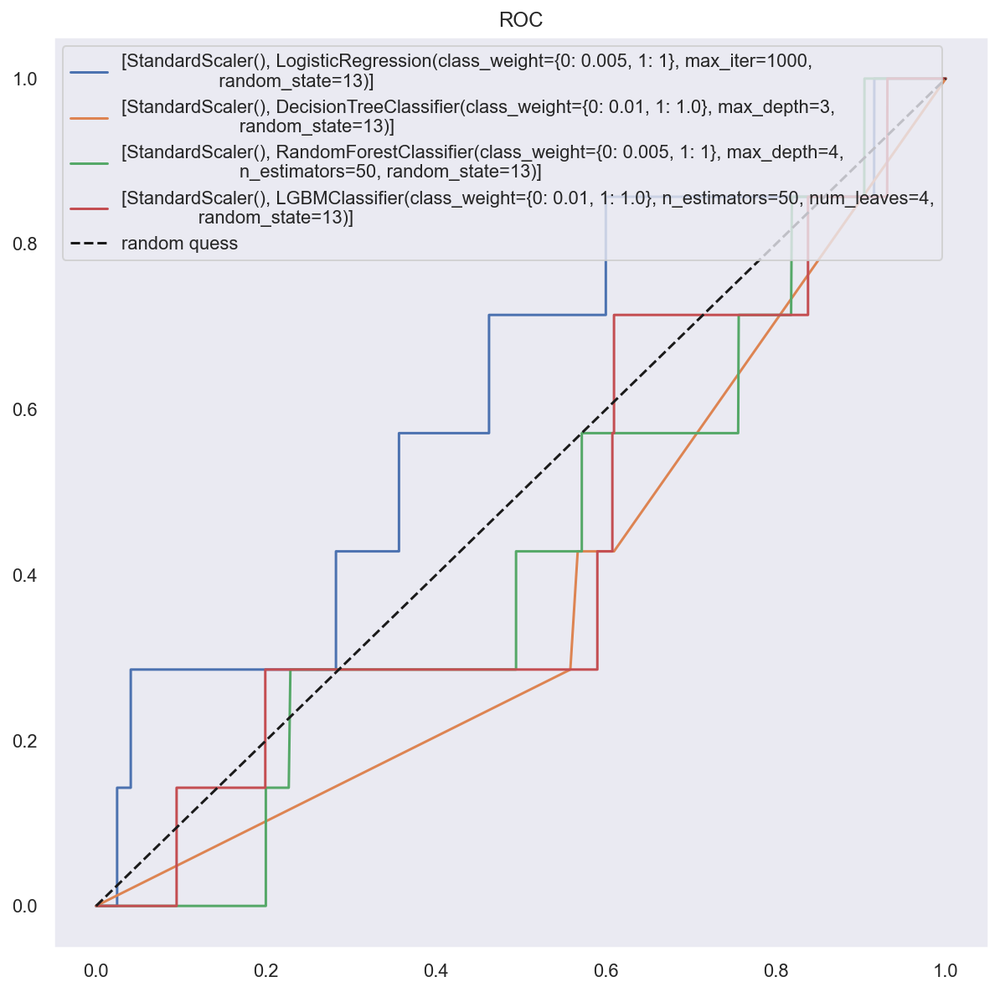

In [74]:
# null 삭제
socar_strange_delete = socar.drop(['c_15', 'c_16', 'c_21', 'c_22', 'c_23', 'c_24'], axis=1)
# 1hot
columns_1hot = socar_strange_delete.columns.drop(['c_1', 'c_3', 'c_5', 'c_10', 'c_11', 'c_18', 'c_19', 'c_8', 'c_20', 'c_25'])
socar_strange_delete_1hot = pd.get_dummies(socar_strange_delete, columns=columns_1hot)
# 데이터 분리
X_train, X_test, y_train, y_test = ut.split_train_test(socar_strange_delete_1hot)
# sampling to SMOTE (default)
X_train_over, y_train_over = ut.fit_sampler(X_train, y_train, sampler='ADASYN')
# evaluation
cv_list30, result_df30 = ut.fit_cv(X_train_over, y_train_over, X_test, y_test, scaler='SD')

In [75]:
result_df30['class_weight'] = [1] * len(result_df30)
result_df30["null_del"] = [1]  * len(result_df30)
result_df30["encoded"] = [1]  * len(result_df30)
result_df30["scaler"] = ["SD"]  * len(result_df30)
result_df30["sampler"] = ["ADASYN"]  * len(result_df30)
result_df30 = result_df30[['class_weight', 'null_del', 'encoded', 'scaler', 'sampler', 'classifier', 'train accuracy', 'train precision',
                             'train recall', 'train f1', 'train auc', 'test accuracy', 'test precision', 'test recall',
                             'test f1', 'test auc']]
result_df30

,class_weight,null_del,encoded,scaler,sampler,classifier,train accuracy,train precision,train recall,train f1,train auc,test accuracy,test precision,test recall,test f1,test auc
0,1,1,1,SD,ADASYN,LogisticReg,0.892960,0.823988,0.999297,0.903214,0.893002,0.714194,0.003367,0.428571,0.006682,0.571704
1,1,1,1,SD,ADASYN,DecisionTree,0.656028,0.592359,0.999844,0.743959,0.656162,0.433194,0.001697,0.428571,0.003380,0.430888
2,1,1,1,SD,ADASYN,RandomForest,0.560591,0.532152,1.000000,0.694647,0.560762,0.122717,0.002187,0.857143,0.004364,0.489105
3,1,1,1,SD,ADASYN,LightGBM,0.846433,0.765185,0.999453,0.866768,0.846493,0.699455,0.002139,0.285714,0.004246,0.493050
4,1,1,1,SD,ADASYN,SVC,0.998672,1.000000,0.997343,0.998669,0.998671,0.997757,0.000000,0.000000,0.000000,0.500000


## 서른한번째
### (1) NULL값 삭제, (2)데이터 분리, (3) SMOTE, (4) Robust

==Split Result==
y_train :  [[0, 1], [12804, 34]]
y_test : [[0, 1], [3114, 7]]
==Sampling Result==
y_train :  [[0, 1], [12804, 34]]
y_train_over : [[0, 1], [12804, 12804]]
[Pipeline] ............ (step 1 of 2) Processing scaler, total=   0.0s
[Pipeline] ............... (step 2 of 2) Processing clf, total=   0.2s
====Done Evaluation====
====Done Evaluation====


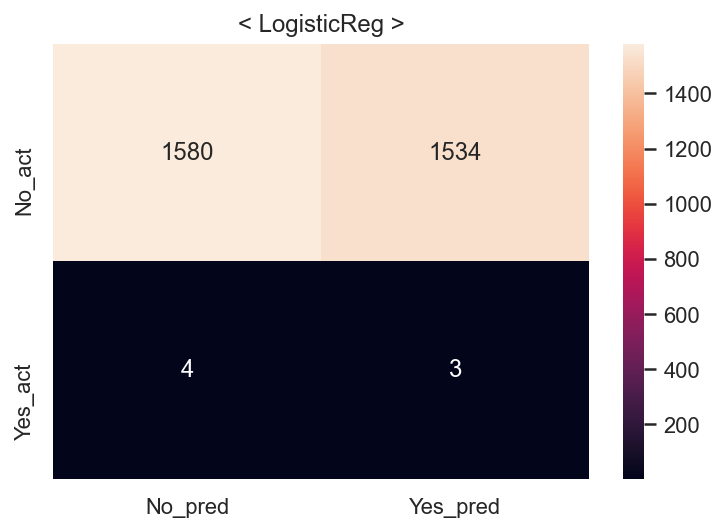

[Pipeline] ............ (step 1 of 2) Processing scaler, total=   0.0s
[Pipeline] ............... (step 2 of 2) Processing clf, total=   0.0s
====Done Evaluation====
====Done Evaluation====


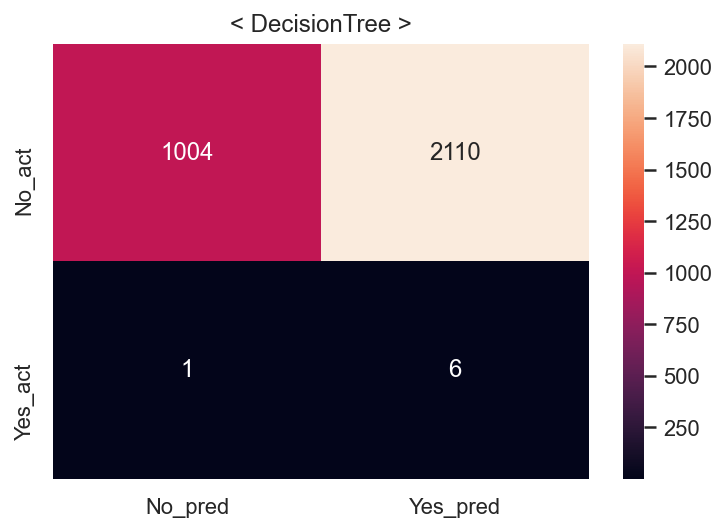

[Pipeline] ............ (step 1 of 2) Processing scaler, total=   0.0s
[Pipeline] ............... (step 2 of 2) Processing clf, total=   0.3s
====Done Evaluation====
====Done Evaluation====


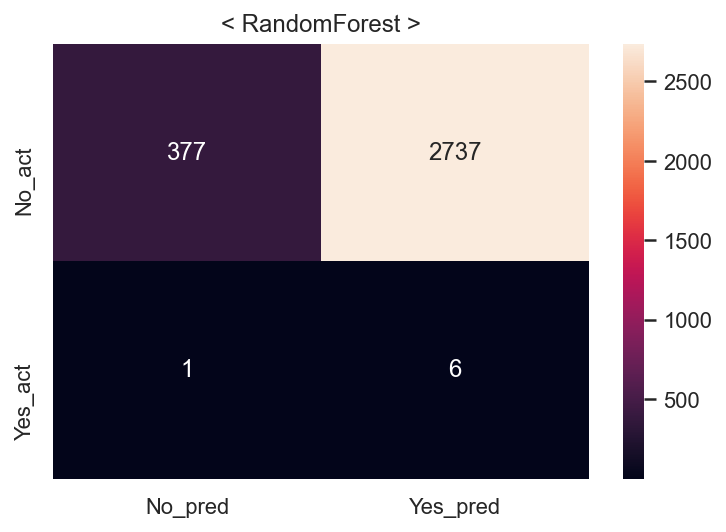

[Pipeline] ............ (step 1 of 2) Processing scaler, total=   0.0s
[Pipeline] ............... (step 2 of 2) Processing clf, total=   0.1s
====Done Evaluation====
====Done Evaluation====


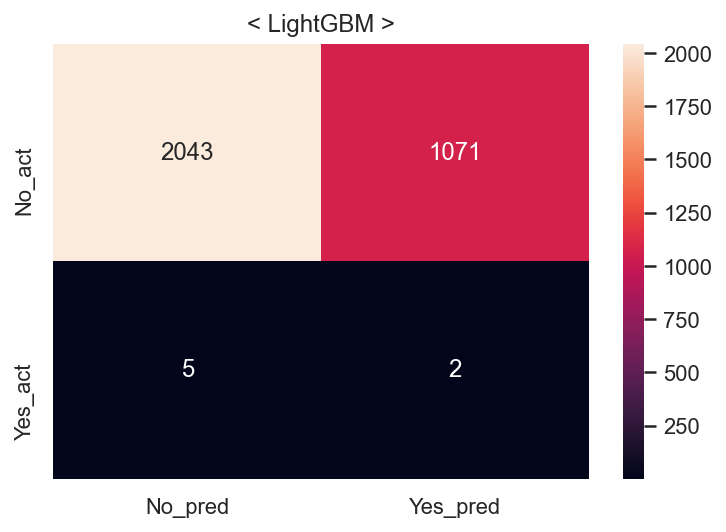

[Pipeline] ............ (step 1 of 2) Processing scaler, total=   0.0s
[Pipeline] ............... (step 2 of 2) Processing clf, total=   9.0s
====Done Evaluation====
====Done Evaluation====


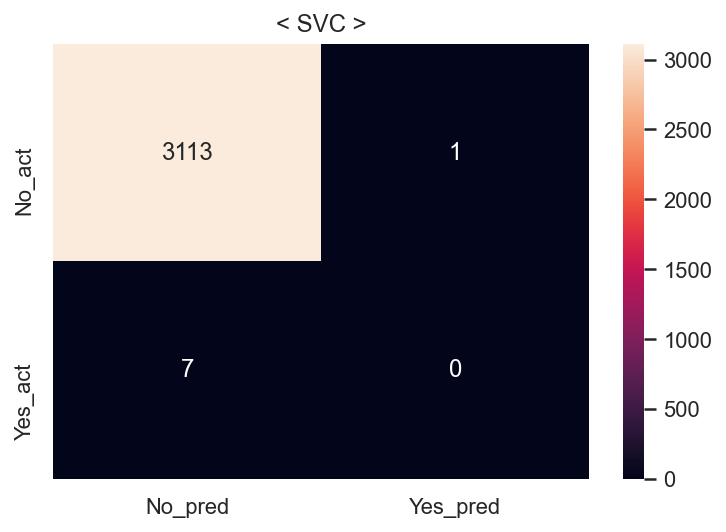

Fit time : 3.73 min


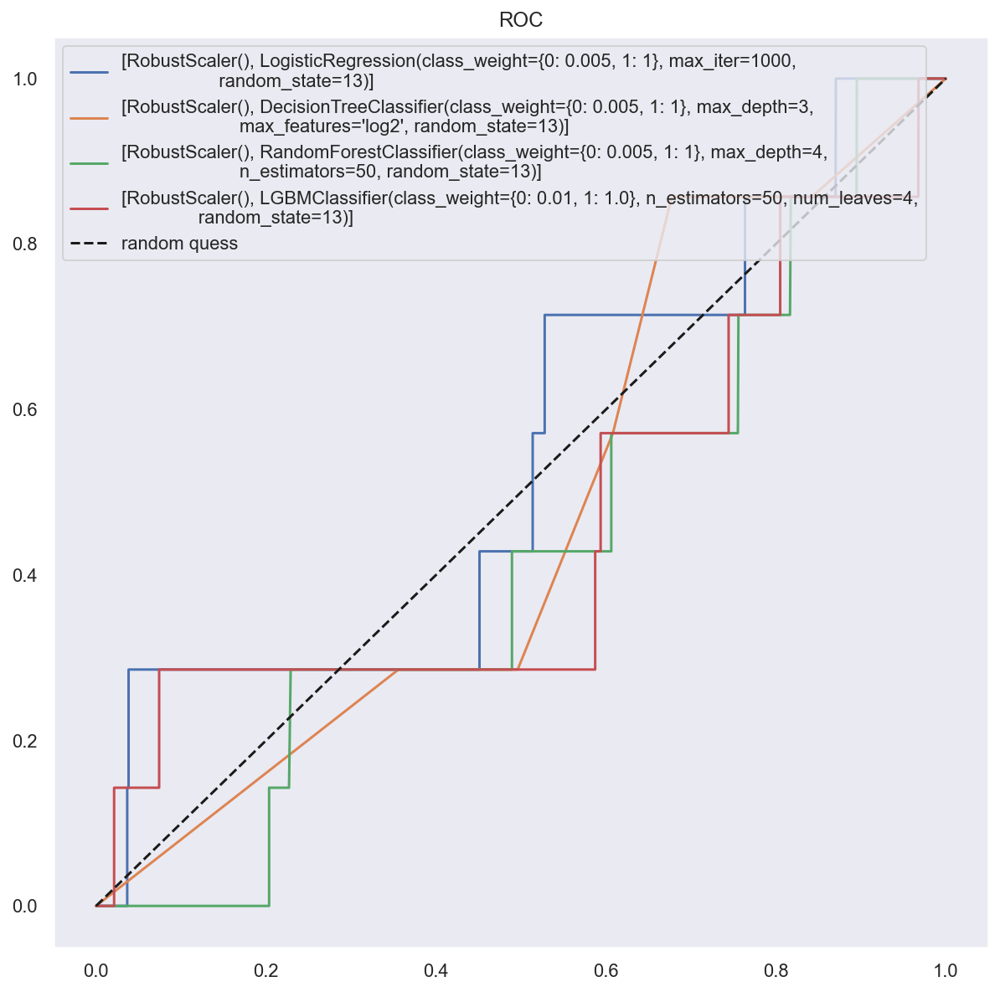

In [76]:
# null 삭제
socar_strange_delete = socar.drop(['c_15', 'c_16', 'c_21', 'c_22', 'c_23', 'c_24'], axis=1)
# 1hot
columns_1hot = socar_strange_delete.columns.drop(['c_1', 'c_3', 'c_5', 'c_10', 'c_11', 'c_18', 'c_19', 'c_8', 'c_20', 'c_25'])
socar_strange_delete_1hot = pd.get_dummies(socar_strange_delete, columns=columns_1hot)
# 데이터 분리
X_train, X_test, y_train, y_test = ut.split_train_test(socar_strange_delete_1hot)
# sampling to SMOTE (default)
X_train_over, y_train_over = ut.fit_sampler(X_train, y_train, sampler='SMOTE')
# evaluation
cv_list31, result_df31 = ut.fit_cv(X_train_over, y_train_over, X_test, y_test, scaler='RB')

In [77]:
result_df31['class_weight'] = [1] * len(result_df31)
result_df31["null_del"] = [1]  * len(result_df31)
result_df31["encoded"] = [1]  * len(result_df31)
result_df31["scaler"] = ["RB"]  * len(result_df31)
result_df31["sampler"] = ["SMOTE"]  * len(result_df31)
result_df31 = result_df31[['class_weight', 'null_del', 'encoded', 'scaler', 'sampler', 'classifier', 'train accuracy', 'train precision',
                             'train recall', 'train f1', 'train auc', 'test accuracy', 'test precision', 'test recall',
                             'test f1', 'test auc']]
result_df31

,class_weight,null_del,encoded,scaler,sampler,classifier,train accuracy,train precision,train recall,train f1,train auc,test accuracy,test precision,test recall,test f1,test auc
0,1,1,1,RB,SMOTE,LogisticReg,0.782646,0.697113,0.999609,0.821396,0.782646,0.507209,0.001952,0.428571,0.003886,0.467979
1,1,1,1,RB,SMOTE,DecisionTree,0.621837,0.569377,0.999922,0.725588,0.621837,0.323614,0.002836,0.857143,0.005652,0.589779
2,1,1,1,RB,SMOTE,RandomForest,0.560059,0.531948,1.000000,0.694473,0.560059,0.122717,0.002187,0.857143,0.004364,0.489105
3,1,1,1,RB,SMOTE,LightGBM,0.835403,0.752454,0.999688,0.858628,0.835403,0.655239,0.001864,0.285714,0.003704,0.470892
4,1,1,1,RB,SMOTE,SVC,0.992424,0.999129,0.985708,0.992373,0.992424,0.997437,0.000000,0.000000,0.000000,0.499839


## 서른두번째
### (1) NULL값 삭제, (2)데이터 분리, (3) ADASYN, (4) Robust

==Split Result==
y_train :  [[0, 1], [12804, 34]]
y_test : [[0, 1], [3114, 7]]
==Sampling Result==
y_train :  [[0, 1], [12804, 34]]
y_train_over : [[0, 1], [12804, 12794]]
[Pipeline] ............ (step 1 of 2) Processing scaler, total=   0.0s
[Pipeline] ............... (step 2 of 2) Processing clf, total=   0.2s
====Done Evaluation====
====Done Evaluation====


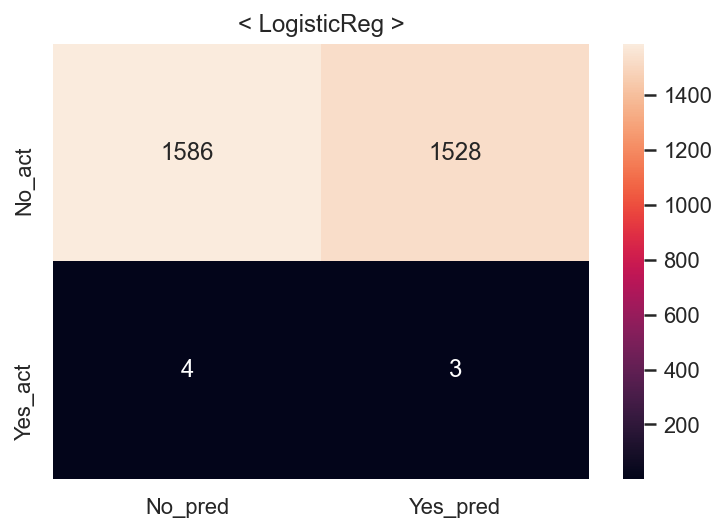

[Pipeline] ............ (step 1 of 2) Processing scaler, total=   0.0s
[Pipeline] ............... (step 2 of 2) Processing clf, total=   0.0s
====Done Evaluation====
====Done Evaluation====


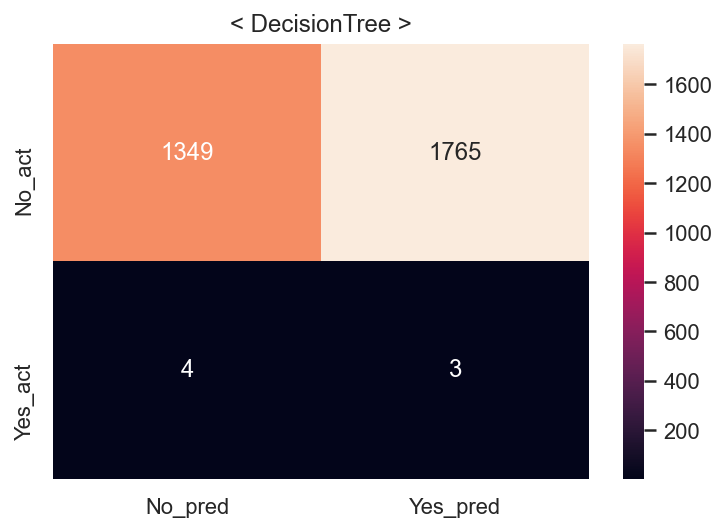

[Pipeline] ............ (step 1 of 2) Processing scaler, total=   0.0s
[Pipeline] ............... (step 2 of 2) Processing clf, total=   0.3s
====Done Evaluation====
====Done Evaluation====


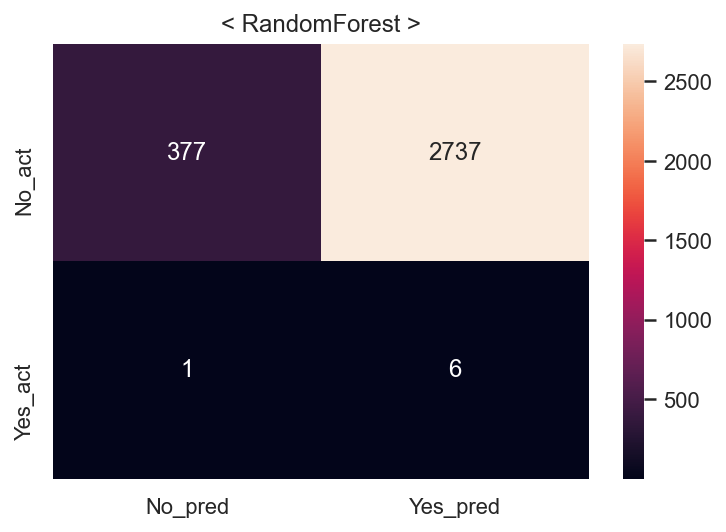

[Pipeline] ............ (step 1 of 2) Processing scaler, total=   0.0s
[Pipeline] ............... (step 2 of 2) Processing clf, total=   0.1s
====Done Evaluation====
====Done Evaluation====


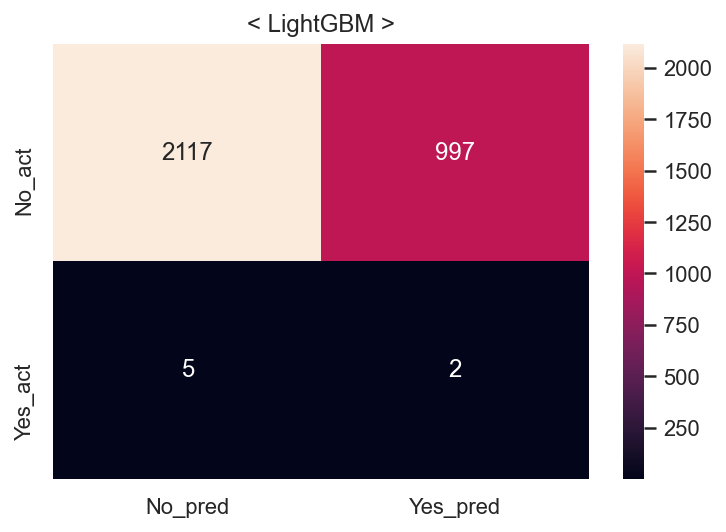

[Pipeline] ............ (step 1 of 2) Processing scaler, total=   0.0s
[Pipeline] ............... (step 2 of 2) Processing clf, total=   9.8s
====Done Evaluation====
====Done Evaluation====


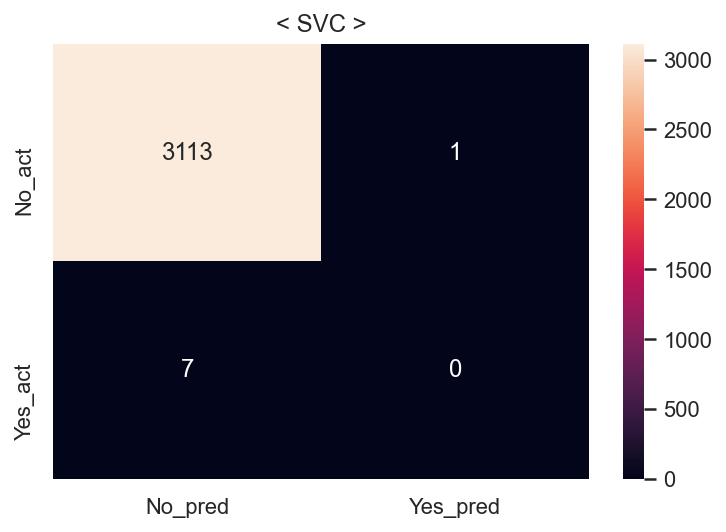

Fit time : 3.69 min


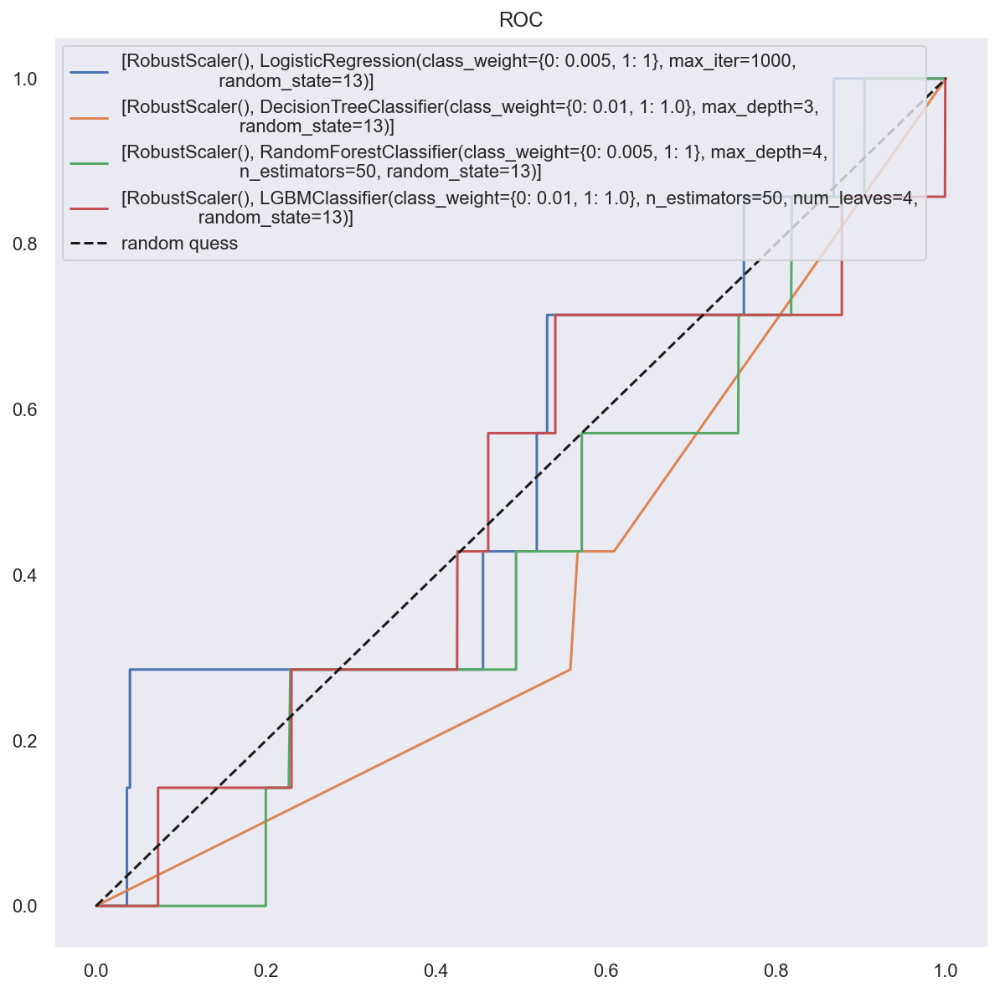

In [78]:
# null 삭제
socar_strange_delete = socar.drop(['c_15', 'c_16', 'c_21', 'c_22', 'c_23', 'c_24'], axis=1)
# 1hot
columns_1hot = socar_strange_delete.columns.drop(['c_1', 'c_3', 'c_5', 'c_10', 'c_11', 'c_18', 'c_19', 'c_8', 'c_20', 'c_25'])
socar_strange_delete_1hot = pd.get_dummies(socar_strange_delete, columns=columns_1hot)
# 데이터 분리
X_train, X_test, y_train, y_test = ut.split_train_test(socar_strange_delete_1hot)
# sampling to SMOTE (default)
X_train_over, y_train_over = ut.fit_sampler(X_train, y_train, sampler='ADASYN')
# evaluation
cv_list32, result_df32 = ut.fit_cv(X_train_over, y_train_over, X_test, y_test, scaler='RB')

In [79]:
result_df32['class_weight'] = [1] * len(result_df32)
result_df32["null_del"] = [1]  * len(result_df32)
result_df32["encoded"] = [1]  * len(result_df32)
result_df32["scaler"] = ["RB"]  * len(result_df32)
result_df32["sampler"] = ["ADASYN"]  * len(result_df32)
result_df32 = result_df32[['class_weight', 'null_del', 'encoded', 'scaler', 'sampler', 'classifier', 'train accuracy', 'train precision',
                             'train recall', 'train f1', 'train auc', 'test accuracy', 'test precision', 'test recall',
                             'test f1', 'test auc']]
result_df32

,class_weight,null_del,encoded,scaler,sampler,classifier,train accuracy,train precision,train recall,train f1,train auc,test accuracy,test precision,test recall,test f1,test auc
0,1,1,1,RB,ADASYN,LogisticReg,0.782600,0.696986,0.999609,0.821308,0.782685,0.509132,0.001960,0.428571,0.003901,0.468942
1,1,1,1,RB,ADASYN,DecisionTree,0.656028,0.592359,0.999844,0.743959,0.656162,0.433194,0.001697,0.428571,0.003380,0.430888
2,1,1,1,RB,ADASYN,RandomForest,0.560591,0.532152,1.000000,0.694647,0.560762,0.122717,0.002187,0.857143,0.004364,0.489105
3,1,1,1,RB,ADASYN,LightGBM,0.836198,0.753313,0.999609,0.859158,0.836262,0.678949,0.002002,0.285714,0.003976,0.482774
4,1,1,1,RB,ADASYN,SVC,0.992734,0.999129,0.986322,0.992684,0.992731,0.997437,0.000000,0.000000,0.000000,0.499839


In [80]:
# 끝
total = pd.concat([result_df, result_df2, result_df3, result_df4, 
                        result_df5, result_df6, result_df7, result_df8,
                        result_df9, result_df10, result_df11, result_df12,
                        result_df13, result_df14, result_df15, result_df16, 
                        result_df17, result_df18, result_df19, result_df20,
                        result_df21, result_df22, result_df23, result_df24,
                        result_df25, result_df26, result_df27, result_df28,
                        result_df29, result_df30, result_df31, result_df32], axis=0).reset_index(drop=True)
print(total.shape)
total

(160, 16)


,class_weight,null_del,encoded,scaler,sampler,classifier,train accuracy,train precision,train recall,train f1,train auc,test accuracy,test precision,test recall,test f1,test auc
0,1,0,0,None,SMOTE,LogisticReg,0.500156,0.500078,1.000000,0.666736,0.500156,0.002563,0.002244,1.000000,0.004477,0.500161
1,1,0,0,None,SMOTE,DecisionTree,0.580405,0.543721,0.999922,0.704410,0.580405,0.159564,0.002283,0.857143,0.004554,0.507570
2,1,0,0,None,SMOTE,RandomForest,0.618283,0.567076,1.000000,0.723737,0.618283,0.233579,0.002088,0.714286,0.004163,0.473392
3,1,0,0,None,SMOTE,LightGBM,0.800804,0.715156,0.999844,0.833871,0.800804,0.576418,0.000759,0.142857,0.001511,0.360125
4,1,0,0,None,SMOTE,SVC,0.611332,0.657427,0.464933,0.544673,0.611332,0.758411,0.002663,0.285714,0.005277,0.522594
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
155,1,1,1,RB,ADASYN,LogisticReg,0.782600,0.696986,0.999609,0.821308,0.782685,0.509132,0.001960,0.428571,0.003901,0.468942
156,1,1,1,RB,ADASYN,DecisionTree,0.656028,0.592359,0.999844,0.743959,0.656162,0.433194,0.001697,0.428571,0.003380,0.430888
157,1,1,1,RB,ADASYN,RandomForest,0.560591,0.532152,1.000000,0.694647,0.560762,0.122717,0.002187,0.857143,0.004364,0.489105
158,1,1,1,RB,ADASYN,LightGBM,0.836198,0.753313,0.999609,0.859158,0.836262,0.678949,0.002002,0.285714,0.003976,0.482774


In [81]:
total.to_csv('SMOTE_and_ADASYN_classweight_result.csv', encoding='utf-8', index=False)

# class weight 전/후 비교

In [82]:
pd.read_csv('SMOTE_and_ADASYN_result.csv')

,class_weight,null_del,encoded,scaler,sampler,classifier,train accuracy,train precision,train recall,train f1,train auc,test accuracy,test precision,test recall,test f1,test auc
0,0,0,0,None,SMOTE,LogisticReg,0.536317,0.518843,1.000000,0.683208,0.536317,0.079462,0.002085,0.857143,0.004159,0.467428
1,0,0,0,None,SMOTE,DecisionTree,1.000000,1.000000,1.000000,1.000000,1.000000,0.986543,0.000000,0.000000,0.000000,0.494380
2,0,0,0,None,SMOTE,RandomForest,0.999844,1.000000,0.999688,0.999844,0.999844,0.996155,0.000000,0.000000,0.000000,0.499197
3,0,0,0,None,SMOTE,LightGBM,0.990394,0.982703,0.998360,0.990470,0.990394,0.977251,0.000000,0.000000,0.000000,0.489724
4,0,0,0,None,SMOTE,SVC,0.505037,0.502531,1.000000,0.668913,0.505037,0.016341,0.002275,1.000000,0.004540,0.507065
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
155,0,1,1,RB,ADASYN,LogisticReg,0.998672,1.000000,0.997343,0.998669,0.998671,0.997757,0.000000,0.000000,0.000000,0.500000
156,0,1,1,RB,ADASYN,DecisionTree,0.766193,0.707985,0.905815,0.794774,0.766247,0.467158,0.001805,0.428571,0.003595,0.447908
157,0,1,1,RB,ADASYN,RandomForest,0.974256,0.952023,0.998828,0.974864,0.974265,0.943287,0.000000,0.000000,0.000000,0.472704
158,0,1,1,RB,ADASYN,LightGBM,0.998828,1.000000,0.997655,0.998826,0.998828,0.997757,0.000000,0.000000,0.000000,0.500000


In [83]:
pd.read_csv('SMOTE_and_ADASYN_classweight_result.csv')

,class_weight,null_del,encoded,scaler,sampler,classifier,train accuracy,train precision,train recall,train f1,train auc,test accuracy,test precision,test recall,test f1,test auc
0,1,0,0,None,SMOTE,LogisticReg,0.500156,0.500078,1.000000,0.666736,0.500156,0.002563,0.002244,1.000000,0.004477,0.500161
1,1,0,0,None,SMOTE,DecisionTree,0.580405,0.543721,0.999922,0.704410,0.580405,0.159564,0.002283,0.857143,0.004554,0.507570
2,1,0,0,None,SMOTE,RandomForest,0.618283,0.567076,1.000000,0.723737,0.618283,0.233579,0.002088,0.714286,0.004163,0.473392
3,1,0,0,None,SMOTE,LightGBM,0.800804,0.715156,0.999844,0.833871,0.800804,0.576418,0.000759,0.142857,0.001511,0.360125
4,1,0,0,None,SMOTE,SVC,0.611332,0.657427,0.464933,0.544673,0.611332,0.758411,0.002663,0.285714,0.005277,0.522594
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
155,1,1,1,RB,ADASYN,LogisticReg,0.782600,0.696986,0.999609,0.821308,0.782685,0.509132,0.001960,0.428571,0.003901,0.468942
156,1,1,1,RB,ADASYN,DecisionTree,0.656028,0.592359,0.999844,0.743959,0.656162,0.433194,0.001697,0.428571,0.003380,0.430888
157,1,1,1,RB,ADASYN,RandomForest,0.560591,0.532152,1.000000,0.694647,0.560762,0.122717,0.002187,0.857143,0.004364,0.489105
158,1,1,1,RB,ADASYN,LightGBM,0.836198,0.753313,0.999609,0.859158,0.836262,0.678949,0.002002,0.285714,0.003976,0.482774
